In [1]:
# Import required packages 

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import dtreeviz
import graphviz.backend as be
from dtreeviz.trees import *
import missingno as msno
from tabulate import tabulate
from scipy import stats
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE 


from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression # logistic regression
from sklearn.svm import SVC # support vector Machine
from sklearn.ensemble import RandomForestClassifier # Random Forest
from sklearn.neighbors import KNeighborsClassifier # KNN
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier # Decision Tree
from sklearn.model_selection import train_test_split # training and testing data split
from sklearn.metrics import precision_recall_curve, average_precision_score, roc_curve, auc
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score, log_loss, confusion_matrix, classification_report

sns.set_theme(style="whitegrid")

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline


In [2]:
# Load dataset
path = r'datasets/bank-additional-full.csv'
df = pd.read_csv(path, sep=';', index_col=False, low_memory=False)


In [3]:
df.head()


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [4]:
df.tail()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41187,74,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,3,999,1,failure,-1.1,94.767,-50.8,1.028,4963.6,no


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [6]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [7]:
df.shape

(41188, 21)

In [8]:
df.dtypes

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                  object
dtype: object

In [9]:
# Change object data type to categorical data type
df = df.astype({'job':'category', 'marital':'category', 'education':'category', 'default':'category', 'housing':'category', 'loan':'category', 'contact':'category', 'month':'category', 'day_of_week':'category', 'poutcome':'category', 'y':'category'})


In [10]:
df.dtypes


age                  int64
job               category
marital           category
education         category
default           category
housing           category
loan              category
contact           category
month             category
day_of_week       category
duration             int64
campaign             int64
pdays                int64
previous             int64
poutcome          category
emp.var.rate       float64
cons.price.idx     float64
cons.conf.idx      float64
euribor3m          float64
nr.employed        float64
y                 category
dtype: object

In [11]:
# Change column names
new_column_names = {
    'contact': 'contact_type',
    'duration': 'last_contact_duration',
    'pdays': 'passed_days',
    'poutcome': 'previous_outcome',
    'emp.var.rate': 'employment_variation_rate', 
    'cons.price.idx': 'consumer_price_index', 
    'cons.conf.idx': 'consumer_confidence_index', 
    'nr.employed': 'number_of_employees' 
}

# Rename the columns
df.rename(columns=new_column_names, inplace=True)


In [12]:
# Create a column called has_term_deposit which is going to represent 0 for the negative class and 1 for the positive class.
df['has_term_deposit'] = (df.y == 'yes').astype('int')


### Data Cleaning

In [13]:
# Create a new column called age_band 
df['age_band'] = pd.cut(df['age'], [1, 20, 30, 40, 50, 60, 70, 80, 90, 100], 
                              labels=['1-20', '20-30', '30-40', '40-50','50-60','60-70','70-80', '80-90','90-100'])


In [14]:
df['job'] = df['job'].replace('unknown', 'other')


In [15]:
df['education'] = df['education'].replace('basic.4y', 'kindergarten_school')

In [16]:
df['education'] = df['education'].replace('basic.6y', 'primary_school')

In [17]:
df['education'] = df['education'].replace('basic.9y', 'secondary_school')

In [18]:
df['education'] = df['education'].replace('unknown', 'other')

In [19]:
df['education'].value_counts()

education
university.degree      12168
high.school             9515
secondary_school        6045
professional.course     5243
kindergarten_school     4176
primary_school          2292
other                   1731
illiterate                18
Name: count, dtype: int64

In [20]:
df['marital'] = df['marital'].replace('unknown', 'other')

In [21]:
df['default'] = df['default'].replace('unknown', 'not_applicable')

In [22]:
df['housing'] = df['housing'].replace('unknown', 'not_applicable')

In [23]:
df['loan'] = df['loan'].replace('unknown', 'not_applicable')

In [24]:
df['passed_days'] = df['passed_days'].replace(999, -1)

- passed_days: number of days that passed by after the client was last contacted from a previous campaign (numeric; -1 means client was not previously contacted)

- IMPORTANT NOTE: It is worth mentioning here that "was not previously contacted" is only in the context of a previous campaign and does not mean they were not previously contacted at all.

In [25]:
"""
The passed_days data indicates how many times the customer has been contacted before.

- if the passed_days = 0, it indicates that it has not been contacted before.
- if the passed_days = 1, it indicates that it was contacted earlier
"""

def passed_days_work(pdays):
    if(pdays == -1):
        return(0)
    elif(pdays >= 0):
        return(1)


df['new_passed_days'] = df['passed_days'].apply(passed_days_work)


In [26]:
df['age_band'].value_counts()

age_band
30-40     16385
40-50     10240
20-30      7243
50-60      6270
60-70       488
70-80       303
1-20        140
80-90       109
90-100       10
Name: count, dtype: int64

In [27]:
# Check the duplicated rows
df.duplicated().sum()


12

In [28]:
# Print duplicated values

"""
Duplicated rows can introduce bias and skew the analysis results. By removing duplicated rows, analysts can ensure the accuracy and integrity of the data, leading to more reliable insights and conclusions.
"""

duplicated_rows = df[df.duplicated(keep=False)]  # keep=False marks all occurrences as True
duplicated_rows


,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y,has_term_deposit,age_band,new_passed_days
1265,39,blue-collar,married,primary_school,no,no,no,telephone,may,thu,...,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no,0,30-40,0
1266,39,blue-collar,married,primary_school,no,no,no,telephone,may,thu,...,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no,0,30-40,0
12260,36,retired,married,other,no,no,no,telephone,jul,thu,...,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no,0,30-40,0
12261,36,retired,married,other,no,no,no,telephone,jul,thu,...,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no,0,30-40,0
14155,27,technician,single,professional.course,no,no,no,cellular,jul,mon,...,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no,0,20-30,0
14234,27,technician,single,professional.course,no,no,no,cellular,jul,mon,...,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no,0,20-30,0
16819,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,...,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no,0,40-50,0
16956,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,...,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no,0,40-50,0
18464,32,technician,single,professional.course,no,yes,no,cellular,jul,thu,...,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no,0,30-40,0
18465,32,technician,single,professional.course,no,yes,no,cellular,jul,thu,...,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no,0,30-40,0


In [29]:
"""
For duplicated values, we can do this:
    - Review and Understand.
    - Address Data Entry Issues.
    - Aggregate Duplicates.
    - Flag Duplicates.
    - Handle Partial Duplicates.
    - Identify and Remove Duplicates.
""" 

df = df.drop_duplicates()


In [30]:
df.duplicated().sum()


0

In [31]:
# Check the missing values
df.isnull().sum()

age                          0
job                          0
marital                      0
education                    0
default                      0
housing                      0
loan                         0
contact_type                 0
month                        0
day_of_week                  0
last_contact_duration        0
campaign                     0
passed_days                  0
previous                     0
previous_outcome             0
employment_variation_rate    0
consumer_price_index         0
consumer_confidence_index    0
euribor3m                    0
number_of_employees          0
y                            0
has_term_deposit             0
age_band                     0
new_passed_days              0
dtype: int64

<Axes: >

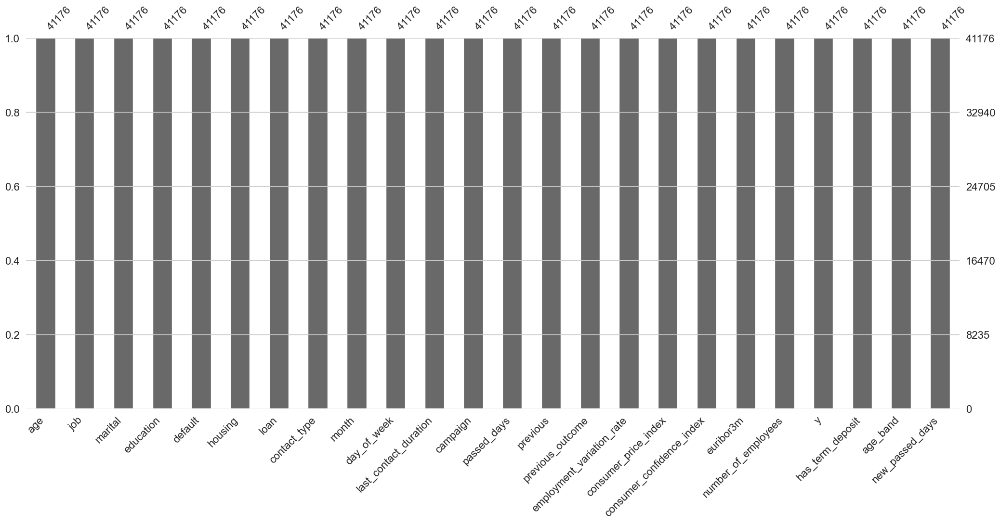

In [32]:
# Plot the missing values
msno.bar(df)


<Axes: >

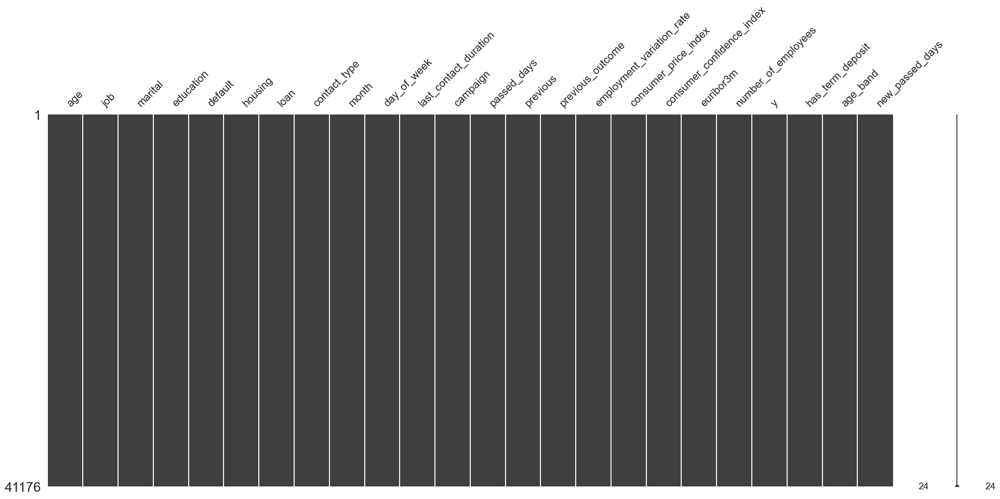

In [33]:
# Plot the missing values
msno.matrix(df)


In [34]:
df.shape

(41176, 24)

In [35]:
# Explore unique values and their counts in a specified column

def explore_column(df, column_name):

    unique_values = df[column_name].unique()
    value_counts = df[column_name].value_counts()
    
    return unique_values, value_counts


In [36]:
unique_values, value_counts = explore_column(df, 'age')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 91, 92, 94, 95, 98]

 ---------------------------------------- 

Value Counts:
age
31    1947
32    1845
33    1833
36    1779
35    1758
      ... 
89       2
91       2
94       1
87       1
95       1
Name: count, Length: 78, dtype: int64


In [37]:
unique_values, value_counts = explore_column(df, 'job')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
['admin.', 'blue-collar', 'entrepreneur', 'housemaid', 'management', 'other', 'retired', 'self-employed', 'services', 'student', 'technician', 'unemployed']

 ---------------------------------------- 

Value Counts:
job
admin.           10419
blue-collar       9253
technician        6739
services          3967
management        2924
retired           1718
entrepreneur      1456
self-employed     1421
housemaid         1060
unemployed        1014
student            875
other              330
Name: count, dtype: int64


In [38]:
unique_values, value_counts = explore_column(df, 'marital')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
['divorced', 'married', 'other', 'single']

 ---------------------------------------- 

Value Counts:
marital
married     24921
single      11564
divorced     4611
other          80
Name: count, dtype: int64


In [39]:
unique_values, value_counts = explore_column(df, 'education')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
['high.school', 'illiterate', 'kindergarten_school', 'other', 'primary_school', 'professional.course', 'secondary_school', 'university.degree']

 ---------------------------------------- 

Value Counts:
education
university.degree      12164
high.school             9512
secondary_school        6045
professional.course     5240
kindergarten_school     4176
primary_school          2291
other                   1730
illiterate                18
Name: count, dtype: int64


In [40]:
unique_values, value_counts = explore_column(df, 'default')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
['no', 'not_applicable', 'yes']

 ---------------------------------------- 

Value Counts:
default
no                32577
not_applicable     8596
yes                   3
Name: count, dtype: int64


In [41]:
unique_values, value_counts = explore_column(df, 'housing')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
['no', 'not_applicable', 'yes']

 ---------------------------------------- 

Value Counts:
housing
yes               21571
no                18615
not_applicable      990
Name: count, dtype: int64


In [42]:
unique_values, value_counts = explore_column(df, 'loan')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
['no', 'not_applicable', 'yes']

 ---------------------------------------- 

Value Counts:
loan
no                33938
yes                6248
not_applicable      990
Name: count, dtype: int64


In [43]:
unique_values, value_counts = explore_column(df, 'contact_type')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
['cellular', 'telephone']

 ---------------------------------------- 

Value Counts:
contact_type
cellular     26135
telephone    15041
Name: count, dtype: int64


In [44]:
unique_values, value_counts = explore_column(df, 'month')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
['apr', 'aug', 'dec', 'jul', 'jun', 'mar', 'may', 'nov', 'oct', 'sep']

 ---------------------------------------- 

Value Counts:
month
may    13767
jul     7169
aug     6176
jun     5318
nov     4100
apr     2631
oct      717
sep      570
mar      546
dec      182
Name: count, dtype: int64


In [45]:
unique_values, value_counts = explore_column(df, 'day_of_week')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
['fri', 'mon', 'thu', 'tue', 'wed']

 ---------------------------------------- 

Value Counts:
day_of_week
thu    8618
mon    8512
wed    8134
tue    8086
fri    7826
Name: count, dtype: int64


In [46]:
unique_values, value_counts = explore_column(df, 'last_contact_duration')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218,

In [47]:
unique_values, value_counts = explore_column(df, 'campaign')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37, 39, 40, 41, 42, 43, 56]

 ---------------------------------------- 

Value Counts:
campaign
1     17634
2     10568
3      5340
4      2650
5      1599
6       979
7       629
8       400
9       283
10      225
11      177
12      125
13       92
14       69
17       58
16       51
15       51
18       33
20       30
19       26
21       24
22       17
23       16
24       15
27       11
29       10
28        8
26        8
25        8
31        7
30        7
35        5
32        4
33        4
34        3
42        2
40        2
43        2
56        1
39        1
41        1
37        1
Name: count, dtype: int64


In [48]:
unique_values, value_counts = explore_column(df, 'passed_days')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[-1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 25, 26, 27]

 ---------------------------------------- 

Value Counts:
passed_days
-1     39661
 3       439
 6       412
 4       118
 9        64
 2        61
 7        60
 12       58
 10       52
 5        46
 13       36
 11       28
 1        26
 15       24
 14       20
 8        18
 0        15
 16       11
 17        8
 18        7
 22        3
 19        3
 21        2
 25        1
 26        1
 27        1
 20        1
Name: count, dtype: int64


In [49]:
unique_values, value_counts = explore_column(df, 'previous')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[0, 1, 2, 3, 4, 5, 6, 7]

 ---------------------------------------- 

Value Counts:
previous
0    35551
1     4561
2      754
3      216
4       70
5       18
6        5
7        1
Name: count, dtype: int64


In [50]:
unique_values, value_counts = explore_column(df, 'previous_outcome')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
['nonexistent', 'failure', 'success']
Categories (3, object): ['failure', 'nonexistent', 'success']

 ---------------------------------------- 

Value Counts:
previous_outcome
nonexistent    35551
failure         4252
success         1373
Name: count, dtype: int64


In [51]:
unique_values, value_counts = explore_column(df, 'employment_variation_rate')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[ 1.1  1.4 -0.1 -0.2 -1.8 -2.9 -3.4 -3.  -1.7 -1.1]

 ---------------------------------------- 

Value Counts:
employment_variation_rate
 1.4    16228
-1.8     9182
 1.1     7762
-0.1     3682
-2.9     1662
-3.4     1070
-1.7      773
-1.1      635
-3.0      172
-0.2       10
Name: count, dtype: int64


In [52]:
unique_values, value_counts = explore_column(df, 'consumer_price_index')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[93.994 94.465 93.918 93.444 93.798 93.2   92.756 92.843 93.075 92.893
 92.963 92.469 92.201 92.379 92.431 92.649 92.713 93.369 93.749 93.876
 94.055 94.215 94.027 94.199 94.601 94.767]

 ---------------------------------------- 

Value Counts:
consumer_price_index
93.994    7762
93.918    6681
92.893    5793
93.444    5173
94.465    4374
93.200    3615
93.075    2457
92.201     770
92.963     715
92.431     446
92.649     357
94.215     311
94.199     303
92.843     282
92.379     267
93.369     264
94.027     233
94.055     229
93.876     212
94.601     204
92.469     177
93.749     174
92.713     172
94.767     128
93.798      67
92.756      10
Name: count, dtype: int64


In [53]:
unique_values, value_counts = explore_column(df, 'consumer_confidence_index')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[-36.4 -41.8 -42.7 -36.1 -40.4 -42.  -45.9 -50.  -47.1 -46.2 -40.8 -33.6
 -31.4 -29.8 -26.9 -30.1 -33.  -34.8 -34.6 -40.  -39.8 -40.3 -38.3 -37.5
 -49.5 -50.8]

 ---------------------------------------- 

Value Counts:
consumer_confidence_index
-36.4    7762
-42.7    6681
-46.2    5793
-36.1    5173
-41.8    4374
-42.0    3615
-47.1    2457
-31.4     770
-40.8     715
-26.9     446
-30.1     357
-40.3     311
-37.5     303
-50.0     282
-29.8     267
-34.8     264
-38.3     233
-39.8     229
-40.0     212
-49.5     204
-33.6     177
-34.6     174
-33.0     172
-50.8     128
-40.4      67
-45.9      10
Name: count, dtype: int64


In [54]:
unique_values, value_counts = explore_column(df, 'euribor3m')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[4.857 4.856 4.855 4.859 4.86  4.858 4.864 4.865 4.866 4.967 4.961 4.959
 4.958 4.96  4.962 4.955 4.947 4.956 4.966 4.963 4.957 4.968 4.97  4.965
 4.964 5.045 5.    4.936 4.921 4.918 4.912 4.827 4.794 4.76  4.733 4.7
 4.663 4.592 4.474 4.406 4.343 4.286 4.245 4.223 4.191 4.153 4.12  4.076
 4.021 3.901 3.879 3.853 3.816 3.743 3.669 3.563 3.488 3.428 3.329 3.282
 3.053 1.811 1.799 1.778 1.757 1.726 1.703 1.687 1.663 1.65  1.64  1.629
 1.614 1.602 1.584 1.574 1.56  1.556 1.548 1.538 1.531 1.52  1.51  1.498
 1.483 1.479 1.466 1.453 1.445 1.435 1.423 1.415 1.41  1.405 1.406 1.4
 1.392 1.384 1.372 1.365 1.354 1.344 1.334 1.327 1.313 1.299 1.291 1.281
 1.266 1.25  1.244 1.259 1.264 1.27  1.262 1.26  1.268 1.286 1.252 1.235
 1.224 1.215 1.206 1.099 1.085 1.072 1.059 1.048 1.044 1.029 1.018 1.007
 0.996 0.979 0.969 0.944 0.937 0.933 0.927 0.921 0.914 0.908 0.903 0.899
 0.884 0.883 0.881 0.879 0.873 0.869 0.861 0.859 0.854 0.851 0.849 0.843
 0.838 0.834 0.829 0.825 0.821 0.819 0.8

In [55]:
unique_values, value_counts = explore_column(df, 'number_of_employees')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[5191.  5228.1 5195.8 5176.3 5099.1 5076.2 5017.5 5023.5 5008.7 4991.6
 4963.6]

 ---------------------------------------- 

Value Counts:
number_of_employees
5228.1    16228
5099.1     8532
5191.0     7762
5195.8     3682
5076.2     1662
5017.5     1070
4991.6      773
5008.7      650
4963.6      635
5023.5      172
5176.3       10
Name: count, dtype: int64


In [56]:
unique_values, value_counts = explore_column(df, 'has_term_deposit')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[0, 1]

 ---------------------------------------- 

Value Counts:
has_term_deposit
0    36537
1     4639
Name: count, dtype: int64


In [57]:
unique_values, value_counts = explore_column(df, 'age_band')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)

Unique Values:
['1-20', '20-30', '30-40', '40-50', '50-60', '60-70', '70-80', '80-90', '90-100']

 ---------------------------------------- 

Value Counts:
age_band
30-40     16380
40-50     10237
20-30      7241
50-60      6269
60-70       488
70-80       302
1-20        140
80-90       109
90-100       10
Name: count, dtype: int64


In [58]:
unique_values, value_counts = explore_column(df, 'new_passed_days')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[0, 1]

 ---------------------------------------- 

Value Counts:
new_passed_days
0    39661
1     1515
Name: count, dtype: int64


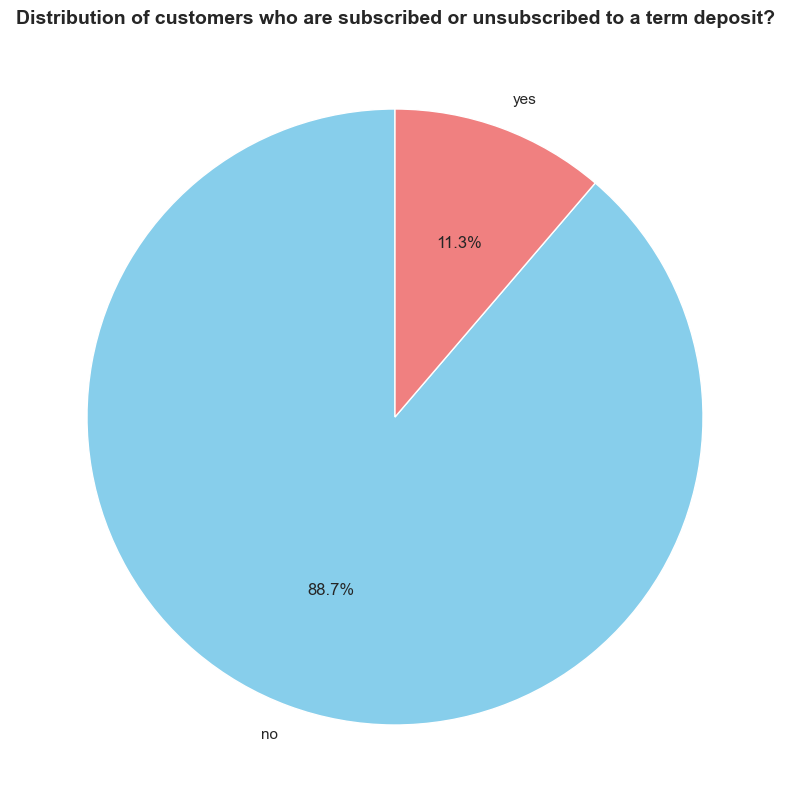

In [59]:
# Plot the (target) customers subscriptions to a term deposit

plt.figure(figsize=(20, 10))

counts = df['y'].value_counts()
labels = counts.index

plt.pie(counts, labels=labels, autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightcoral'])
plt.title('Distribution of customers who are subscribed or unsubscribed to a term deposit?', fontsize=14, fontweight='bold')
plt.show()


In [60]:
# Plot customers subscriptions to a term deposit
fig = px.pie(df, names='y', title='Distribution of customers who are subscribed or unsubscribed to a term deposit?')
fig.show()


In [61]:
df[list(df.columns)[:12]].sample(10)

,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,last_contact_duration,campaign
10267,40,blue-collar,single,secondary_school,no,no,no,telephone,jun,mon,55,2
24076,36,admin.,married,university.degree,no,yes,no,telephone,nov,wed,449,1
16228,28,technician,single,high.school,no,no,no,cellular,jul,tue,206,2
10424,50,services,single,high.school,no,no,no,telephone,jun,mon,162,3
32997,30,admin.,single,university.degree,no,no,no,telephone,may,mon,259,4
23030,40,technician,divorced,professional.course,no,yes,no,cellular,aug,tue,109,8
11600,28,admin.,single,university.degree,no,yes,no,telephone,jun,fri,12,14
17610,30,admin.,married,other,no,no,no,cellular,jul,mon,270,3
19910,36,admin.,married,university.degree,no,yes,no,cellular,aug,fri,194,2
29198,37,admin.,married,high.school,no,yes,no,cellular,apr,fri,207,1


In [62]:
df[list(df.columns)[12:]].sample(10)


,passed_days,previous,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y,has_term_deposit,age_band,new_passed_days
10564,-1,0,nonexistent,1.4,94.465,-41.8,4.961,5228.1,no,0,30-40,0
35570,-1,0,nonexistent,-1.8,92.893,-46.2,1.244,5099.1,no,0,50-60,0
38182,4,1,success,-3.4,92.431,-26.9,0.752,5017.5,no,0,20-30,1
27780,-1,1,failure,-1.8,92.843,-50.0,1.687,5099.1,no,0,70-80,0
11426,-1,0,nonexistent,1.4,94.465,-41.8,4.959,5228.1,no,0,40-50,0
26664,-1,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8,no,0,30-40,0
18982,-1,0,nonexistent,1.4,93.444,-36.1,4.970,5228.1,no,0,50-60,0
36363,3,2,success,-2.9,92.963,-40.8,1.262,5076.2,yes,1,30-40,1
33116,-1,0,nonexistent,-1.8,92.893,-46.2,1.291,5099.1,no,0,20-30,0
5372,-1,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,0,40-50,0


In [63]:
# Plot outliers for numerical variables using box plot

def plot_numerical_vars_with_outliers(df, column_name):
    plt.rcParams['axes.facecolor'] = '#f8fafc'
    plt.figure(figsize=(18, 10))

    sns.boxplot(x=df[column_name], palette='Paired')
    plt.title('Box Plot of Numerical Variables with Outliers')
    plt.show()
    

In [64]:
# Plot outliers for numerical variables using box plot (Plotly package)
def plot_numerical_vars_with_outliers_plotly(df, column_name, background_color='#f8fafc'):
    fig = go.Figure()

    # Add box plot
    fig.add_trace(go.Box(x=df[column_name], marker=dict(color='#f43f5e')))

    # Add mean as dotted line
    mean_value = df[column_name].mean()
    fig.add_trace(go.Scatter(x=[mean_value, mean_value], y=[0, 1], mode='lines', line=dict(dash='dash', color='black'), name='Mean'))

    # Update layout
    fig.update_layout(
        title=f'Box Plot of Numerical Variable {column_name} with Outliers',
        paper_bgcolor=background_color
    )

    fig.show()


In [65]:
# Plot distribution of categorical variables.
def plot_categorical_vars_distribution(df, column_name, background_color='#f8fafc', palette='pastel'):
    # Set background color
    plt.rcParams['axes.facecolor'] = background_color
    
    # Calculate percentage values
    total_count = len(df)
    percentage_values = (df[column_name].value_counts() / total_count) * 100

    # Create count plot
    plt.figure(figsize=(18, 10))
    ax = sns.countplot(x=df[column_name], palette=palette)

    # Add percentage labels and borders
    for p in ax.patches:
        percentage = f'{p.get_height() / total_count * 100:.2f}%'
        x = p.get_x() + p.get_width() / 2
        y = p.get_height()
        ax.annotate(percentage, (x, y), ha='center', va='bottom', fontsize=10, color='black')

    # Customize the plot
    plt.title(f'Count Plot of Categorical Variable - {column_name}')
    plt.xticks(rotation=90)
    sns.despine(left=True, bottom=True)  # Remove spines on the left and bottom

    # Show the plot
    plt.show()


In [66]:
# Plot distribution of categorical variables (Using Plotly)
def plot_categorical_vars_distribution_plotly(df, column_name, background_color='#f8fafc'):
    # Calculate percentage values
    total_count = len(df)
    percentage_values = (df[column_name].value_counts() / total_count) * 100

    # Create a DataFrame with count and percentage values
    count_df = df[column_name].value_counts().reset_index()
    count_df.columns = [column_name, 'count']
    count_df['percentage'] = (count_df['count'] / total_count) * 100

    # Create a bar plot using Plotly
    fig = px.bar(count_df, x=column_name, y='count', color=column_name,
                 labels={'x': column_name, 'y': 'Count'}, title=f'Count Plot of Categorical Variable - {column_name}',
                 color_discrete_sequence=px.colors.qualitative.Pastel)

    # Add percentage labels and borders
    for bar in fig.data:
        percentage = f'{count_df[count_df[column_name] == bar.name]["percentage"].values[0]:.2f}%'
        bar.update(text=percentage, hoverinfo='text')

    # Customize the layout
    fig.update_layout(
        paper_bgcolor=background_color,
        xaxis_tickangle=-45
    )

    # Show the plot
    fig.show()


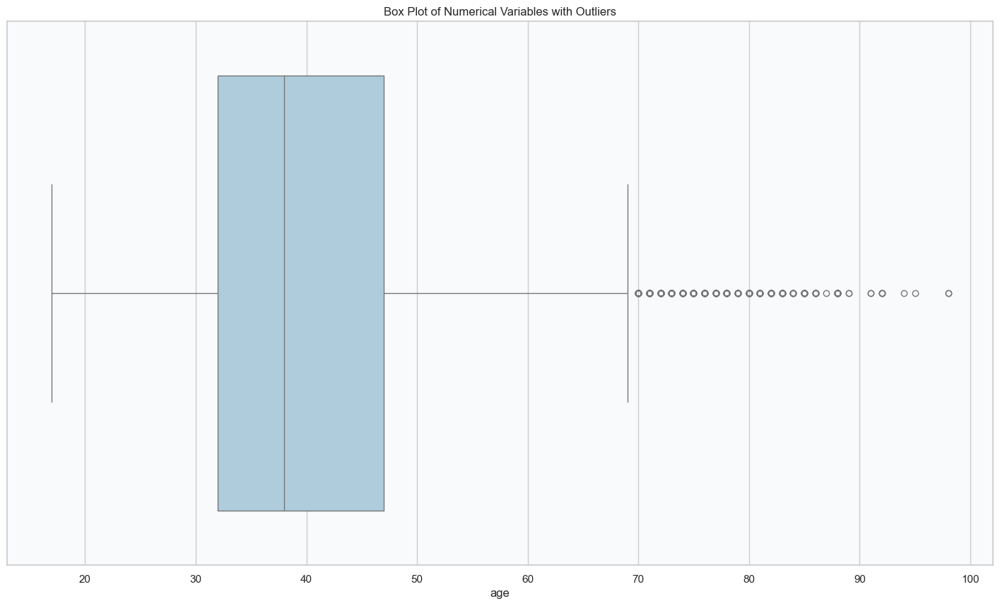

In [67]:
plot_numerical_vars_with_outliers(df, 'age')


In [68]:
plot_numerical_vars_with_outliers_plotly(df, 'age')

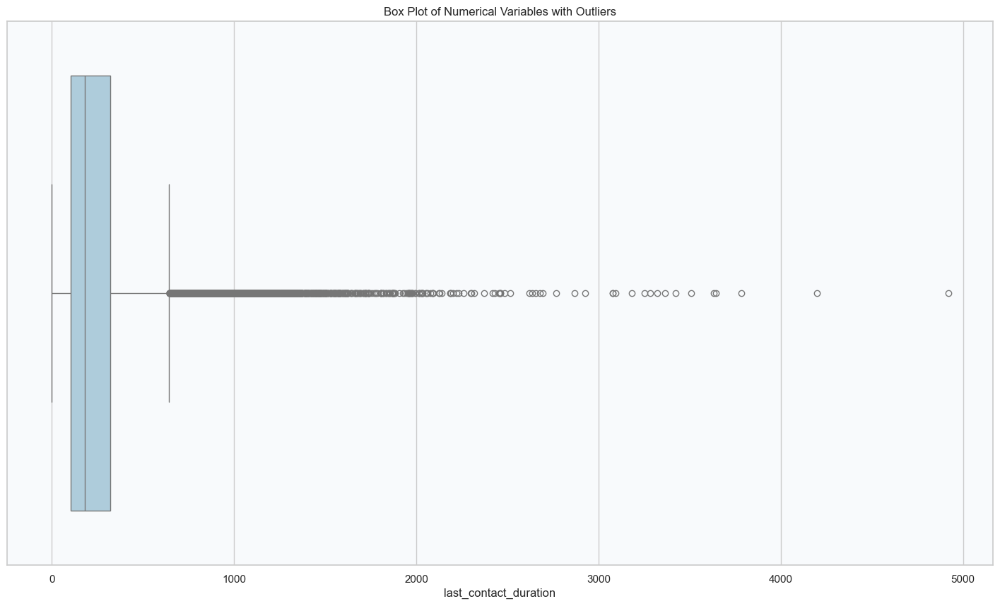

In [69]:
plot_numerical_vars_with_outliers(df, 'last_contact_duration')


In [70]:
plot_numerical_vars_with_outliers_plotly(df, 'last_contact_duration', '#E6ECF5')


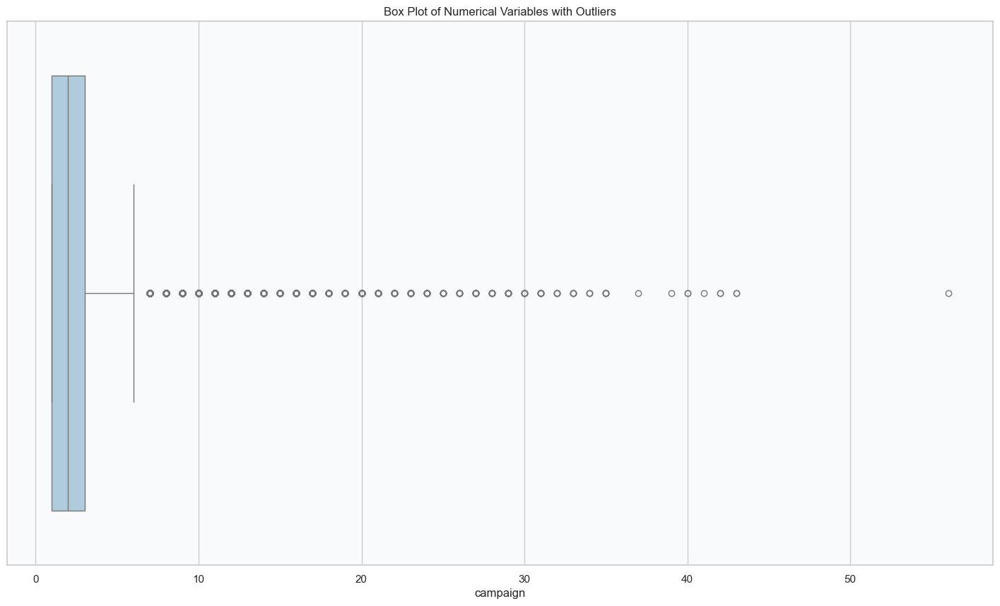

In [71]:
plot_numerical_vars_with_outliers(df, 'campaign')


In [72]:
plot_numerical_vars_with_outliers_plotly(df, 'campaign', '#E6ECF5')


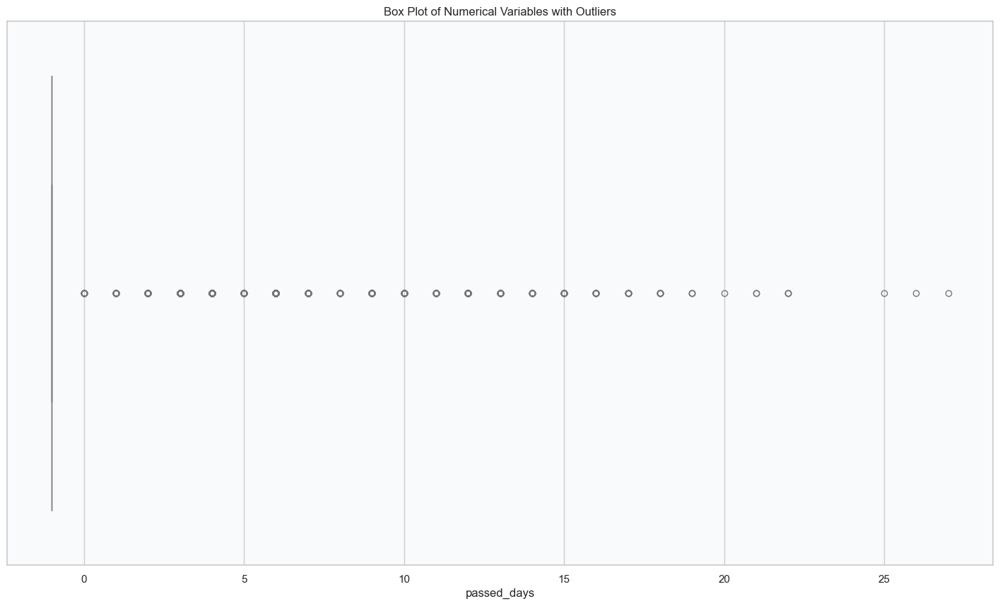

In [73]:
plot_numerical_vars_with_outliers(df, 'passed_days')


In [74]:
plot_numerical_vars_with_outliers_plotly(df, 'passed_days', '#E6ECF5')


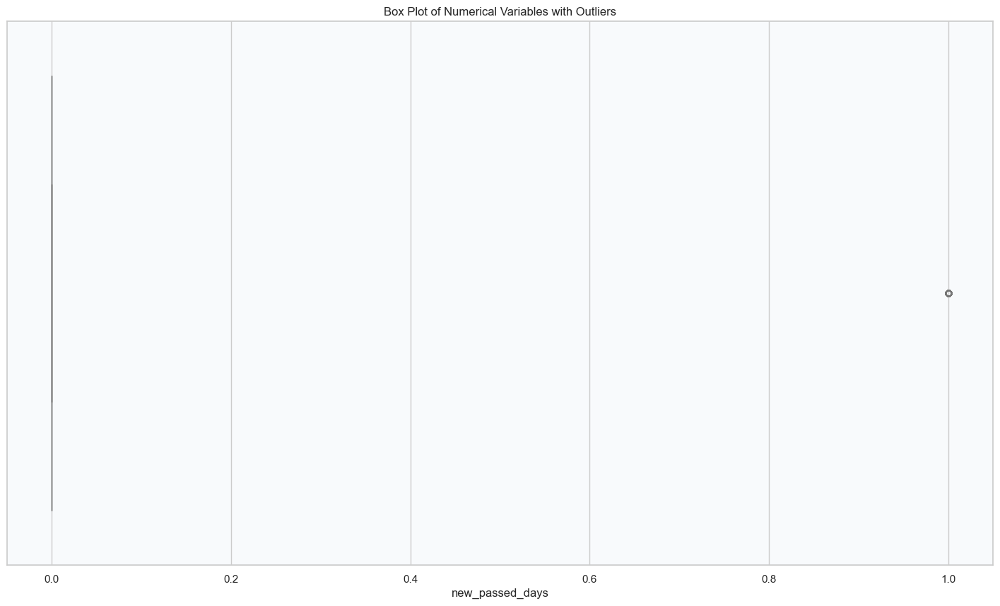

In [75]:
plot_numerical_vars_with_outliers(df, 'new_passed_days')


In [76]:
plot_numerical_vars_with_outliers_plotly(df, 'new_passed_days', '#E6ECF5')


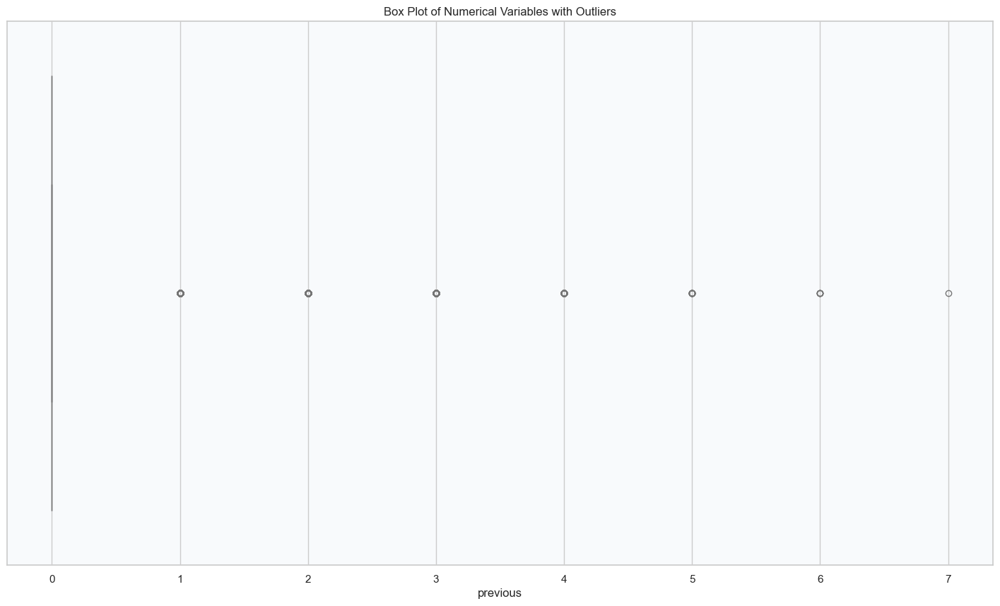

In [77]:
plot_numerical_vars_with_outliers(df, 'previous')


In [78]:
plot_numerical_vars_with_outliers_plotly(df, 'previous', '#E6ECF5')


### Handling outliers

In [79]:
# Create a copy of the dataset
df2 = df.copy()


In [80]:
# Using Z-scores [Count the number of outliers in a specific column of a dataset using Z-scores]

def detect_count_outliers(df, column_name, threshold=3):

    # Calculate Z-scores for the specified column
    z_scores = stats.zscore(df[column_name])

    # Identify outliers
    outliers_df = df[abs(z_scores) > threshold]

    # Count the number of outliers
    num_outliers = len(outliers_df)

    print(f"Number of outliers in '{column_name}': {num_outliers}")

    return num_outliers, outliers_df


In [81]:
# Handle outliers by replacing them with the median.
def handle_outliers_with_median(df, column_name, threshold=3):

    # Calculate Z-scores for the specified column
    z_scores = stats.zscore(df[column_name])

    # Replace outliers with the median
    df.loc[abs(z_scores) > threshold, column_name] = df[column_name].median()

    return df


In [82]:
num_outliers, outliers_df = detect_count_outliers(df2, 'age', threshold=3)
num_outliers
outliers_df


Number of outliers in 'age': 369


,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y,has_term_deposit,age_band,new_passed_days
27757,76,retired,married,university.degree,no,no,yes,cellular,mar,thu,...,nonexistent,-1.8,92.843,-50.0,1.757,5099.1,no,0,70-80,0
27780,73,retired,married,university.degree,no,yes,no,cellular,mar,tue,...,failure,-1.8,92.843,-50.0,1.687,5099.1,no,0,70-80,0
27800,88,retired,divorced,kindergarten_school,no,yes,no,cellular,mar,wed,...,nonexistent,-1.8,92.843,-50.0,1.663,5099.1,no,0,80-90,0
27802,88,retired,divorced,kindergarten_school,no,no,no,cellular,mar,wed,...,nonexistent,-1.8,92.843,-50.0,1.663,5099.1,yes,1,80-90,0
27805,88,retired,divorced,kindergarten_school,no,yes,yes,cellular,mar,wed,...,nonexistent,-1.8,92.843,-50.0,1.663,5099.1,yes,1,80-90,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40986,84,retired,divorced,kindergarten_school,not_applicable,yes,yes,cellular,oct,mon,...,success,-1.1,94.601,-49.5,1.000,4963.6,no,0,80-90,1
40996,81,retired,married,kindergarten_school,no,yes,no,cellular,oct,wed,...,failure,-1.1,94.601,-49.5,1.016,4963.6,yes,1,80-90,0
41004,80,retired,married,professional.course,no,yes,no,cellular,oct,thu,...,failure,-1.1,94.601,-49.5,1.025,4963.6,yes,1,70-80,0
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes,1,70-80,0


In [83]:
df2 = handle_outliers_with_median(df2, 'age', threshold=3)


In [84]:
num_outliers, outliers_df = detect_count_outliers(df2, 'age', threshold=3)
num_outliers
outliers_df


Number of outliers in 'age': 133


,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y,has_term_deposit,age_band,new_passed_days
27713,70,retired,divorced,kindergarten_school,no,yes,no,cellular,mar,mon,...,nonexistent,-1.8,92.843,-50.0,1.811,5099.1,yes,1,60-70,0
27837,70,retired,married,kindergarten_school,no,yes,no,cellular,mar,mon,...,failure,-1.8,92.843,-50.0,1.629,5099.1,no,0,60-70,0
27838,70,retired,married,kindergarten_school,no,no,no,cellular,mar,mon,...,failure,-1.8,92.843,-50.0,1.629,5099.1,no,0,60-70,0
27844,70,retired,married,kindergarten_school,no,yes,no,telephone,mar,mon,...,nonexistent,-1.8,92.843,-50.0,1.629,5099.1,no,0,60-70,0
27879,70,admin.,divorced,university.degree,no,no,no,cellular,mar,mon,...,nonexistent,-1.8,92.843,-50.0,1.560,5099.1,no,0,60-70,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40703,71,retired,married,high.school,no,no,no,cellular,sep,mon,...,nonexistent,-1.1,94.199,-37.5,0.879,4963.6,yes,1,70-80,0
40886,70,retired,married,kindergarten_school,not_applicable,no,no,cellular,oct,thu,...,failure,-1.1,94.601,-49.5,0.965,4963.6,no,0,60-70,1
40921,71,retired,married,professional.course,no,yes,no,cellular,oct,mon,...,nonexistent,-1.1,94.601,-49.5,0.977,4963.6,no,0,70-80,0
40933,71,retired,married,professional.course,no,no,no,cellular,oct,tue,...,nonexistent,-1.1,94.601,-49.5,0.982,4963.6,yes,1,70-80,0


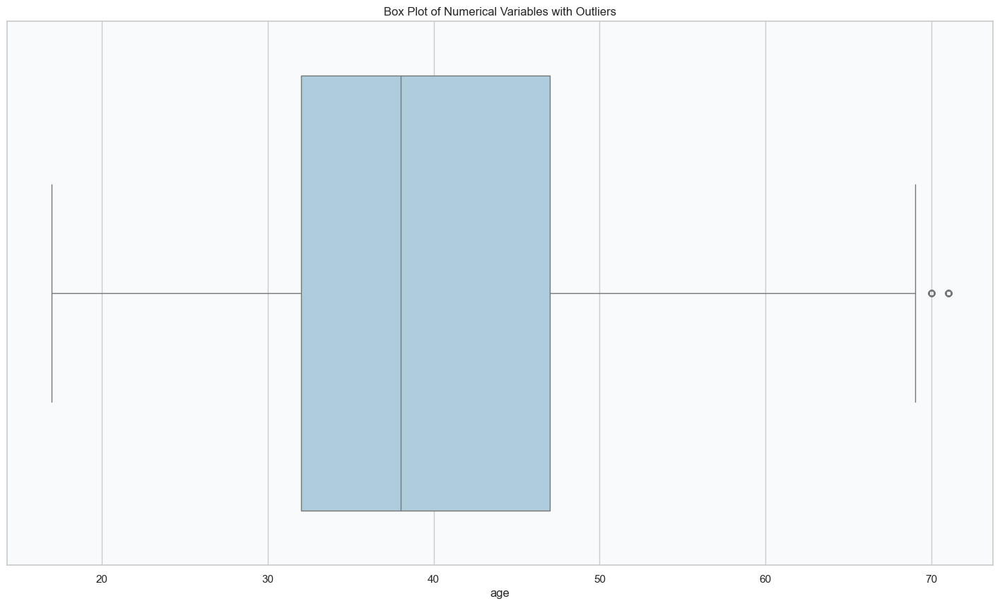

In [85]:
plot_numerical_vars_with_outliers(df2, 'age')


In [86]:
plot_numerical_vars_with_outliers_plotly(df2, 'age')


In [87]:
num_outliers, outliers_df = detect_count_outliers(df2, 'last_contact_duration', threshold=3)
num_outliers
outliers_df


Number of outliers in 'last_contact_duration': 861


,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y,has_term_deposit,age_band,new_passed_days
37,52,technician,married,secondary_school,no,yes,no,telephone,may,mon,...,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,0,50-60,0
75,41,blue-collar,divorced,kindergarten_school,not_applicable,yes,no,telephone,may,mon,...,nonexistent,1.1,93.994,-36.4,4.857,5191.0,yes,1,40-50,0
83,49,entrepreneur,married,university.degree,not_applicable,yes,no,telephone,may,mon,...,nonexistent,1.1,93.994,-36.4,4.857,5191.0,yes,1,40-50,0
88,49,technician,married,secondary_school,no,no,no,telephone,may,mon,...,nonexistent,1.1,93.994,-36.4,4.857,5191.0,yes,1,40-50,0
164,39,services,divorced,high.school,not_applicable,no,no,telephone,may,mon,...,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,0,30-40,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40880,28,admin.,single,high.school,no,no,no,cellular,oct,wed,...,nonexistent,-1.1,94.601,-49.5,0.959,4963.6,yes,1,20-30,0
40970,24,admin.,single,university.degree,no,yes,no,cellular,oct,fri,...,success,-1.1,94.601,-49.5,0.993,4963.6,yes,1,20-30,1
41121,46,admin.,single,university.degree,no,yes,no,cellular,nov,tue,...,failure,-1.1,94.767,-50.8,1.046,4963.6,no,0,40-50,0
41123,36,blue-collar,single,primary_school,no,no,no,cellular,nov,tue,...,nonexistent,-1.1,94.767,-50.8,1.046,4963.6,yes,1,30-40,0


In [88]:
df2 = handle_outliers_with_median(df2, 'last_contact_duration', threshold=3)


In [89]:
num_outliers, outliers_df = detect_count_outliers(df2, 'last_contact_duration', threshold=3)
num_outliers
outliers_df

Number of outliers in 'last_contact_duration': 886


,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y,has_term_deposit,age_band,new_passed_days
61,51,blue-collar,married,secondary_school,no,yes,no,telephone,may,mon,...,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,0,50-60,0
111,58,unemployed,married,kindergarten_school,not_applicable,no,no,telephone,may,mon,...,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,0,50-60,0
169,54,management,divorced,university.degree,no,yes,no,telephone,may,mon,...,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,0,50-60,0
276,34,services,married,high.school,no,no,no,telephone,may,mon,...,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,0,30-40,0
286,39,housemaid,married,secondary_school,no,yes,no,telephone,may,mon,...,nonexistent,1.1,93.994,-36.4,4.857,5191.0,yes,1,30-40,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40993,50,entrepreneur,divorced,university.degree,no,yes,no,telephone,oct,tue,...,success,-1.1,94.601,-49.5,1.008,4963.6,yes,1,40-50,1
41009,24,blue-collar,single,high.school,no,no,no,cellular,oct,thu,...,success,-1.1,94.601,-49.5,1.025,4963.6,yes,1,20-30,1
41052,65,retired,married,kindergarten_school,no,no,no,cellular,oct,wed,...,nonexistent,-1.1,94.601,-49.5,1.043,4963.6,yes,1,60-70,0
41122,34,technician,married,other,no,no,no,cellular,nov,tue,...,nonexistent,-1.1,94.767,-50.8,1.046,4963.6,yes,1,30-40,0


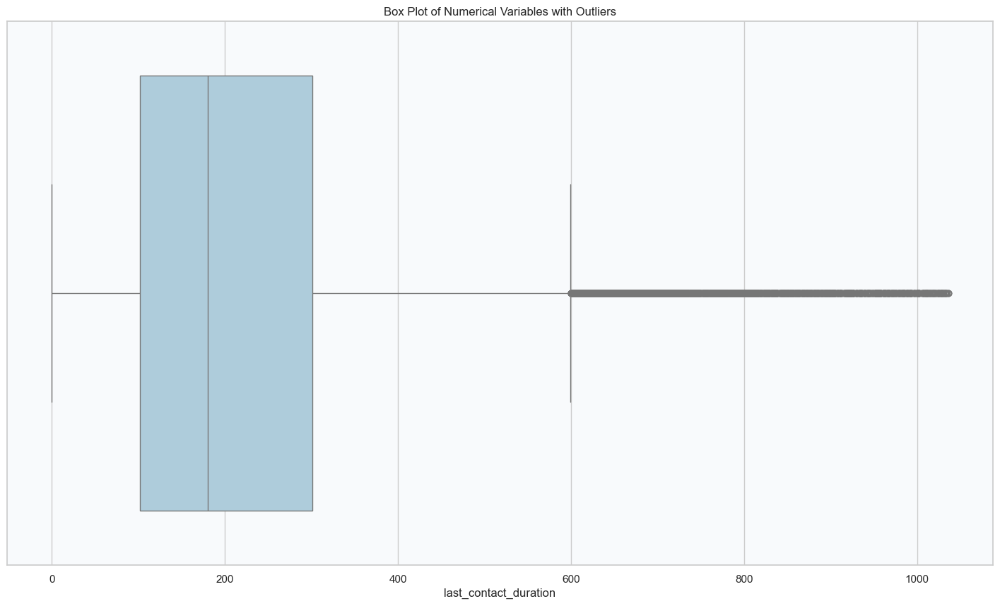

In [90]:
plot_numerical_vars_with_outliers(df2, 'last_contact_duration')

In [91]:
plot_numerical_vars_with_outliers_plotly(df2, 'last_contact_duration', '#E6ECF5')


In [92]:
num_outliers, outliers_df = detect_count_outliers(df2, 'campaign', threshold=3)
num_outliers
outliers_df


Number of outliers in 'campaign': 869


,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y,has_term_deposit,age_band,new_passed_days
2189,56,admin.,married,secondary_school,not_applicable,no,no,telephone,may,mon,...,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,0,50-60,0
2234,47,management,married,university.degree,no,no,no,telephone,may,mon,...,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,0,40-50,0
2554,31,admin.,married,high.school,not_applicable,yes,no,telephone,may,tue,...,nonexistent,1.1,93.994,-36.4,4.856,5191.0,no,0,30-40,0
2589,47,services,married,high.school,not_applicable,no,yes,telephone,may,tue,...,nonexistent,1.1,93.994,-36.4,4.856,5191.0,no,0,40-50,0
2590,47,blue-collar,married,professional.course,not_applicable,yes,no,telephone,may,tue,...,nonexistent,1.1,93.994,-36.4,4.856,5191.0,no,0,40-50,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37587,28,unemployed,married,professional.course,no,no,no,telephone,aug,fri,...,nonexistent,-2.9,92.201,-31.4,0.869,5076.2,no,0,20-30,0
37876,29,admin.,single,university.degree,no,yes,yes,cellular,aug,mon,...,nonexistent,-2.9,92.201,-31.4,0.821,5076.2,no,0,20-30,0
37893,52,admin.,married,other,no,no,no,telephone,sep,tue,...,failure,-3.4,92.379,-29.8,0.819,5017.5,no,0,50-60,1
40063,21,student,single,other,no,yes,yes,cellular,jul,thu,...,failure,-1.7,94.215,-40.3,0.810,4991.6,no,0,20-30,1


In [93]:
df2 = handle_outliers_with_median(df2, 'campaign', threshold=3)


In [94]:
num_outliers, outliers_df = detect_count_outliers(df2, 'campaign', threshold=3)
num_outliers
outliers_df

Number of outliers in 'campaign': 908


,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y,has_term_deposit,age_band,new_passed_days
1043,41,technician,single,university.degree,not_applicable,no,no,telephone,may,wed,...,nonexistent,1.1,93.994,-36.4,4.856,5191.0,no,0,40-50,0
1094,40,technician,married,professional.course,no,yes,no,telephone,may,wed,...,nonexistent,1.1,93.994,-36.4,4.856,5191.0,no,0,30-40,0
1467,38,admin.,single,university.degree,no,no,no,telephone,may,thu,...,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no,0,30-40,0
1484,38,blue-collar,married,primary_school,no,no,no,telephone,may,thu,...,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no,0,30-40,0
1866,54,management,married,kindergarten_school,not_applicable,no,no,telephone,may,fri,...,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no,0,50-60,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40176,31,admin.,married,high.school,no,no,no,cellular,jul,fri,...,nonexistent,-1.7,94.215,-40.3,0.861,4991.6,no,0,30-40,0
40332,25,student,single,high.school,no,yes,no,cellular,aug,mon,...,success,-1.7,94.027,-38.3,0.898,4991.6,no,0,20-30,1
40468,38,retired,married,other,no,no,no,cellular,aug,wed,...,failure,-1.7,94.027,-38.3,0.903,4991.6,no,0,70-80,0
40611,38,retired,married,secondary_school,no,no,no,telephone,sep,fri,...,failure,-1.1,94.199,-37.5,0.883,4963.6,no,0,70-80,0


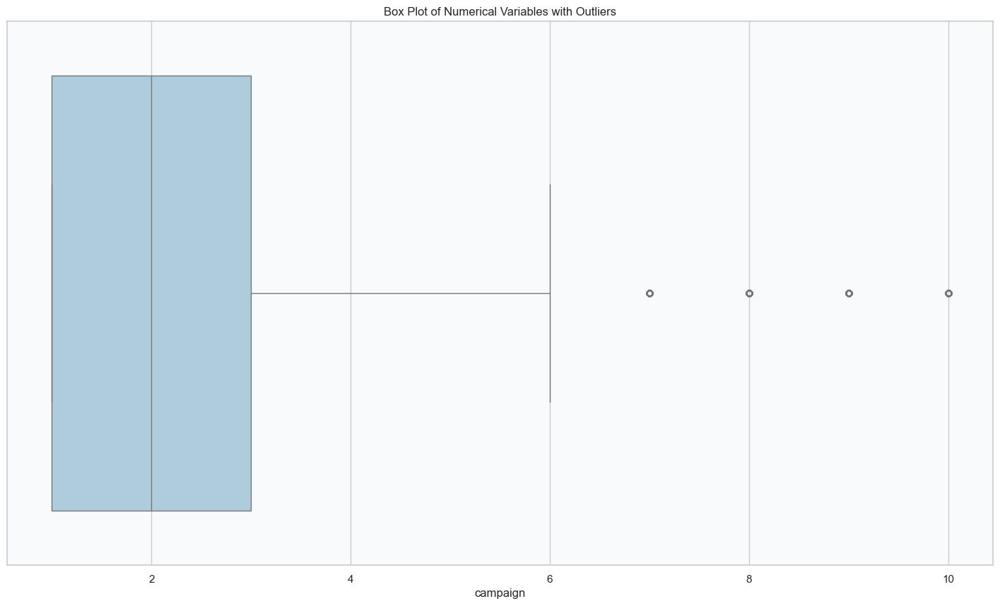

In [95]:
plot_numerical_vars_with_outliers(df2, 'campaign')


In [96]:
plot_numerical_vars_with_outliers_plotly(df2, 'campaign', '#E6ECF5')


In [97]:
num_outliers, outliers_df = detect_count_outliers(df2, 'passed_days', threshold=3)
num_outliers
outliers_df


Number of outliers in 'passed_days': 974


,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y,has_term_deposit,age_band,new_passed_days
24108,37,admin.,married,university.degree,no,yes,no,telephone,nov,wed,...,success,-0.1,93.200,-42.0,4.286,5195.8,no,0,30-40,1
24264,48,management,married,university.degree,no,yes,no,cellular,nov,mon,...,success,-0.1,93.200,-42.0,4.191,5195.8,no,0,40-50,1
24279,42,technician,married,professional.course,not_applicable,yes,no,cellular,nov,mon,...,success,-0.1,93.200,-42.0,4.191,5195.8,no,0,40-50,1
24482,36,self-employed,single,university.degree,no,yes,no,cellular,nov,mon,...,success,-0.1,93.200,-42.0,4.191,5195.8,no,0,30-40,1
24613,32,blue-collar,married,secondary_school,no,no,no,cellular,nov,mon,...,success,-0.1,93.200,-42.0,4.191,5195.8,yes,1,30-40,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41162,60,blue-collar,married,kindergarten_school,no,yes,no,cellular,nov,tue,...,success,-1.1,94.767,-50.8,1.035,4963.6,no,0,50-60,1
41163,35,technician,divorced,kindergarten_school,no,yes,no,cellular,nov,tue,...,success,-1.1,94.767,-50.8,1.035,4963.6,yes,1,30-40,1
41164,54,admin.,married,professional.course,no,no,no,cellular,nov,tue,...,success,-1.1,94.767,-50.8,1.035,4963.6,yes,1,50-60,1
41178,62,retired,married,university.degree,no,no,no,cellular,nov,thu,...,success,-1.1,94.767,-50.8,1.031,4963.6,yes,1,60-70,1


In [98]:
df2 = handle_outliers_with_median(df2, 'passed_days', threshold=3)


In [99]:
num_outliers, outliers_df = detect_count_outliers(df2, 'passed_days', threshold=3)
num_outliers
outliers_df


Number of outliers in 'passed_days': 526


,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y,has_term_deposit,age_band,new_passed_days
24397,50,entrepreneur,married,university.degree,not_applicable,yes,no,cellular,nov,mon,...,success,-0.1,93.200,-42.0,4.191,5195.8,no,0,40-50,1
24850,51,admin.,married,university.degree,no,no,no,cellular,nov,tue,...,success,-0.1,93.200,-42.0,4.153,5195.8,no,0,50-60,1
25504,35,self-employed,single,university.degree,no,no,yes,cellular,nov,wed,...,success,-0.1,93.200,-42.0,4.120,5195.8,no,0,30-40,1
26168,35,housemaid,single,kindergarten_school,not_applicable,yes,no,cellular,nov,wed,...,success,-0.1,93.200,-42.0,4.120,5195.8,no,0,30-40,1
26243,56,entrepreneur,married,university.degree,not_applicable,no,no,cellular,nov,thu,...,success,-0.1,93.200,-42.0,4.076,5195.8,no,0,50-60,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41109,34,technician,married,other,no,yes,no,cellular,nov,tue,...,success,-1.1,94.767,-50.8,1.046,4963.6,no,0,30-40,1
41110,34,technician,married,other,no,yes,no,cellular,nov,tue,...,success,-1.1,94.767,-50.8,1.046,4963.6,yes,1,30-40,1
41117,29,technician,single,professional.course,no,no,no,cellular,nov,tue,...,success,-1.1,94.767,-50.8,1.046,4963.6,yes,1,20-30,1
41132,41,unemployed,married,secondary_school,no,no,no,cellular,nov,thu,...,success,-1.1,94.767,-50.8,1.041,4963.6,yes,1,40-50,1


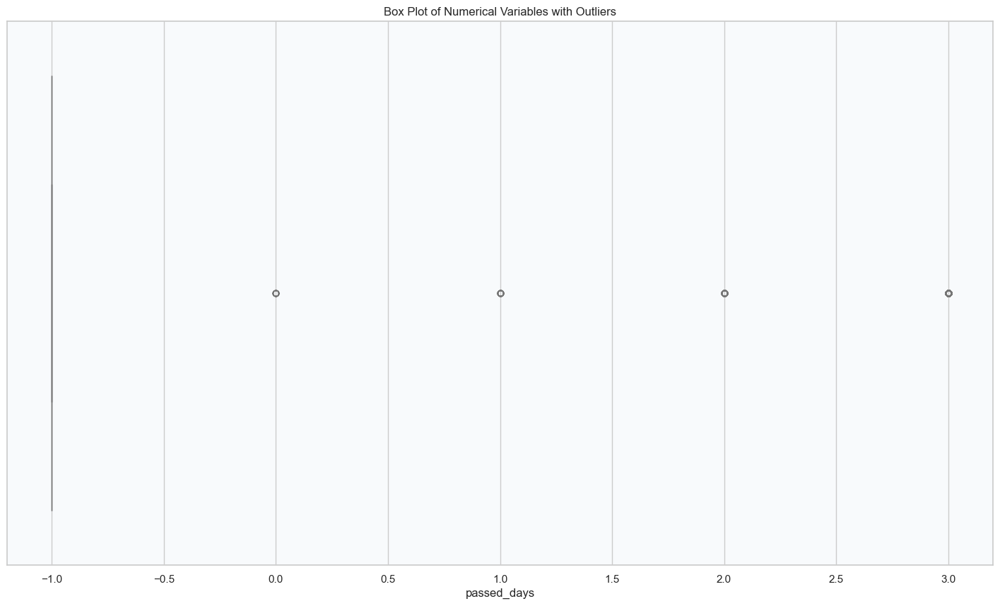

In [100]:
plot_numerical_vars_with_outliers(df2, 'passed_days')


In [101]:
plot_numerical_vars_with_outliers_plotly(df2, 'passed_days', '#E6ECF5')


In [102]:
num_outliers, outliers_df = detect_count_outliers(df2, 'previous', threshold=3)
num_outliers
outliers_df


Number of outliers in 'previous': 1064


,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y,has_term_deposit,age_band,new_passed_days
25996,35,management,married,university.degree,no,yes,yes,telephone,nov,wed,...,success,-0.1,93.200,-42.0,4.120,5195.8,no,0,30-40,1
27658,50,admin.,divorced,university.degree,no,yes,no,cellular,nov,fri,...,success,-0.1,93.200,-42.0,4.021,5195.8,no,0,40-50,1
27778,38,technician,married,university.degree,no,no,no,cellular,mar,tue,...,failure,-1.8,92.843,-50.0,1.687,5099.1,yes,1,30-40,0
27832,30,student,single,high.school,no,no,no,cellular,mar,fri,...,failure,-1.8,92.843,-50.0,1.640,5099.1,yes,1,20-30,1
27991,29,admin.,single,university.degree,no,yes,no,cellular,apr,wed,...,success,-1.8,93.075,-47.1,1.498,5099.1,no,0,20-30,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41170,40,management,divorced,university.degree,no,yes,no,cellular,nov,wed,...,failure,-1.1,94.767,-50.8,1.030,4963.6,no,0,30-40,0
41173,62,retired,married,university.degree,no,yes,no,cellular,nov,thu,...,failure,-1.1,94.767,-50.8,1.031,4963.6,yes,1,60-70,0
41174,62,retired,married,university.degree,no,yes,no,cellular,nov,thu,...,success,-1.1,94.767,-50.8,1.031,4963.6,yes,1,60-70,1
41175,34,student,single,other,no,yes,no,cellular,nov,thu,...,failure,-1.1,94.767,-50.8,1.031,4963.6,no,0,30-40,0


In [103]:
df2 = handle_outliers_with_median(df2, 'previous', threshold=3)


In [104]:
num_outliers, outliers_df = detect_count_outliers(df2, 'previous', threshold=3)
num_outliers
outliers_df


Number of outliers in 'previous': 0


,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y,has_term_deposit,age_band,new_passed_days


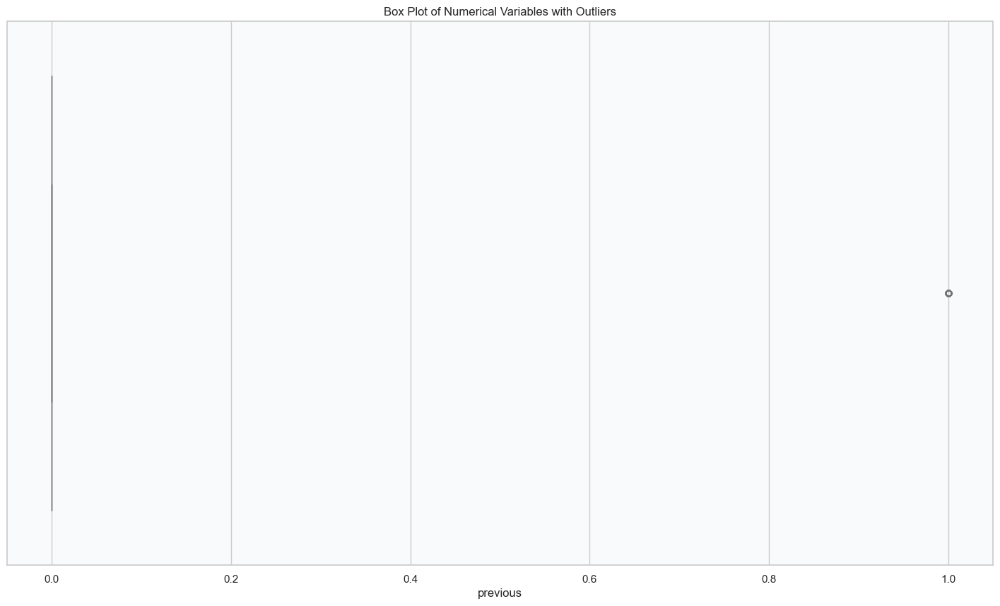

In [105]:
plot_numerical_vars_with_outliers(df2, 'previous')


In [106]:
plot_numerical_vars_with_outliers_plotly(df2, 'previous', '#E6ECF5')


In [107]:
num_outliers, outliers_df = detect_count_outliers(df2, 'employment_variation_rate', threshold=3)
num_outliers
outliers_df

Number of outliers in 'employment_variation_rate': 0


,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y,has_term_deposit,age_band,new_passed_days


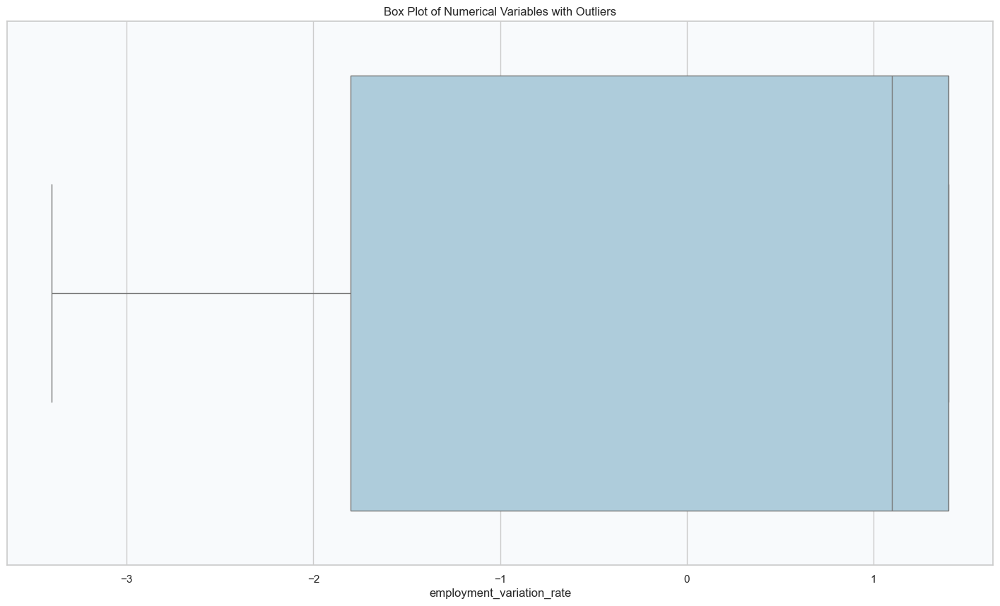

In [108]:
plot_numerical_vars_with_outliers(df2, 'employment_variation_rate')


In [109]:
plot_numerical_vars_with_outliers_plotly(df2, 'employment_variation_rate', '#E6ECF5')


In [110]:
num_outliers, outliers_df = detect_count_outliers(df2, 'consumer_price_index', threshold=3)
num_outliers
outliers_df


Number of outliers in 'consumer_price_index': 0


,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y,has_term_deposit,age_band,new_passed_days


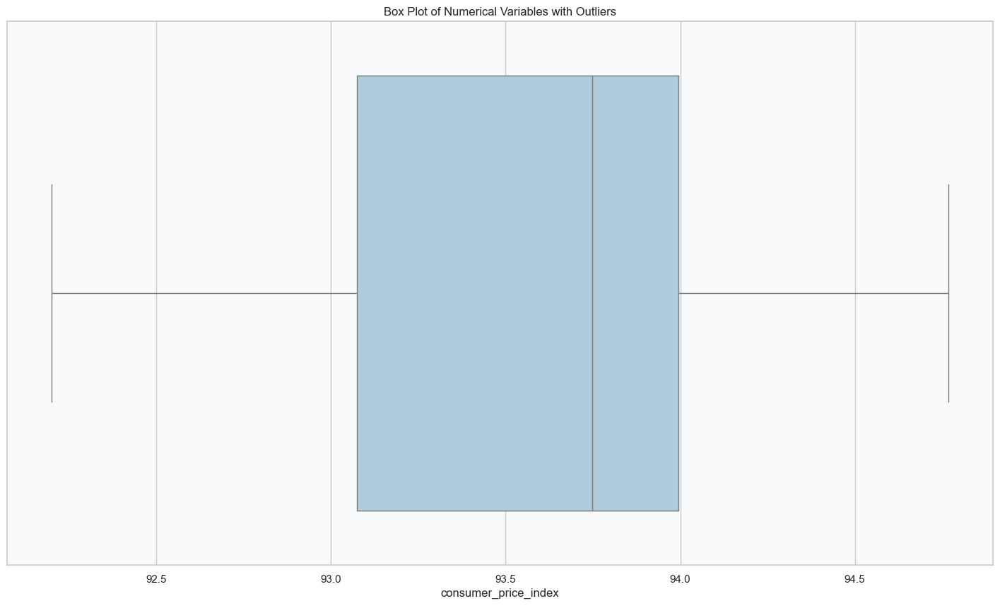

In [111]:
plot_numerical_vars_with_outliers(df2, 'consumer_price_index')


In [112]:
plot_numerical_vars_with_outliers_plotly(df2, 'consumer_price_index', '#E6ECF5')


In [113]:
num_outliers, outliers_df = detect_count_outliers(df2, 'consumer_confidence_index', threshold=3)
num_outliers
outliers_df


Number of outliers in 'consumer_confidence_index': 0


,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y,has_term_deposit,age_band,new_passed_days


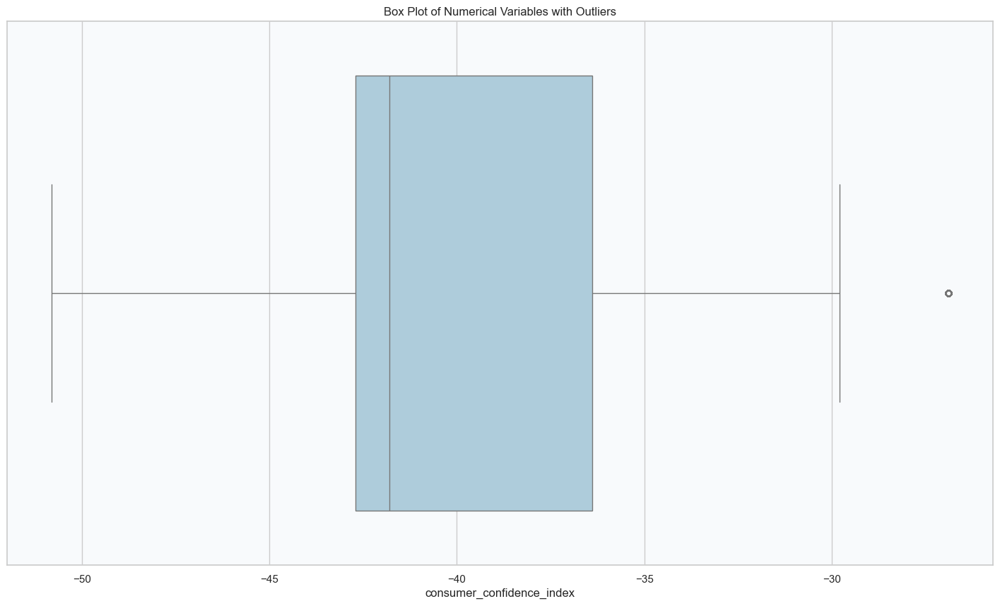

In [114]:
plot_numerical_vars_with_outliers(df2, 'consumer_confidence_index')


In [115]:
plot_numerical_vars_with_outliers_plotly(df2, 'consumer_confidence_index', '#E6ECF5')


In [116]:
num_outliers, outliers_df = detect_count_outliers(df2, 'euribor3m', threshold=3)
num_outliers
outliers_df


Number of outliers in 'euribor3m': 0


,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y,has_term_deposit,age_band,new_passed_days


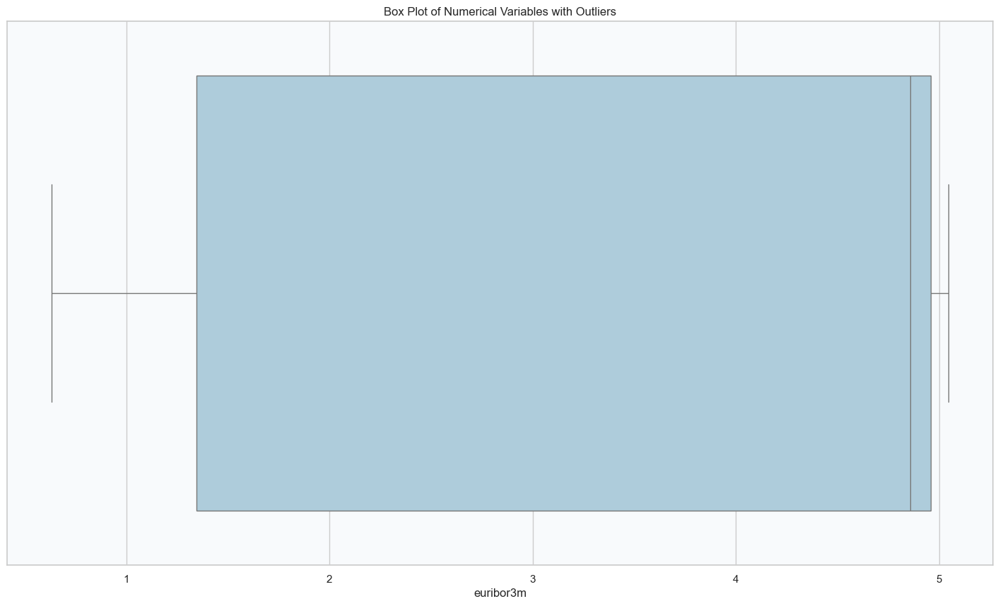

In [117]:
plot_numerical_vars_with_outliers(df2, 'euribor3m')


In [118]:
plot_numerical_vars_with_outliers_plotly(df2, 'euribor3m', '#E6ECF5')


In [119]:
num_outliers, outliers_df = detect_count_outliers(df2, 'number_of_employees', threshold=3)
num_outliers
outliers_df


Number of outliers in 'number_of_employees': 0


,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y,has_term_deposit,age_band,new_passed_days


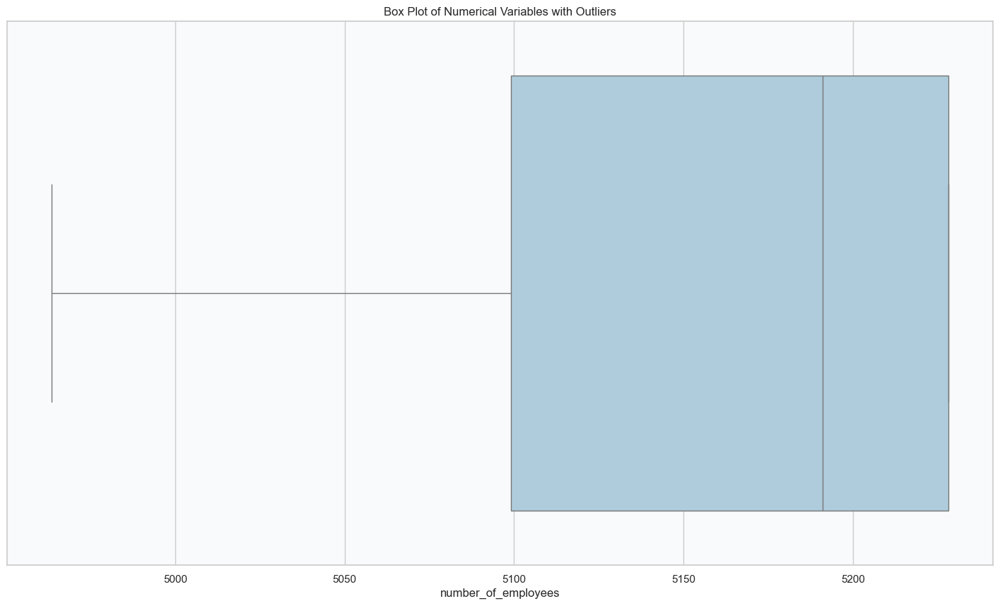

In [120]:
plot_numerical_vars_with_outliers(df2, 'number_of_employees')


In [121]:
plot_numerical_vars_with_outliers_plotly(df2, 'number_of_employees', '#E6ECF5')


In [122]:
num_outliers, outliers_df = detect_count_outliers(df2, 'has_term_deposit', threshold=3)
num_outliers
outliers_df


Number of outliers in 'has_term_deposit': 0


,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y,has_term_deposit,age_band,new_passed_days


In [123]:
# Export the dataset
# df.to_csv('datasets_case_2/1_dataset_without_outliers.csv', index=False)


In [124]:
# See the correlations between categorical variables
def plot_categorical_count(df, x_column, hue_column, title, palette='Paired'):

    plt.figure(figsize=(20, 10))
    sns.countplot(x=x_column, hue=hue_column, data=df, palette=palette)

    plt.title(title, fontsize=14, fontweight='bold')
    plt.xlabel(x_column)
    plt.ylabel('Count')
    plt.legend(title=hue_column, loc='upper right')

    plt.show()


In [125]:
# See the correlations between categorical variables (Using Plotly)
def plotly_categorical_count(df, x_column, hue_column, title, color_discrete_sequence=None):
    # Create a dataframe with counts and percentages
    count_df = df.groupby([x_column, hue_column]).size().reset_index(name='count')
    total_counts = count_df.groupby(x_column)['count'].transform('sum')
    count_df['percentage'] = (count_df['count'] / total_counts) * 100

    # Create the bar plot
    fig = px.bar(count_df, x=x_column, y='count', color=hue_column,
                 title=title, color_discrete_sequence=color_discrete_sequence)

    # Add borders and percentage labels
    for bar in fig.data:
        bar.update(marker_line_color='black', marker_line_width=1, hoverinfo='y+text',
                   text=count_df[count_df[hue_column] == bar.name]['percentage'].round(2).astype(str) + '%')

    fig.update_layout(
        xaxis_title=x_column,
        yaxis_title='Count',
        legend_title=hue_column,
        barmode='group',
        bargap=0.1,
        showlegend=True,
        legend=dict(x=1.02, y=1)
    )

    fig.show()


In [126]:
df2.groupby(['job','y'])['y'].count()


job            y  
admin.         no     9068
               yes    1351
blue-collar    no     8615
               yes     638
entrepreneur   no     1332
               yes     124
housemaid      no      954
               yes     106
management     no     2596
               yes     328
retired        no     1284
               yes     434
self-employed  no     1272
               yes     149
services       no     3644
               yes     323
student        no      600
               yes     275
technician     no     6009
               yes     730
unemployed     no      870
               yes     144
other          no      293
               yes      37
Name: y, dtype: int64

In [127]:
pd.crosstab(df2.y, df2.job, margins=True).style.background_gradient(cmap='summer_r')


job,admin.,blue-collar,entrepreneur,housemaid,management,retired,self-employed,services,student,technician,unemployed,other,All
y,,,,,,,,,,,,,
no,9068,8615,1332,954,2596,1284,1272,3644,600,6009,870,293,36537
yes,1351,638,124,106,328,434,149,323,275,730,144,37,4639
All,10419,9253,1456,1060,2924,1718,1421,3967,875,6739,1014,330,41176


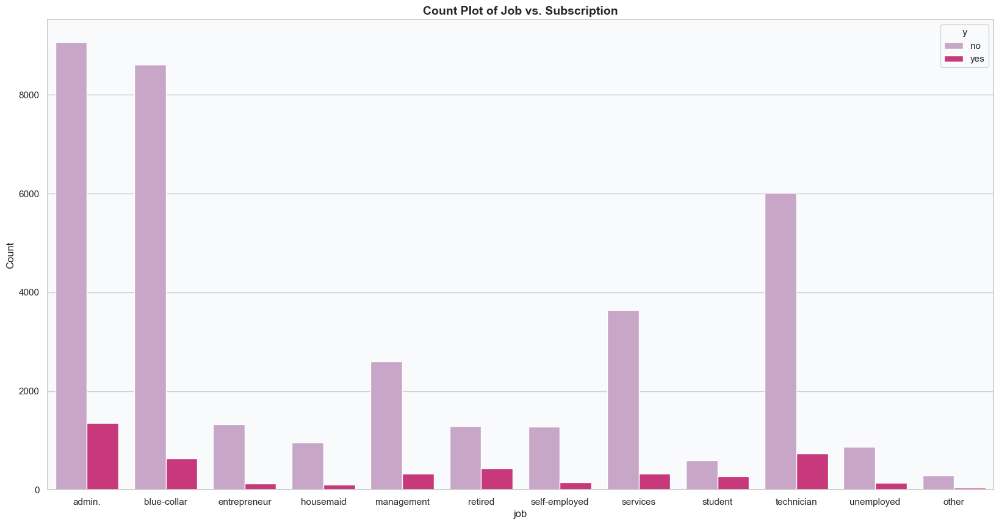

In [128]:
plot_categorical_count(df2[['job', 'y']], x_column='job', hue_column='y', title='Count Plot of Job vs. Subscription', palette='PuRd')


In [129]:
# Plotly
plotly_categorical_count(df2[['job', 'y']], x_column='job', hue_column='y', title='Count Plot of Job vs. Subscription')


In [130]:
df2.groupby(['marital','y'])['y'].count()


marital   y  
divorced  no      4135
          yes      476
married   no     22390
          yes     2531
single    no      9944
          yes     1620
other     no        68
          yes       12
Name: y, dtype: int64

In [131]:
pd.crosstab(df2.y, df2.marital, margins=True).style.background_gradient(cmap='summer_r')


marital,divorced,married,single,other,All
y,,,,,
no,4135,22390,9944,68,36537
yes,476,2531,1620,12,4639
All,4611,24921,11564,80,41176


In [132]:
pd.crosstab([df2.job, df2.y], df.marital, margins=True).style.background_gradient(cmap='summer_r')


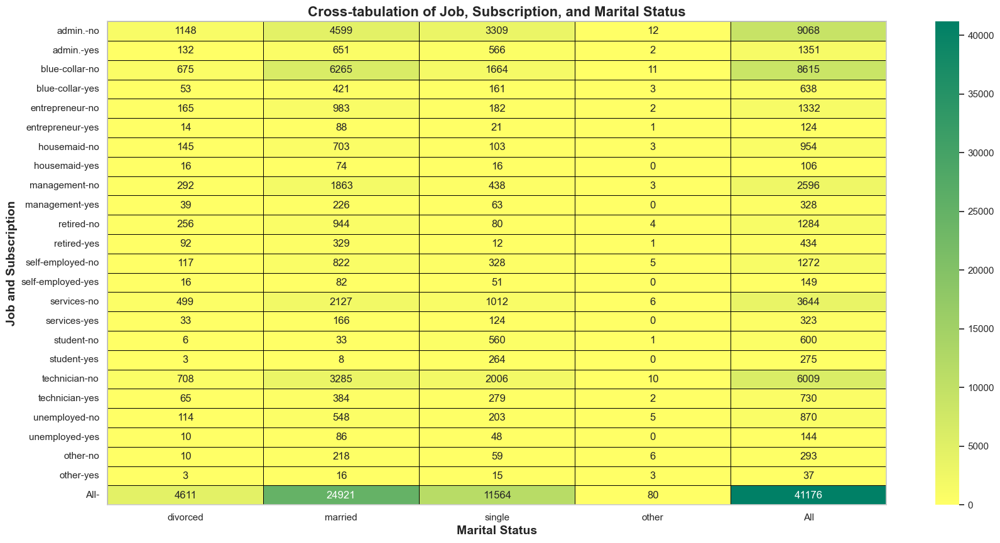

In [133]:
# Plot the correlation between job, subscription and marital status

cross_tab_df = pd.crosstab([df2['job'], df2['y']], df2['marital'], margins=True)

plt.figure(figsize=(20, 10))
heatmap = sns.heatmap(cross_tab_df, annot=True, cmap='summer_r', fmt='d', cbar=True, linewidths=.5, linecolor='black')

# Bold text for feature names
for _, spine in heatmap.spines.items():
    spine.set_visible(True)

heatmap.set_title('Cross-tabulation of Job, Subscription, and Marital Status', fontweight='bold', fontsize=16)
plt.xlabel('Marital Status', fontweight='bold', fontsize=14)
plt.ylabel('Job and Subscription', fontweight='bold', fontsize=14)
plt.show()


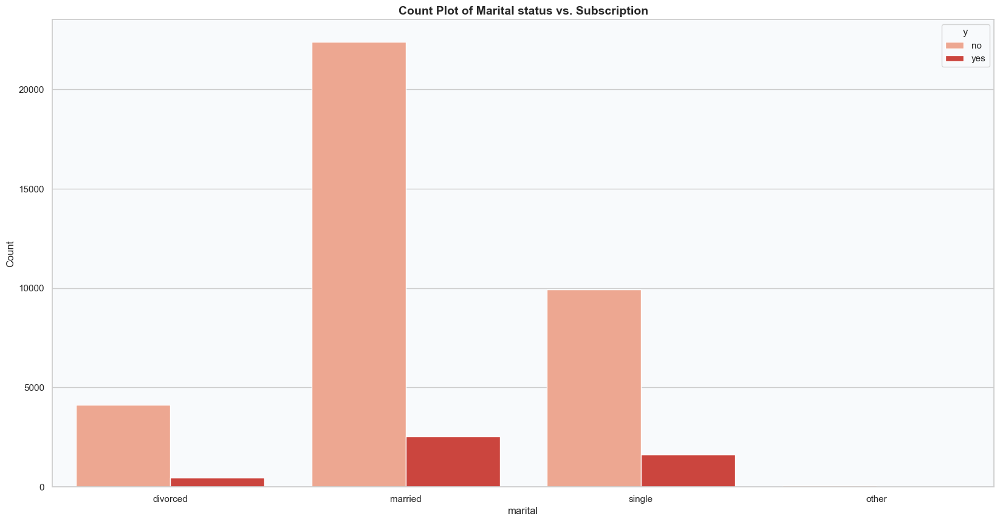

In [134]:
plot_categorical_count(df2[['marital', 'y']], x_column='marital', hue_column='y', title='Count Plot of Marital status vs. Subscription', palette='Reds')


In [135]:
# Plotly
plotly_categorical_count(df2[['marital', 'y']], x_column='marital', hue_column='y', title='Count Plot of Marital status vs. Subscription')


In [136]:
df2.groupby(['education','y'])['y'].count()


education            y  
kindergarten_school  no      3748
                     yes      428
primary_school       no      2103
                     yes      188
secondary_school     no      5572
                     yes      473
high.school          no      8481
                     yes     1031
illiterate           no        14
                     yes        4
professional.course  no      4645
                     yes      595
university.degree    no     10495
                     yes     1669
other                no      1479
                     yes      251
Name: y, dtype: int64

In [137]:
pd.crosstab(df2.y, df2.education, margins=True).style.background_gradient(cmap='summer_r')


education,kindergarten_school,primary_school,secondary_school,high.school,illiterate,professional.course,university.degree,other,All
y,,,,,,,,,
no,3748,2103,5572,8481,14,4645,10495,1479,36537
yes,428,188,473,1031,4,595,1669,251,4639
All,4176,2291,6045,9512,18,5240,12164,1730,41176


In [138]:
pd.crosstab([df2.job, df2.y], df2.education, margins=True).style.background_gradient(cmap='summer_r')


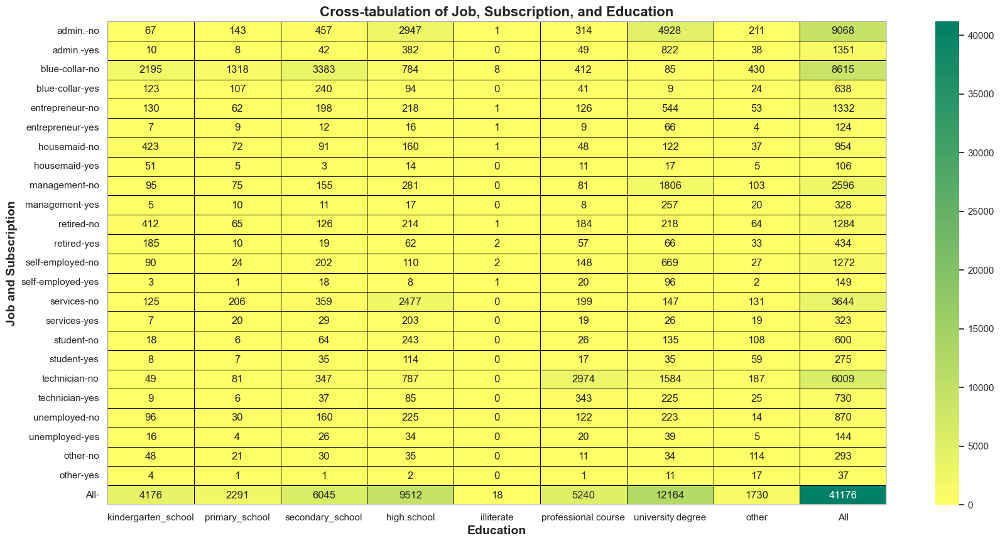

In [139]:
# Plot the correlation between job, subscription and education

cross_tab_df = pd.crosstab([df2['job'], df2['y']], df2['education'], margins=True)

plt.figure(figsize=(20, 10))
heatmap = sns.heatmap(cross_tab_df, annot=True, cmap='summer_r', fmt='d', cbar=True, linewidths=.5, linecolor='black')

# Bold text for feature names
for _, spine in heatmap.spines.items():
    spine.set_visible(True)

heatmap.set_title('Cross-tabulation of Job, Subscription, and Education', fontweight='bold', fontsize=16)
plt.xlabel('Education', fontweight='bold', fontsize=14)
plt.ylabel('Job and Subscription', fontweight='bold', fontsize=14)
plt.show()


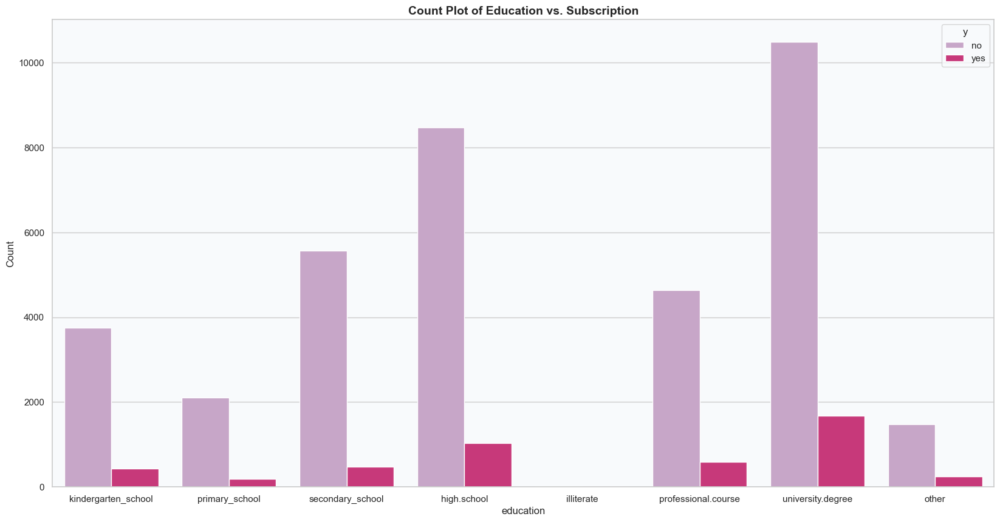

In [140]:
plot_categorical_count(df2[['education', 'y']], x_column='education', hue_column='y', title='Count Plot of Education vs. Subscription', palette='PuRd')


In [141]:
# Plotly
plotly_categorical_count(df2[['education', 'y']], x_column='education', hue_column='y', title='Count Plot of Education vs. Subscription')


In [142]:
df2.groupby(['default','y'])['y'].count()


default         y  
no              no     28381
                yes     4196
not_applicable  no      8153
                yes      443
yes             no         3
                yes        0
Name: y, dtype: int64

In [143]:
pd.crosstab(df2.y, df2.default, margins=True).style.background_gradient(cmap='summer_r')


default,no,not_applicable,yes,All
y,,,,
no,28381,8153,3,36537
yes,4196,443,0,4639
All,32577,8596,3,41176


In [144]:
pd.crosstab([df2.age, df2.y], df2.default, margins=True).style.background_gradient(cmap='summer_r')


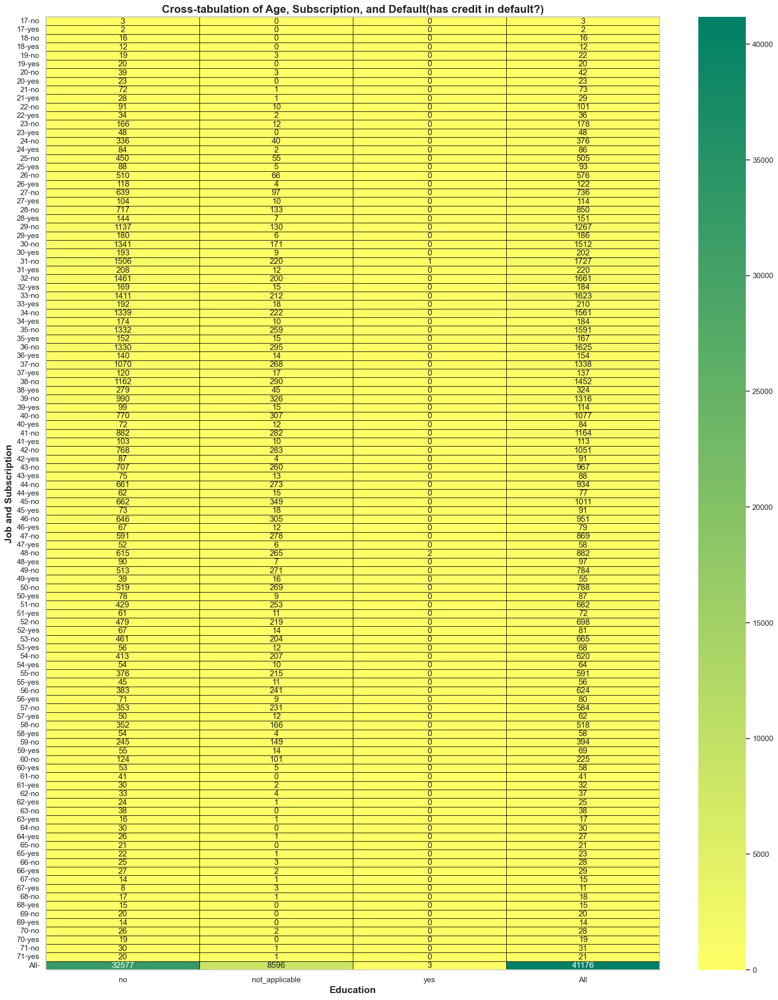

In [145]:
# Plot the correlation between age, subscription and default

cross_tab_df = pd.crosstab([df2['age'], df2['y']], df2['default'], margins=True)

plt.figure(figsize=(20, 25))
heatmap = sns.heatmap(cross_tab_df, annot=True, cmap='summer_r', fmt='d', cbar=True, linewidths=.5, linecolor='black')

# Bold text for feature names
for _, spine in heatmap.spines.items():
    spine.set_visible(True)

heatmap.set_title('Cross-tabulation of Age, Subscription, and Default(has credit in default?)', fontweight='bold', fontsize=16)
plt.xlabel('Education', fontweight='bold', fontsize=14)
plt.ylabel('Job and Subscription', fontweight='bold', fontsize=14)
plt.show()


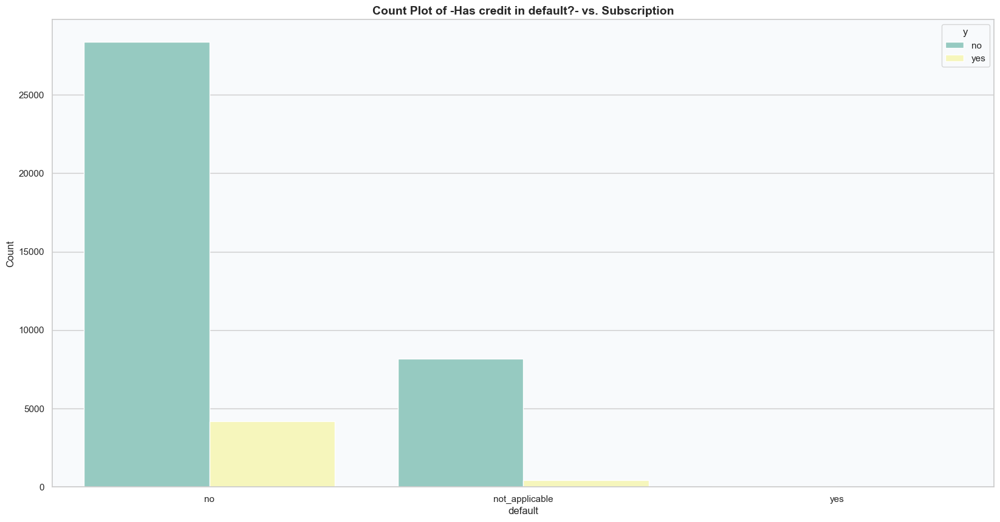

In [146]:
plot_categorical_count(df2[['default', 'y']], x_column='default', hue_column='y', title='Count Plot of -Has credit in default?- vs. Subscription', palette='Set3')


In [147]:
# Plotly
plotly_categorical_count(df2[['default', 'y']], x_column='default', hue_column='y', title='Count Plot of - Has credit in default? - vs. Subscription')


In [148]:
df2.groupby(['housing','y'])['y'].count()


housing         y  
no              no     16590
                yes     2025
not_applicable  no       883
                yes      107
yes             no     19064
                yes     2507
Name: y, dtype: int64

In [149]:
pd.crosstab(df2.y, df2.housing, margins=True).style.background_gradient(cmap='summer_r')


housing,no,not_applicable,yes,All
y,,,,
no,16590,883,19064,36537
yes,2025,107,2507,4639
All,18615,990,21571,41176


In [150]:
pd.crosstab([df2.marital, df2.y], df2.housing, margins=True).style.background_gradient(cmap='summer_r')


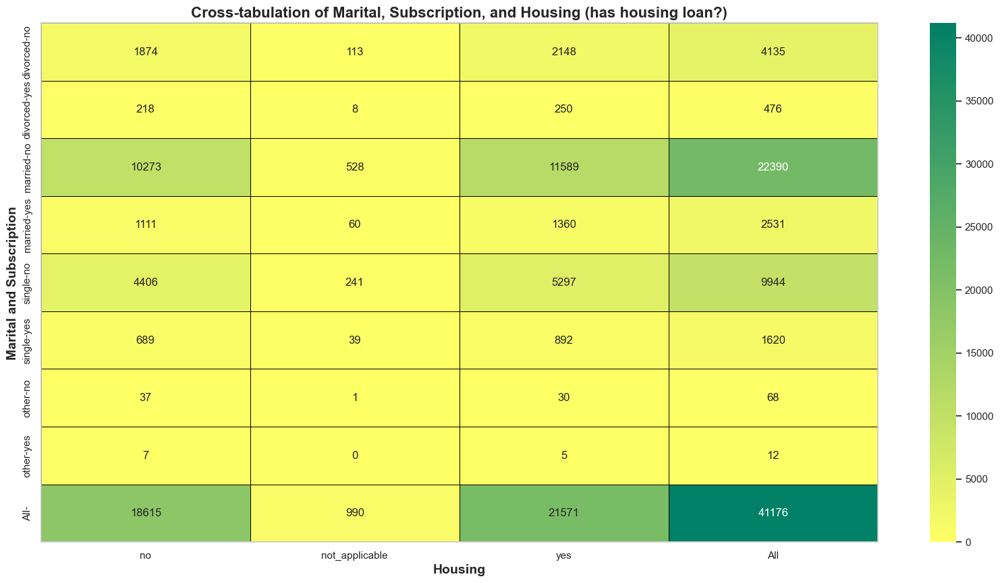

In [151]:
# Plot the correlation between marital, subscription and housing

cross_tab_df = pd.crosstab([df2['marital'], df2['y']], df2['housing'], margins=True)

plt.figure(figsize=(20, 10))
heatmap = sns.heatmap(cross_tab_df, annot=True, cmap='summer_r', fmt='d', cbar=True, linewidths=.5, linecolor='black')

# Bold text for feature names
for _, spine in heatmap.spines.items():
    spine.set_visible(True)

heatmap.set_title('Cross-tabulation of Marital, Subscription, and Housing (has housing loan?)', fontweight='bold', fontsize=16)
plt.xlabel('Housing', fontweight='bold', fontsize=14)
plt.ylabel('Marital and Subscription', fontweight='bold', fontsize=14)
plt.show()


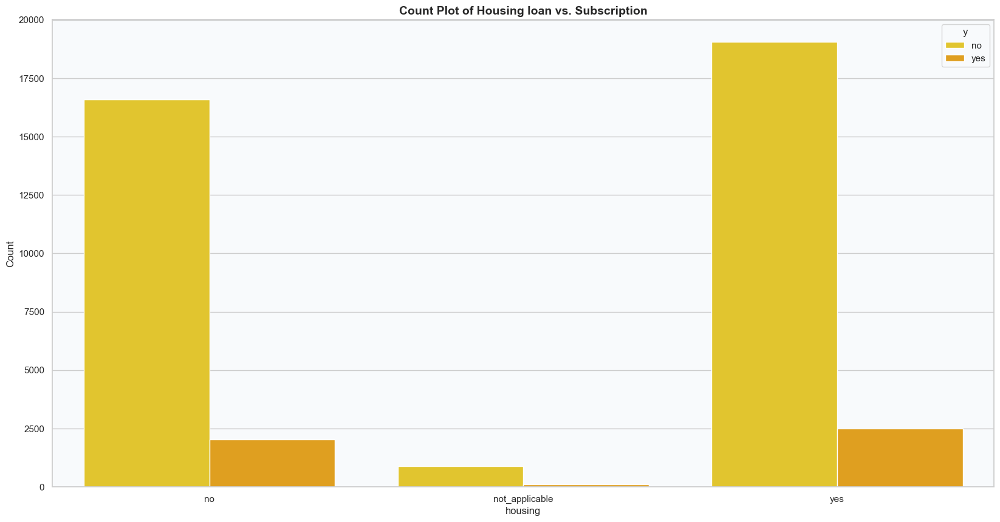

In [152]:
plot_categorical_count(df2[['housing', 'y']], x_column='housing', hue_column='y', title='Count Plot of Housing loan vs. Subscription', palette='Wistia')


In [153]:
# Plotly
plotly_categorical_count(df2[['housing', 'y']], x_column='housing', hue_column='y', title='Count Plot of Housing loan vs. Subscription')


In [154]:
df2.groupby(['loan','y'])['y'].count()


loan            y  
no              no     30089
                yes     3849
not_applicable  no       883
                yes      107
yes             no      5565
                yes      683
Name: y, dtype: int64

In [155]:
pd.crosstab(df2.y, df2.loan, margins=True).style.background_gradient(cmap='summer_r')


loan,no,not_applicable,yes,All
y,,,,
no,30089,883,5565,36537
yes,3849,107,683,4639
All,33938,990,6248,41176


In [156]:
pd.crosstab([df2.loan, df2.y], df2.marital, margins=True).style.background_gradient(cmap='summer_r')


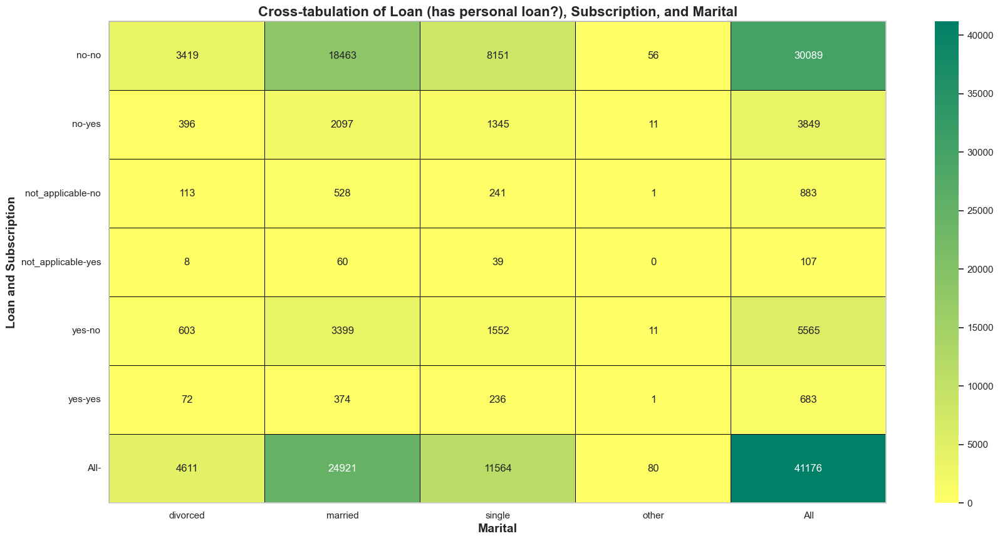

In [157]:
# Plot the correlation between loan, subscription and marital status

cross_tab_df = pd.crosstab([df2['loan'], df2['y']], df2['marital'], margins=True)

plt.figure(figsize=(20, 10))
heatmap = sns.heatmap(cross_tab_df, annot=True, cmap='summer_r', fmt='d', cbar=True, linewidths=.5, linecolor='black')

# Bold text for feature names
for _, spine in heatmap.spines.items():
    spine.set_visible(True)

heatmap.set_title('Cross-tabulation of Loan (has personal loan?), Subscription, and Marital', fontweight='bold', fontsize=16)
plt.xlabel('Marital', fontweight='bold', fontsize=14)
plt.ylabel('Loan and Subscription', fontweight='bold', fontsize=14)
plt.show()


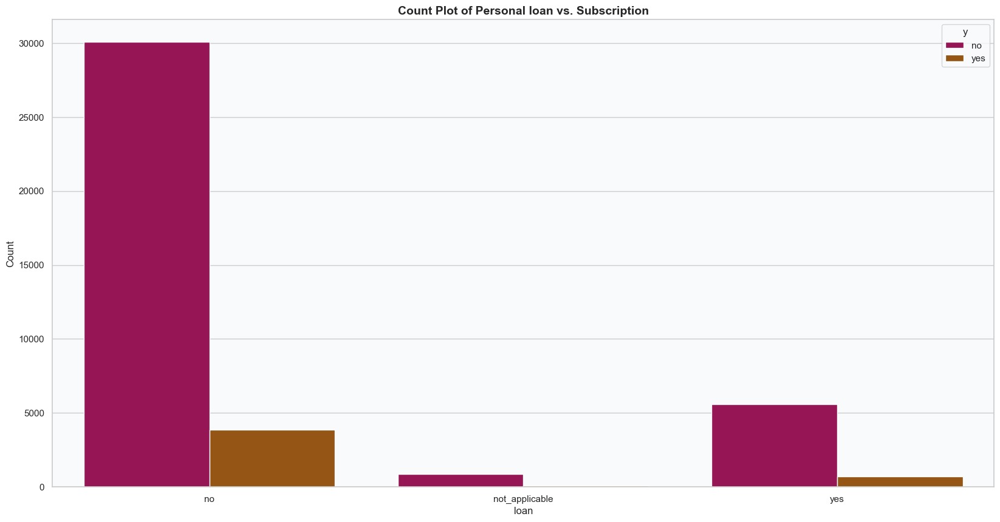

In [158]:
plot_categorical_count(df2[['loan', 'y']], x_column='loan', hue_column='y', title='Count Plot of Personal loan vs. Subscription', palette='brg')


In [159]:
# Plotly
plotly_categorical_count(df2[['loan', 'y']], x_column='loan', hue_column='y', title='Count Plot of Personal loan vs. Subscription')


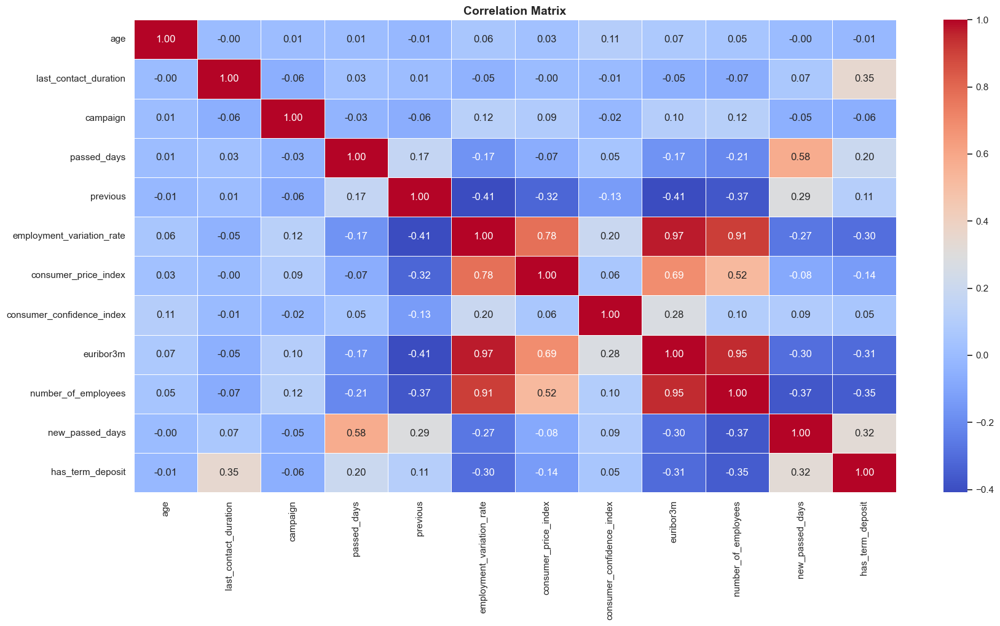

In [160]:
# Select the specified features
numeric_features = df2[['age', 'last_contact_duration', 'campaign', 'passed_days', 'previous',
            'employment_variation_rate', 'consumer_price_index', 'consumer_confidence_index',
            'euribor3m', 'number_of_employees', 'new_passed_days', 'has_term_deposit']]

# Calculate the correlation matrix
correlation_matrix = numeric_features.corr()

# Set up the matplotlib figure
plt.figure(figsize=(20, 10))

# Plot the correlation matrix using a heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

# Display the plot
plt.title('Correlation Matrix', fontweight='bold', fontsize=14)
plt.show()


In [161]:
numeric_features = df2[['age', 'last_contact_duration', 'campaign', 'passed_days', 'previous',
            'employment_variation_rate', 'consumer_price_index', 'consumer_confidence_index',
            'euribor3m', 'number_of_employees', 'new_passed_days', 'has_term_deposit']]

# Calculate the correlation matrix
correlation_matrix = numeric_features.corr()

# Create a Plotly figure for the correlation matrix
fig = px.imshow(correlation_matrix,
                labels=dict(x="Features", y="Features", color="Correlation"),
                x=numeric_features.columns,
                y=numeric_features.columns,
                color_continuous_scale='blues',  # Choose an appropriate color scale
                title='Correlation Matrix')

# Customize the layout
fig.update_layout(width=1000, height=800)

# Show the figure
fig.show()


In [162]:
# Plot a correlation matrix heatmap between one numeric feature and target
def plot_correlation_heatmap(df, features, target, cmap='coolwarm', figsize=(10, 8)):
    df_selected = df[features + [target]]

    # Calculate correlation matrix
    correlation_matrix = df_selected.corr()

    # Set up the matplotlib figure
    plt.figure(figsize=figsize)

    # Create a heatmap using seaborn
    sns.heatmap(correlation_matrix, annot=True, cmap=cmap, fmt='.2f', linewidths=0.5)

    # Set the title
    plt.title(f'Correlation Matrix Heatmap - {target} vs {", ".join(features)}')

    # Show the plot
    plt.show()


In [163]:
# Plot a correlation matrix heatmap between one numeric feature and target

def plot_correlation_heatmap_plotly(df, features, target, colorscale='Viridis'):
    # Select relevant columns
    df_selected = df[features + [target]]

    # Calculate correlation matrix
    correlation_matrix = df_selected.corr()

    # Create a heatmap using Plotly
    heatmap = go.Figure(data=go.Heatmap(
        z=correlation_matrix.values,
        x=correlation_matrix.columns,
        y=correlation_matrix.index,
        colorscale=colorscale,
        colorbar=dict(title='Correlation'),
    ))

    # Customize the layout
    heatmap.update_layout(
        title=f'Correlation Matrix Heatmap - {target} vs {", ".join(features)}',
        xaxis=dict(title='Variable'),
        yaxis=dict(title='Variable'),
    )

    # Show the plot
    heatmap.show()


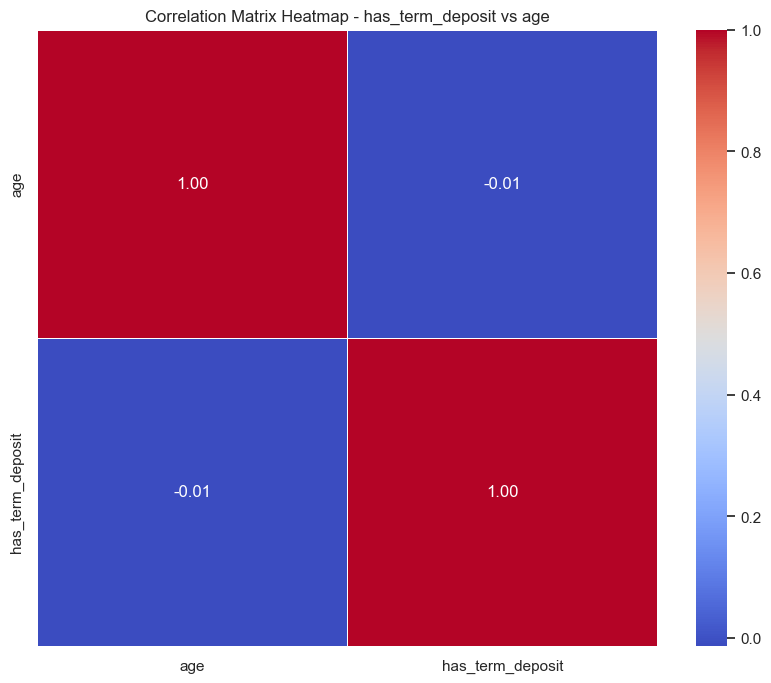

In [164]:
plot_correlation_heatmap(df2, features=['age'], target='has_term_deposit')


In [165]:
plot_correlation_heatmap_plotly(df2, features=['age'], target='has_term_deposit')


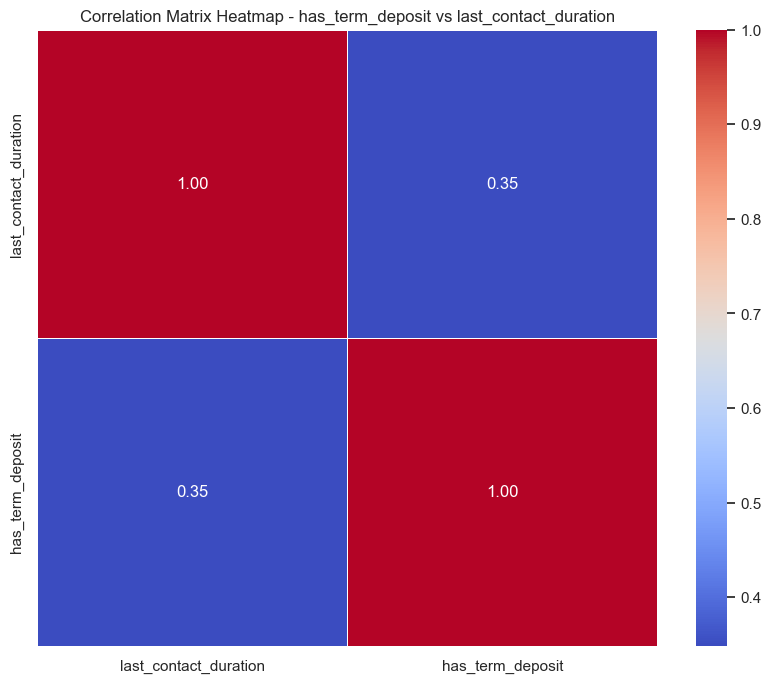

In [166]:
plot_correlation_heatmap(df2, features=['last_contact_duration'], target='has_term_deposit')


In [167]:
plot_correlation_heatmap_plotly(df2, features=['last_contact_duration'], target='has_term_deposit')


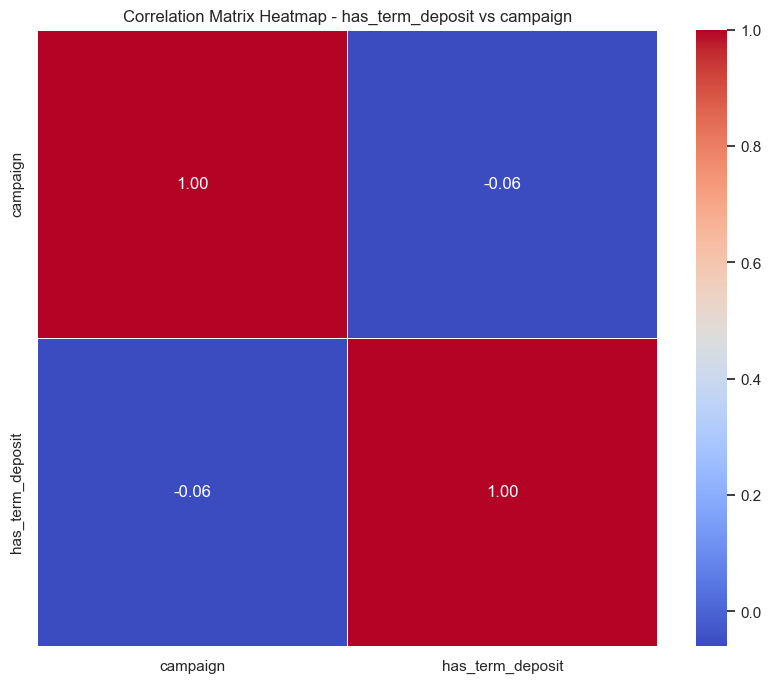

In [168]:
plot_correlation_heatmap(df2, features=['campaign'], target='has_term_deposit')


In [169]:
plot_correlation_heatmap_plotly(df2, features=['campaign'], target='has_term_deposit')

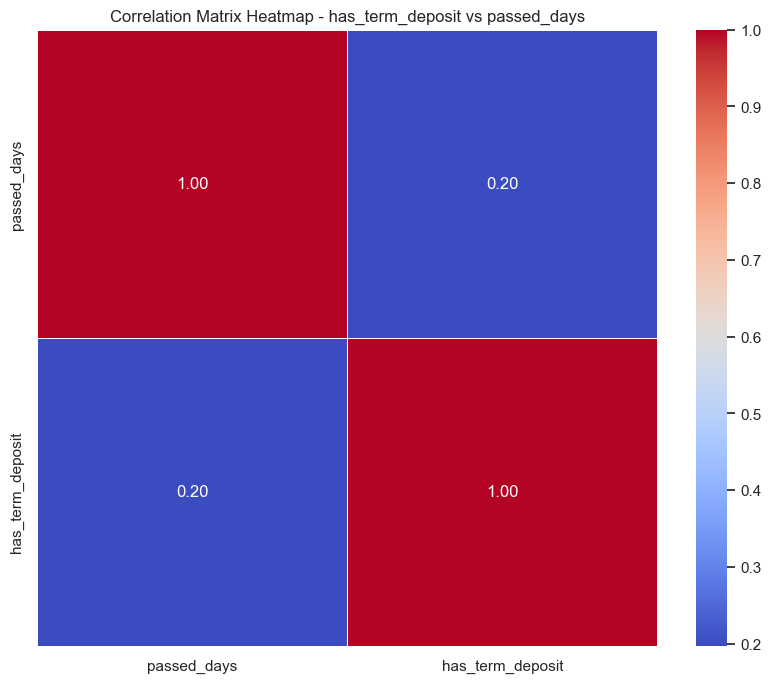

In [170]:
plot_correlation_heatmap(df2, features=['passed_days'], target='has_term_deposit')


In [171]:
plot_correlation_heatmap_plotly(df2, features=['passed_days'], target='has_term_deposit')

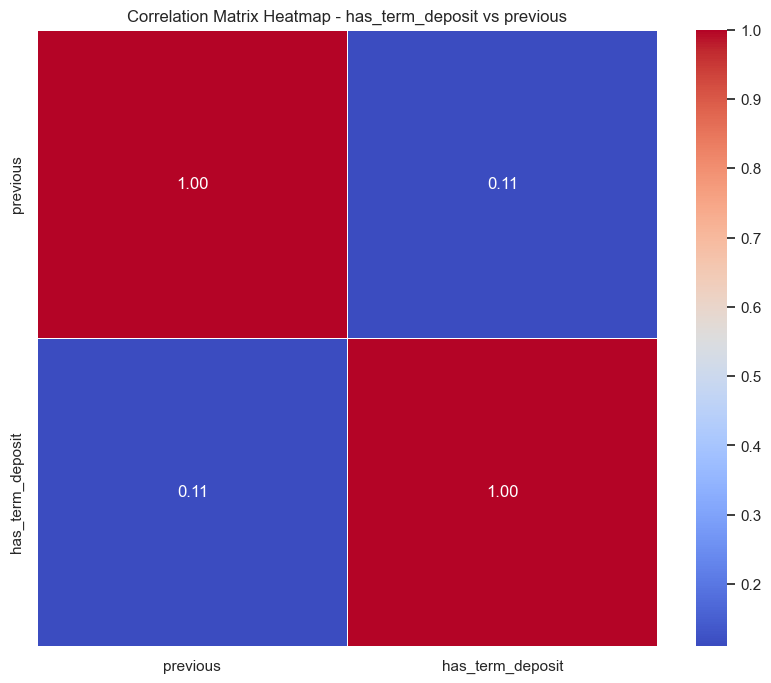

In [172]:
plot_correlation_heatmap(df2, features=['previous'], target='has_term_deposit')


In [173]:
plot_correlation_heatmap_plotly(df2, features=['previous'], target='has_term_deposit')


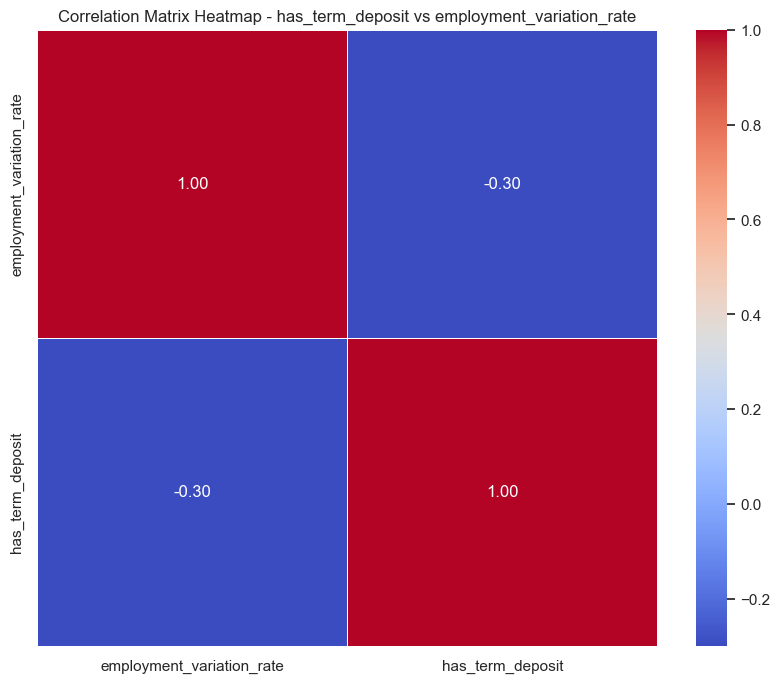

In [174]:
plot_correlation_heatmap(df2, features=['employment_variation_rate'], target='has_term_deposit')


In [175]:
plot_correlation_heatmap_plotly(df2, features=['employment_variation_rate'], target='has_term_deposit')

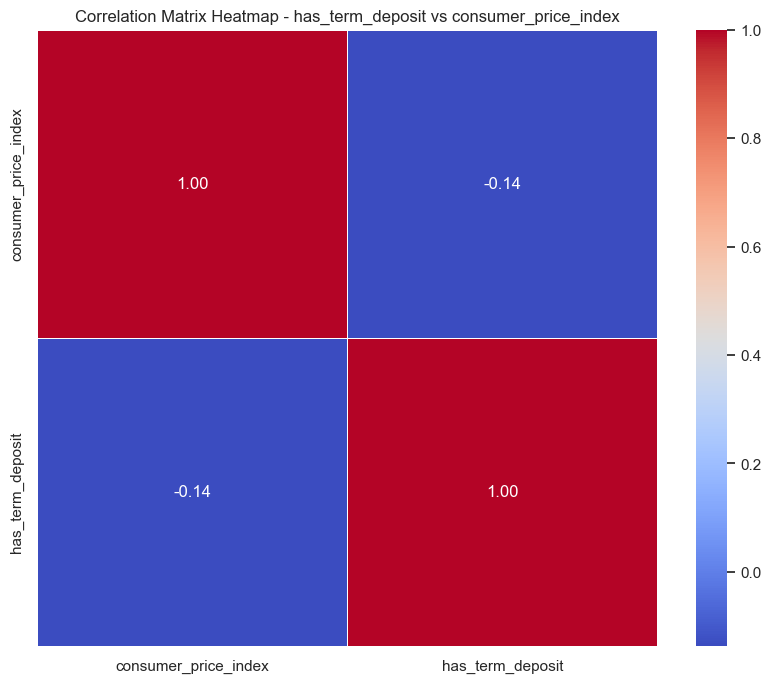

In [176]:
plot_correlation_heatmap(df2, features=['consumer_price_index'], target='has_term_deposit')


In [177]:
plot_correlation_heatmap_plotly(df2, features=['consumer_price_index'], target='has_term_deposit')


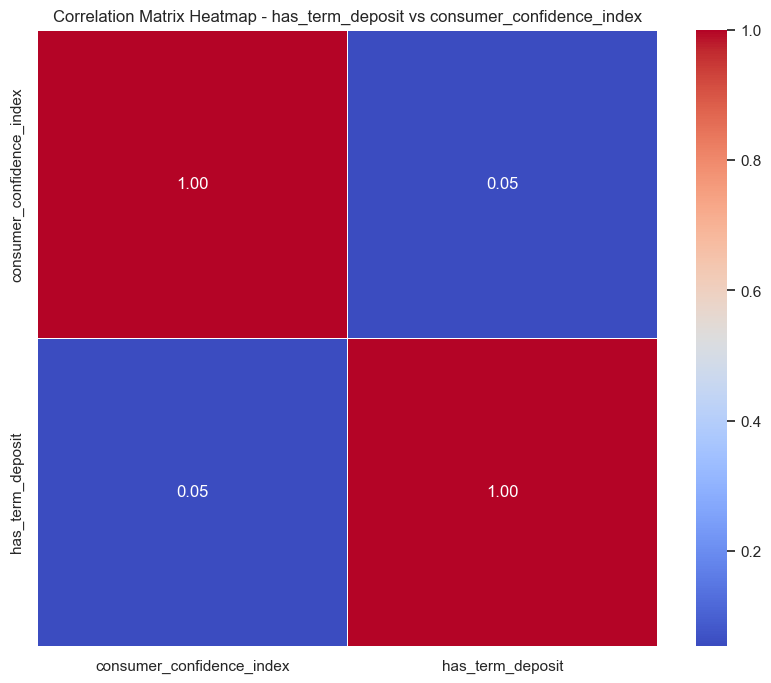

In [178]:
plot_correlation_heatmap(df2, features=['consumer_confidence_index'], target='has_term_deposit')

In [179]:
plot_correlation_heatmap_plotly(df2, features=['consumer_confidence_index'], target='has_term_deposit')


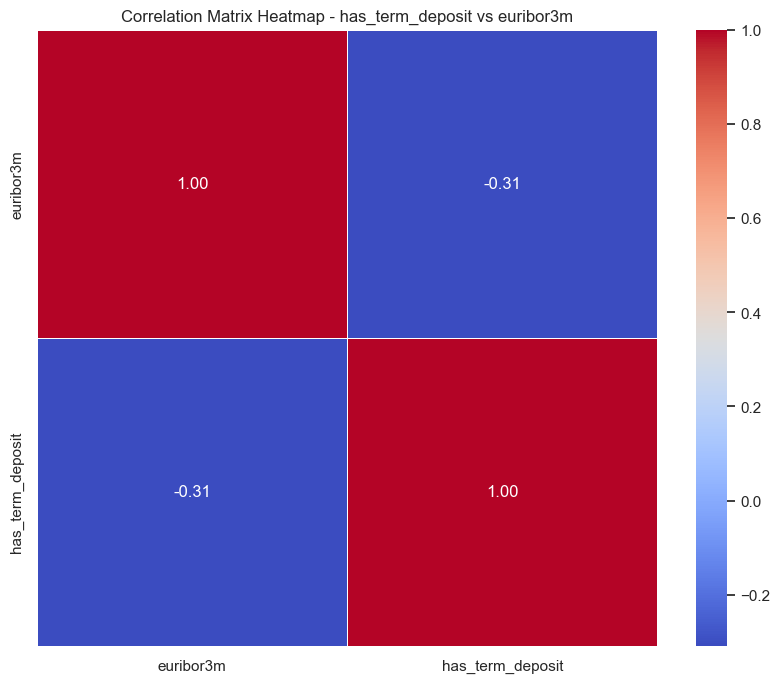

In [180]:
plot_correlation_heatmap(df2, features=['euribor3m'], target='has_term_deposit')


In [181]:
plot_correlation_heatmap_plotly(df2, features=['euribor3m'], target='has_term_deposit')


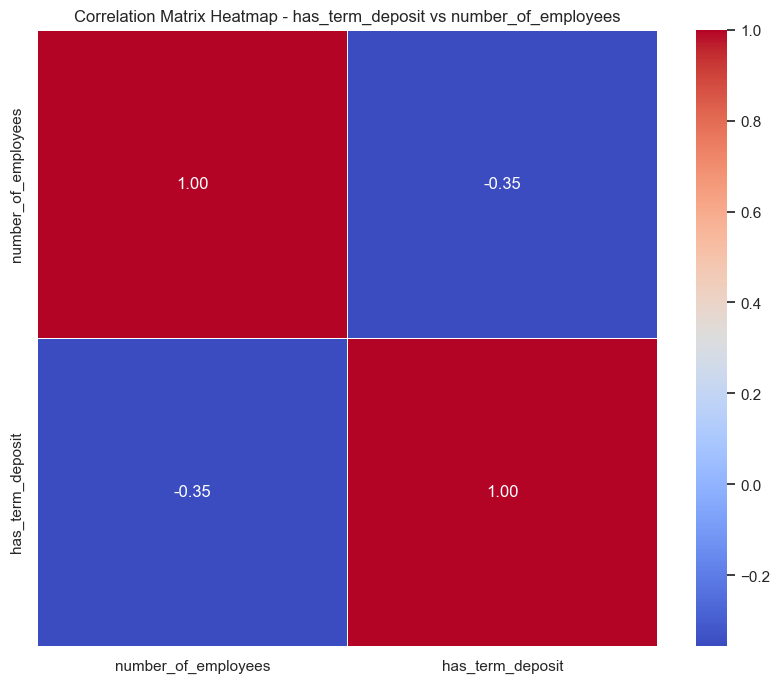

In [182]:
plot_correlation_heatmap(df2, features=['number_of_employees'], target='has_term_deposit')

In [183]:
plot_correlation_heatmap_plotly(df2, features=['number_of_employees'], target='has_term_deposit')


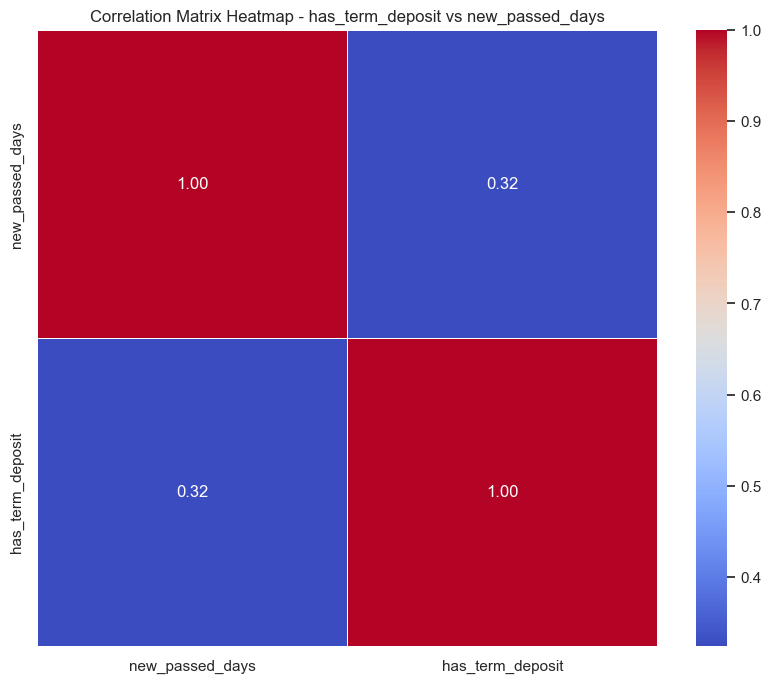

In [184]:
plot_correlation_heatmap(df2, features=['new_passed_days'], target='has_term_deposit')


In [185]:
plot_correlation_heatmap_plotly(df2, features=['new_passed_days'], target='has_term_deposit')


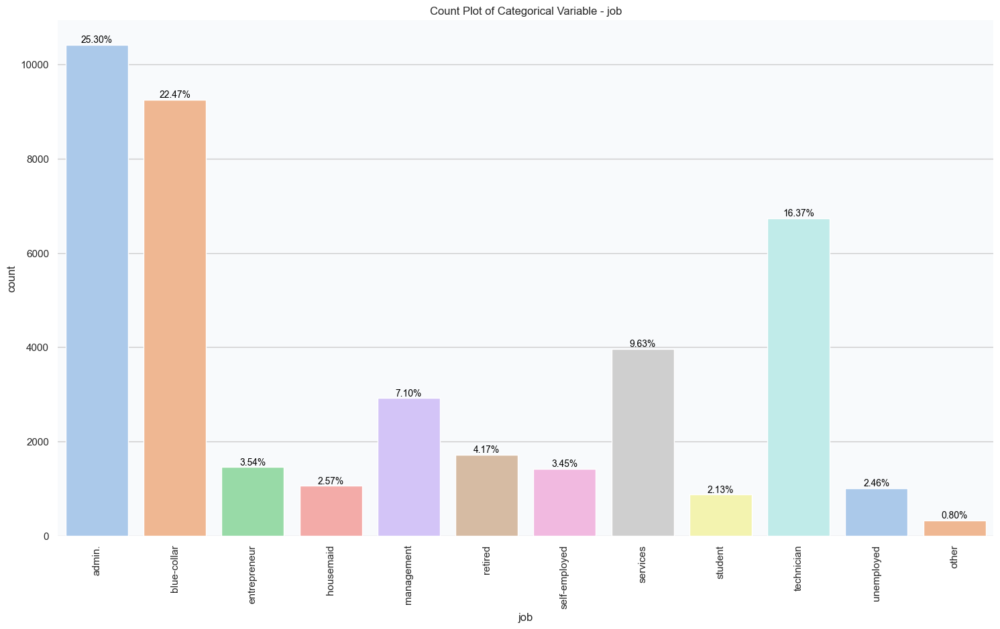

In [186]:
plot_categorical_vars_distribution(df2, 'job')


In [187]:
plot_categorical_vars_distribution_plotly(df2, 'job', '#E6ECF5')


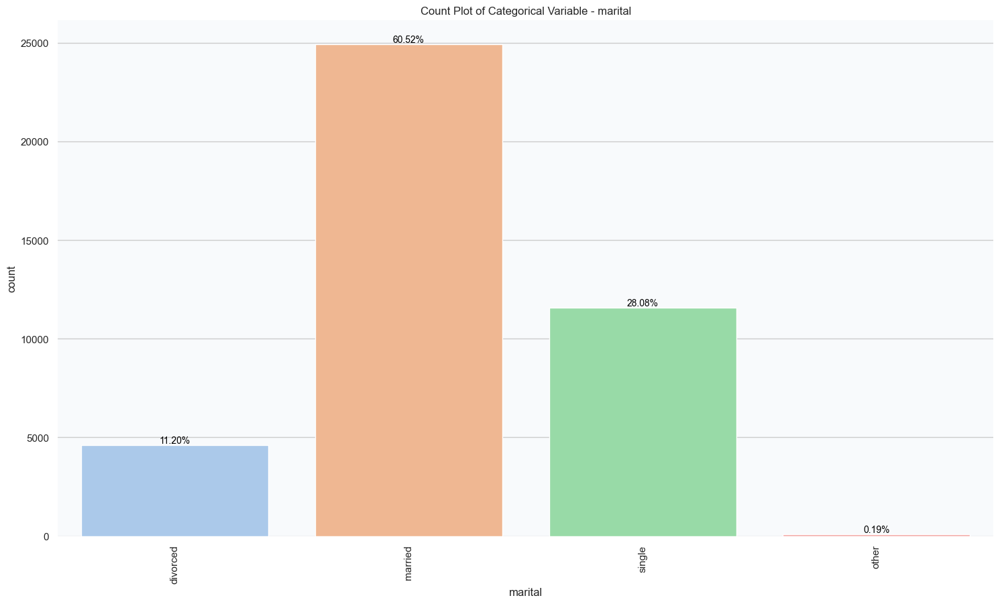

In [188]:
plot_categorical_vars_distribution(df2, 'marital')


In [189]:
plot_categorical_vars_distribution_plotly(df2, 'marital', '#E6ECF5')


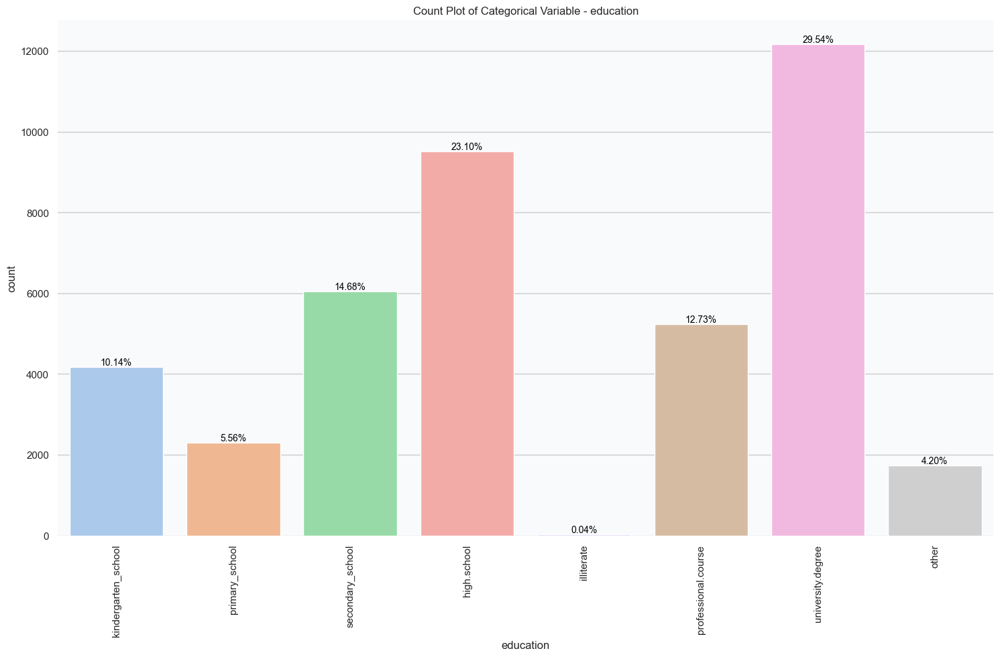

In [190]:
plot_categorical_vars_distribution(df2, 'education')


In [191]:
plot_categorical_vars_distribution_plotly(df2, 'education', '#E6ECF5')


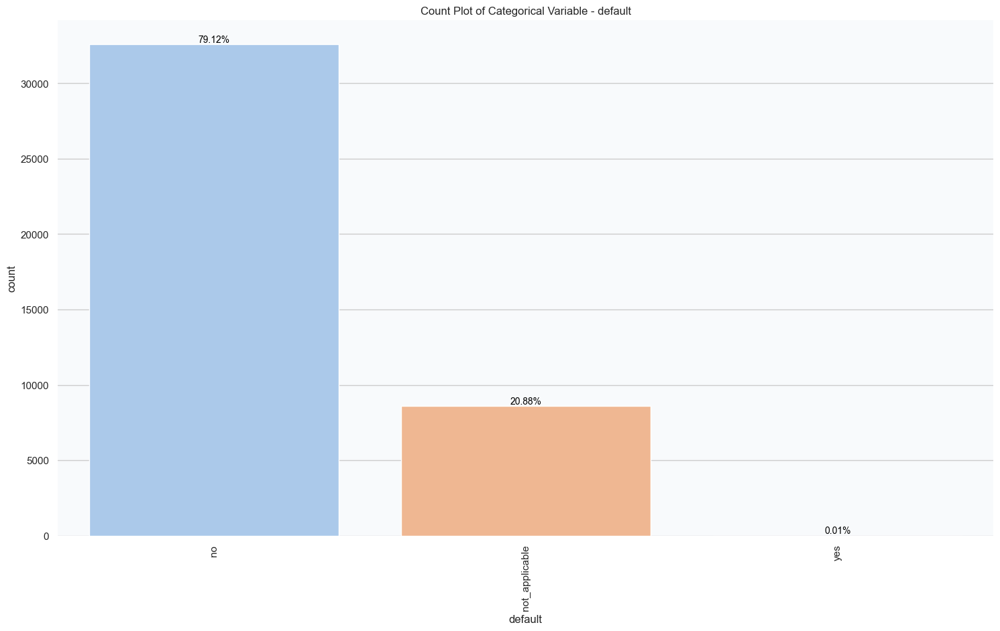

In [192]:
plot_categorical_vars_distribution(df2, 'default')


In [193]:
plot_categorical_vars_distribution_plotly(df2, 'default', '#E6ECF5')


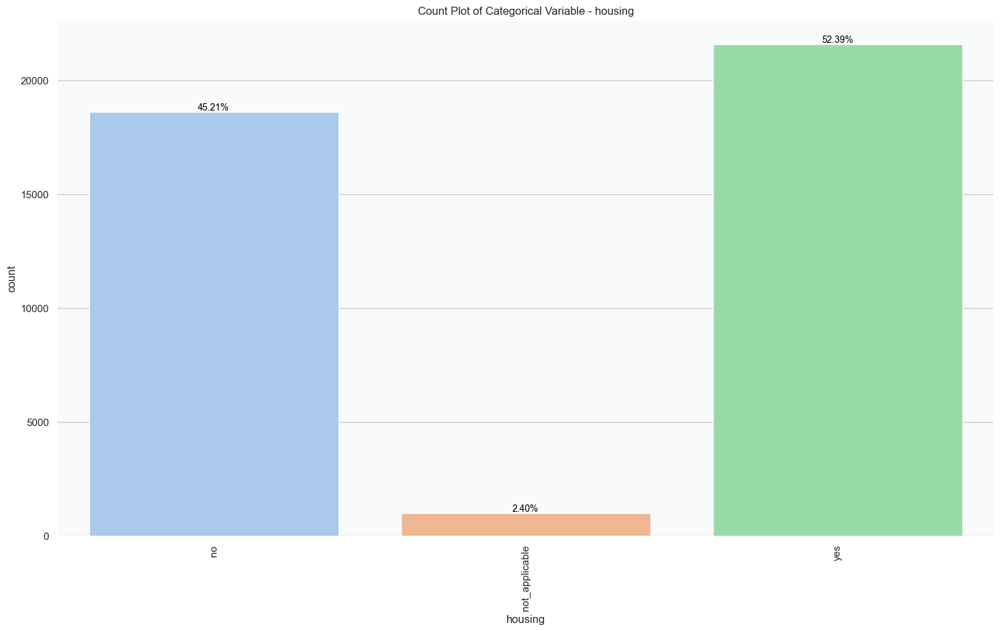

In [194]:
plot_categorical_vars_distribution(df2, 'housing')


In [195]:
plot_categorical_vars_distribution_plotly(df2, 'housing', '#E6ECF5')


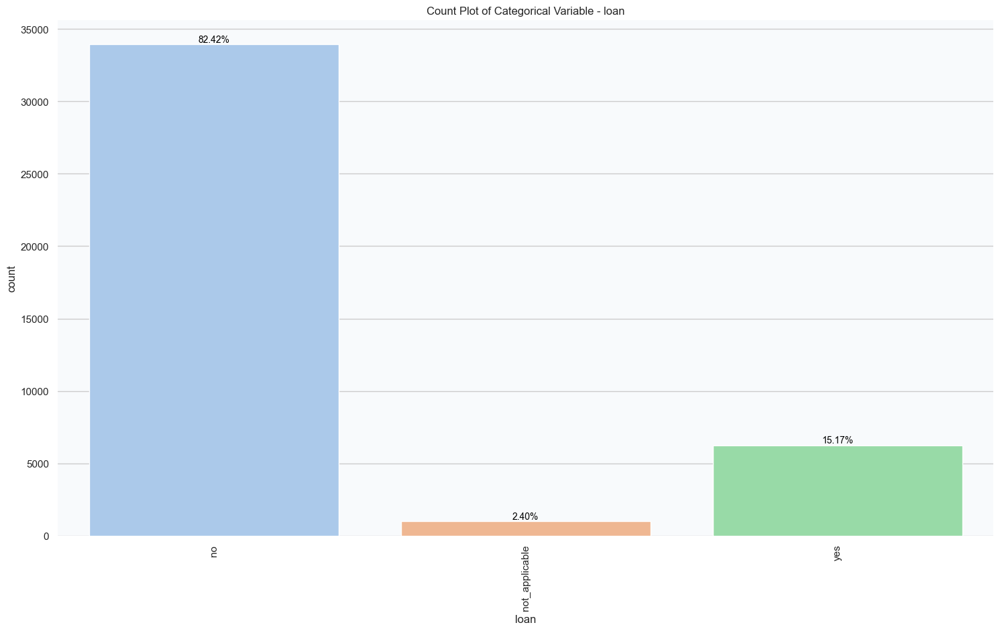

In [196]:
plot_categorical_vars_distribution(df2, 'loan')


In [197]:
plot_categorical_vars_distribution_plotly(df2, 'loan', '#E6ECF5')


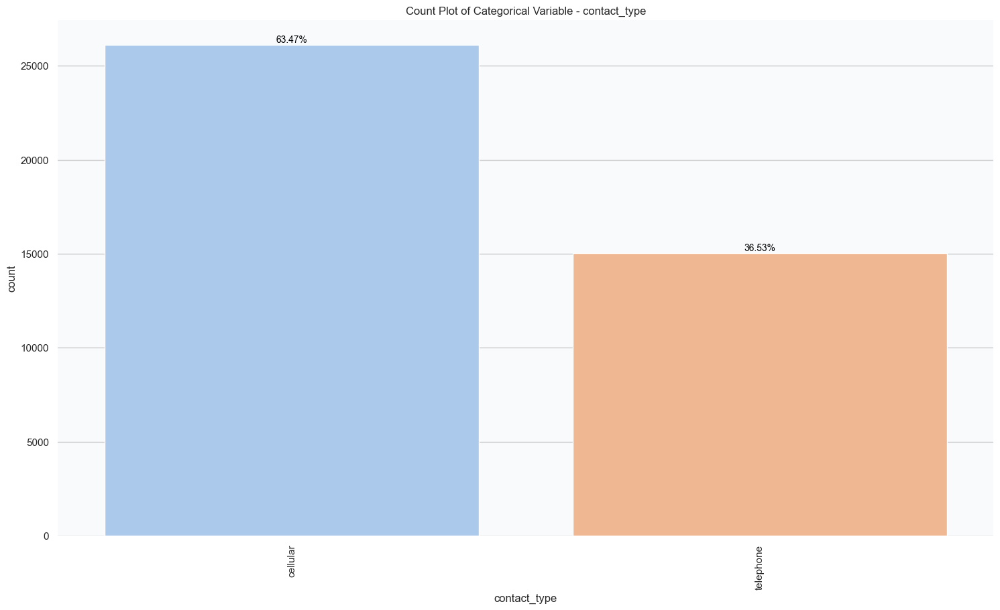

In [198]:
plot_categorical_vars_distribution(df2, 'contact_type')


In [199]:
plot_categorical_vars_distribution_plotly(df2, 'contact_type', '#E6ECF5')


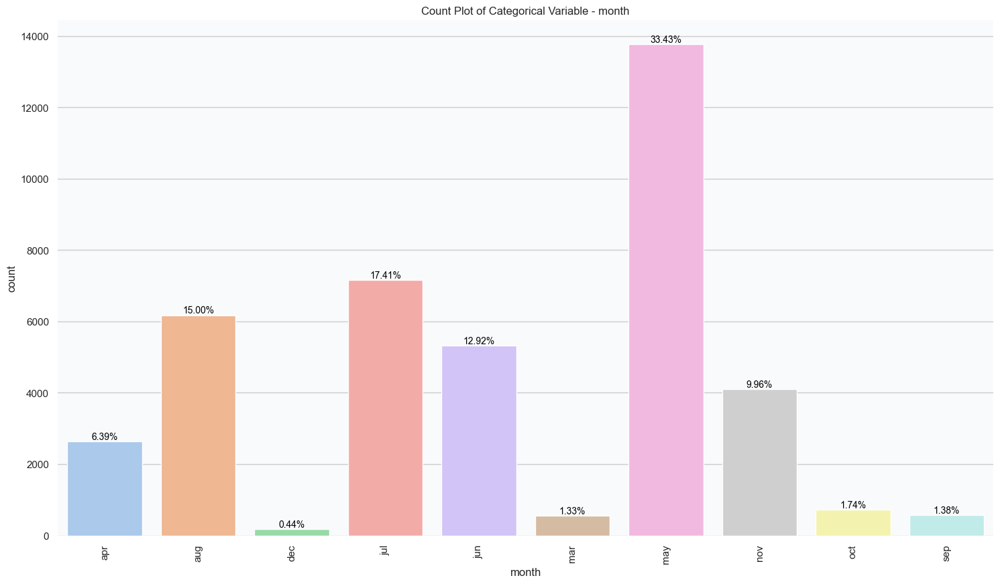

In [200]:
plot_categorical_vars_distribution(df2, 'month')


In [201]:
plot_categorical_vars_distribution_plotly(df2, 'month', '#E6ECF5')


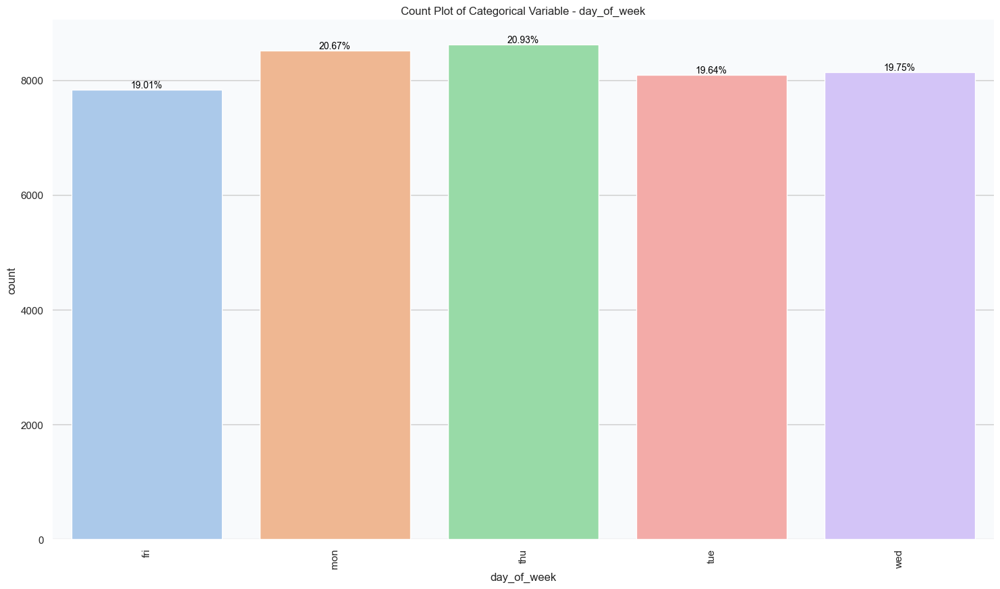

In [202]:
plot_categorical_vars_distribution(df2, 'day_of_week')


In [203]:
plot_categorical_vars_distribution_plotly(df2, 'day_of_week', '#E6ECF5')


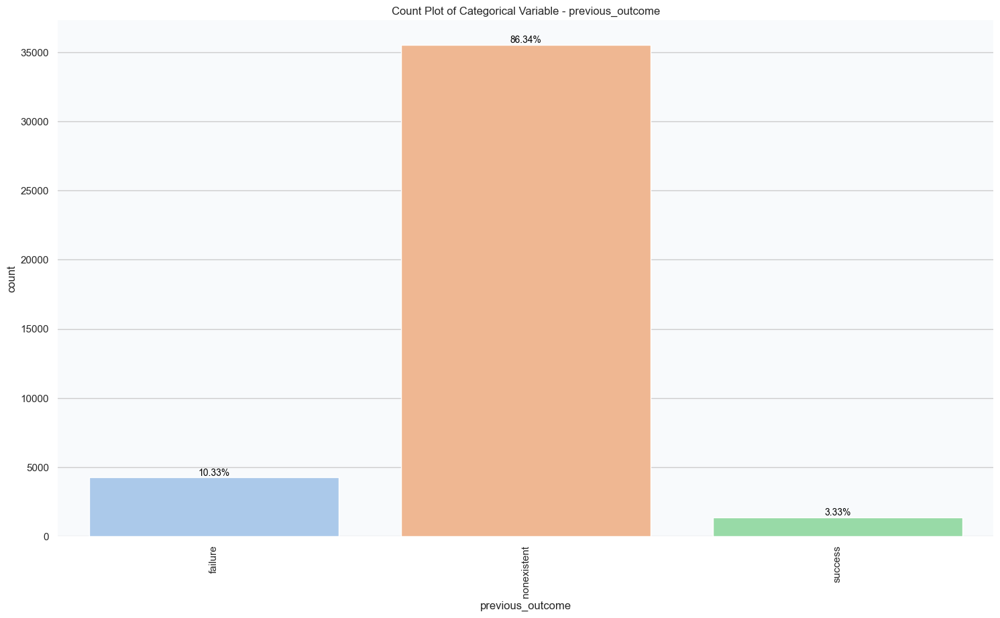

In [204]:
plot_categorical_vars_distribution(df2, 'previous_outcome')


In [205]:
plot_categorical_vars_distribution_plotly(df2, 'previous_outcome', '#E6ECF5')


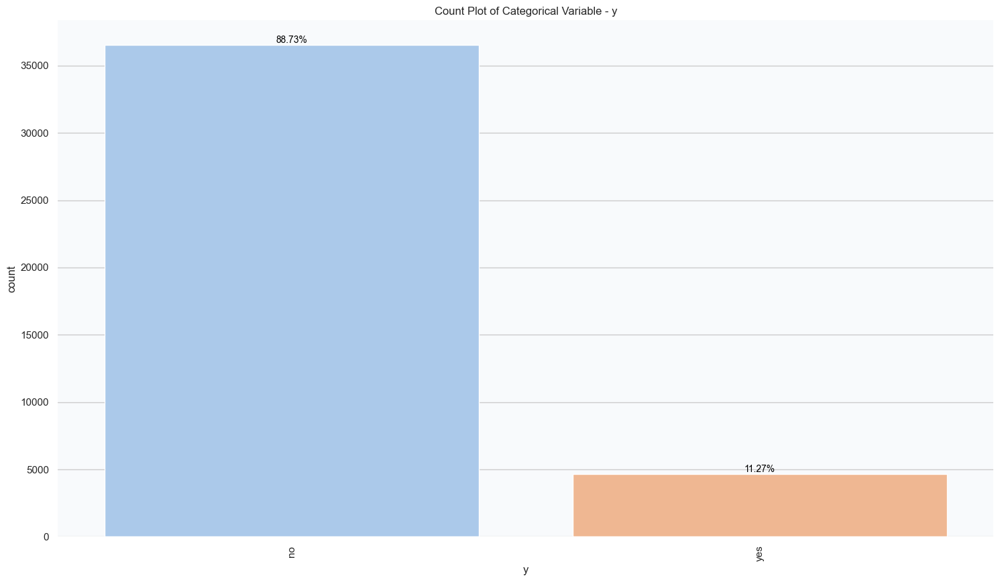

In [206]:
plot_categorical_vars_distribution(df2, 'y')


In [207]:
# Distribution of the Target
plot_categorical_vars_distribution_plotly(df2, 'y', '#E6ECF5')


[Text(0.5, 0, 'age'),
 Text(1.5, 0, 'last_contact_duration'),
 Text(2.5, 0, 'campaign'),
 Text(3.5, 0, 'passed_days'),
 Text(4.5, 0, 'previous'),
 Text(5.5, 0, 'employment_variation_rate'),
 Text(6.5, 0, 'consumer_price_index'),
 Text(7.5, 0, 'consumer_confidence_index'),
 Text(8.5, 0, 'euribor3m'),
 Text(9.5, 0, 'number_of_employees'),
 Text(10.5, 0, 'new_passed_days'),
 Text(11.5, 0, 'has_term_deposit')]

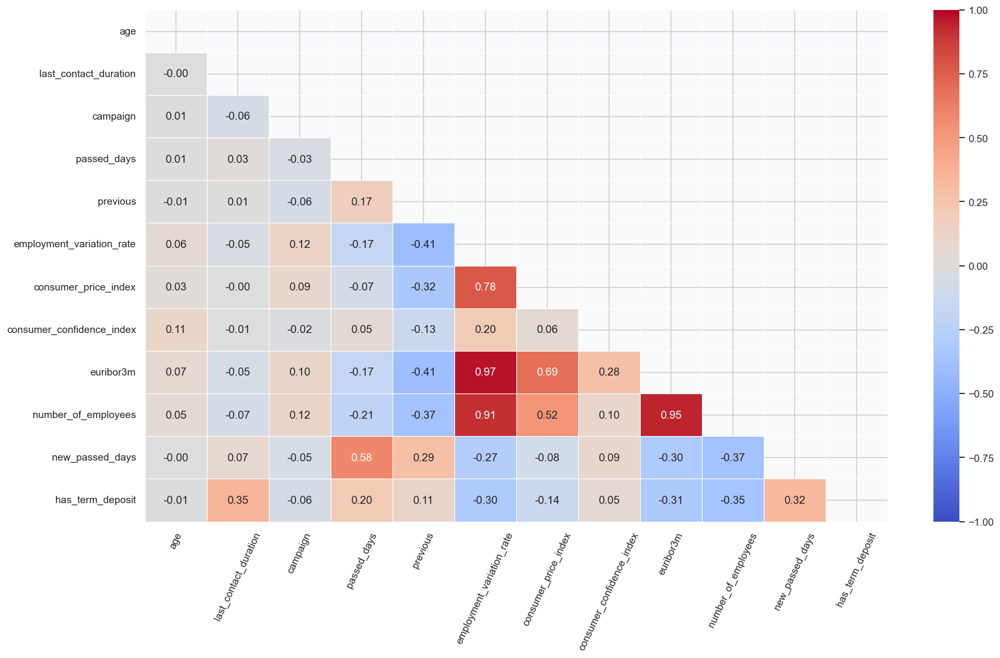

In [208]:
# Correlation matrix

fig, ax = plt.subplots(figsize=(18, 10))

df_corr = numeric_features.corr(method='pearson')
mask = np.zeros_like(df_corr)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(data=df_corr, vmin=-1, vmax=1, mask=mask, 
            cmap=sns.color_palette('coolwarm', as_cmap=True),
            annot=True, fmt='.2f', linewidths=.5, ax=ax)

ax.set_xticklabels(ax.get_xticklabels(), rotation=65)


In [209]:
df2.describe().T


,count,mean,std,min,25%,50%,75%,max
age,41176.0,39.659413,9.739905,17.000,32.000,38.000,47.000,71.000
last_contact_duration,41176.0,233.001020,189.904579,0.000,102.000,180.000,301.000,1036.000
campaign,41176.0,2.268239,1.700447,1.000,1.000,2.000,3.000,10.000
passed_days,41176.0,-0.951282,0.429464,-1.000,-1.000,-1.000,-1.000,3.000
previous,41176.0,0.110768,0.313849,0.000,0.000,0.000,0.000,1.000
employment_variation_rate,41176.0,0.081922,1.570883,-3.400,-1.800,1.100,1.400,1.400
consumer_price_index,41176.0,93.575720,0.578839,92.201,93.075,93.749,93.994,94.767
consumer_confidence_index,41176.0,-40.502863,4.627860,-50.800,-42.700,-41.800,-36.400,-26.900
euribor3m,41176.0,3.621293,1.734437,0.634,1.344,4.857,4.961,5.045
number_of_employees,41176.0,5167.034870,72.251364,4963.600,5099.100,5191.000,5228.100,5228.100


In [210]:
print('=' * 60)
print('=' * 20, 'Summary statistics', '=' * 20)
print('=' * 60)

# Summary statistics
summary_stats = numeric_features.describe()

# Mean
mean_values = numeric_features.mean()

# Median
median_values = numeric_features.median()

# Standard Deviation
std_dev_values = numeric_features.std()

# Correlation matrix
correlation_matrix = numeric_features.corr()

# Display the results using tabulate
print("\nSummary Statistics:")
print(tabulate(summary_stats, headers='keys', tablefmt='pretty'))

print("\nMean Values:")
print(tabulate(mean_values.to_frame(), headers='keys', tablefmt='pretty'))

print("\nMedian Values:")
print(tabulate(median_values.to_frame(), headers='keys', tablefmt='pretty'))

print("\nStandard Deviation:")
print(tabulate(std_dev_values.to_frame(), headers='keys', tablefmt='pretty'))

print("\nCorrelation Matrix:")
print(tabulate(correlation_matrix, headers='keys', tablefmt='pretty'))


==================== Summary statistics ====================

Summary Statistics:
+-------+-------------------+-----------------------+--------------------+---------------------+---------------------+---------------------------+----------------------+---------------------------+-------------------+---------------------+---------------------+---------------------+
|       |        age        | last_contact_duration |      campaign      |     passed_days     |      previous       | employment_variation_rate | consumer_price_index | consumer_confidence_index |     euribor3m     | number_of_employees |   new_passed_days   |  has_term_deposit   |
+-------+-------------------+-----------------------+--------------------+---------------------+---------------------+---------------------------+----------------------+---------------------------+-------------------+---------------------+---------------------+---------------------+
| count |      41176.0      |        41176.0        |      41176.0

In [211]:
df2.isnull().sum()


age                          0
job                          0
marital                      0
education                    0
default                      0
housing                      0
loan                         0
contact_type                 0
month                        0
day_of_week                  0
last_contact_duration        0
campaign                     0
passed_days                  0
previous                     0
previous_outcome             0
employment_variation_rate    0
consumer_price_index         0
consumer_confidence_index    0
euribor3m                    0
number_of_employees          0
y                            0
has_term_deposit             0
age_band                     0
new_passed_days              0
dtype: int64

In [212]:
df2.shape

(41176, 24)

In [213]:
df2.dtypes

age                             int64
job                          category
marital                      category
education                    category
default                      category
housing                      category
loan                         category
contact_type                 category
month                        category
day_of_week                  category
last_contact_duration           int64
campaign                        int64
passed_days                     int64
previous                        int64
previous_outcome             category
employment_variation_rate     float64
consumer_price_index          float64
consumer_confidence_index     float64
euribor3m                     float64
number_of_employees           float64
y                            category
has_term_deposit                int64
age_band                     category
new_passed_days                 int64
dtype: object

-----

#### Convert Categorical features to Numeric features

In [214]:
LE=LabelEncoder()

cat_var=['age_band', 'job', 'marital', 'education', 'default', 'housing', 'loan', 'contact_type', 'month', 'day_of_week', 'previous_outcome', 'y']

for i in cat_var:
    df2[i]=LE.fit_transform(df2[i])


In [215]:
df2.head()

,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y,has_term_deposit,age_band,new_passed_days
0,56,3,1,2,0,0,0,1,6,1,...,1,1.1,93.994,-36.4,4.857,5191.0,0,0,4,0
1,57,8,1,0,1,0,0,1,6,1,...,1,1.1,93.994,-36.4,4.857,5191.0,0,0,4,0
2,37,8,1,0,0,2,0,1,6,1,...,1,1.1,93.994,-36.4,4.857,5191.0,0,0,2,0
3,40,0,1,4,0,0,0,1,6,1,...,1,1.1,93.994,-36.4,4.857,5191.0,0,0,2,0
4,56,8,1,0,0,0,2,1,6,1,...,1,1.1,93.994,-36.4,4.857,5191.0,0,0,4,0


In [216]:
# Export dataset
df2.to_csv('datasets_case_4/1_dataset_after_encoding.csv', index=False)


In [217]:
# To see all the variables created globally across the notebook.
%whos

Variable                                    Type                    Data/Info
-----------------------------------------------------------------------------
Callable                                    _CallableType           typing.Callable
Color                                       type                    <class 'colour.Color'>
DTreeVizAPI                                 type                    <class 'dtreeviz.trees.DTreeVizAPI'>
DTreeVizRender                              type                    <class 'dtreeviz.utils.DTreeVizRender'>
DecisionTreeClassifier                      ABCMeta                 <class 'sklearn.tree._cla<...>.DecisionTreeClassifier'>
GridSearchCV                                ABCMeta                 <class 'sklearn.model_sel<...>on._search.GridSearchCV'>
KNeighborsClassifier                        ABCMeta                 <class 'sklearn.neighbors<...>on.KNeighborsClassifier'>
LE                                          LabelEncoder            LabelEncoder()
L

In [218]:
# Create a copy of the dataset
df3 = df2.copy()

In [219]:
# Split the Data into Training and Testing Sets
X = df3.drop(['has_term_deposit', 'y'], axis=1)
y = df3['has_term_deposit']


In [220]:
sc = StandardScaler()
sc.fit_transform(X)

array([[ 1.67771497, -0.26545394, -0.44430646, ...,  0.33169507,
         1.44946708, -0.19544496],
       [ 1.78038661,  0.98880117, -0.44430646, ...,  0.33169507,
         1.44946708, -0.19544496],
       [-0.27304634,  0.98880117, -0.44430646, ...,  0.33169507,
        -0.42086577, -0.19544496],
       ...,
       [ 1.67771497,  0.48709912, -0.44430646, ..., -2.81568858,
         1.44946708, -0.19544496],
       [ 0.44565519,  1.49050321, -0.44430646, ..., -2.81568858,
         0.51430065, -0.19544496],
       [-0.17037469,  0.48709912, -0.44430646, ..., -2.81568858,
         3.31979994, -0.19544496]])

In [221]:
# Handling the imbalanced data by Resampling
sm = SMOTE(random_state = 2)
X_resampled, y_resampled = sm.fit_resample(X, y)


In [222]:
# Dataset splitting
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.25, random_state=2)


In [223]:
X_train.head()

,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,passed_days,previous,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,age_band,new_passed_days
22042,31,10,3,0,0,2,2,0,1,4,...,-1,0,1,1.4,93.444000,-36.100000,4.964000,5228.1,2,0
17023,34,4,3,7,0,0,0,0,3,2,...,-1,0,1,1.4,93.918000,-42.700000,4.962000,5228.1,2,0
19291,48,1,1,5,0,2,0,0,1,4,...,-1,0,1,1.4,93.444000,-36.100000,4.967000,5228.1,3,0
54611,46,6,1,6,0,2,0,1,7,1,...,-1,0,1,-0.1,93.505821,-41.181749,4.604426,5195.8,2,0
53975,38,1,1,2,0,0,0,0,3,2,...,-1,0,1,1.4,94.037992,-42.502573,4.960561,5228.1,2,0


In [224]:
X_train.shape

(54805, 22)

In [225]:
X_test.head()

,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,passed_days,previous,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,age_band,new_passed_days
67146,39,7,1,5,0,1,1,0,3,0,...,-1,0,1,1.4,94.448105,-41.705678,4.959050,5228.1,2,0
64424,37,6,1,2,0,0,0,0,2,2,...,-1,0,1,-1.7,94.213786,-40.287081,0.846349,4991.6,5,0
57600,34,0,1,5,0,1,0,0,6,1,...,-1,0,1,-1.8,92.893000,-46.200000,1.276845,5099.1,2,0
13893,32,0,3,7,0,0,0,0,3,0,...,-1,0,1,1.4,93.918000,-42.700000,4.963000,5228.1,2,0
14419,32,0,3,7,0,1,1,0,3,3,...,-1,0,1,1.4,93.918000,-42.700000,4.961000,5228.1,2,0


In [226]:
X_test.shape

(18269, 22)

In [227]:
y_train.head()

22042    0
17023    0
19291    0
54611    1
53975    1
Name: has_term_deposit, dtype: int64

In [228]:
y_train.shape

(54805,)

In [229]:
y_test.head()

67146    1
64424    1
57600    1
13893    0
14419    0
Name: has_term_deposit, dtype: int64

In [230]:
y_test.shape

(18269,)

In [231]:
def calc_popularity(y_actual):
    return (sum(y_actual)/len(y_actual))

In [232]:
# Calculates specificity
def calc_specificity(y_actual, y_pred, thresh):
    return sum((y_pred < thresh) & (y_actual == 0)) /sum(y_actual ==0)

In [233]:
# Evaluation of model performance
def print_report(y_actual, y_pred, thresh):
    auc = roc_auc_score(y_actual, y_pred)
    accuracy = accuracy_score(y_actual, (y_pred > thresh))
    recall = recall_score(y_actual, (y_pred > thresh))
    precision = precision_score(y_actual, (y_pred > thresh))
    specificity = calc_specificity(y_actual, y_pred, thresh)
    f1 = 2 * (precision * recall) / (precision + recall)
    logloss = log_loss(y_actual, y_pred)
    

    tn, fp, fn, tp = confusion_matrix(y_actual, (y_pred > thresh)).ravel()

    print('AUC: %.3f' % auc)
    print('Accuracy: %.3f' % accuracy)
    print('Recall: %.3f' % recall)
    print('Precision: %.3f' % precision)
    print('Specificity: %.3f' % specificity)
    print('Popularity: %.3f' % calc_popularity(y_actual))
    print('F1: %.3f' % f1)
    print('Log Loss: %.3f' % logloss)
    

    print('-'*20)
    confusion_matrix_table = tabulate([['True Negative', tn], ['False Positive', fp], ['False Negative', fn], ['True Positive', tp]],
                                     headers=['Metric', 'Value'], tablefmt='grid')
    print('---------- Confusion Matrix ----------\n')
    print(confusion_matrix_table)

    print(' ')
    return auc, accuracy, recall, precision, specificity, f1, logloss


### Model Selection
- Logistic regression.
- SVM - Support Vector Machine.
- KNN - K Nearest Neighbors.
- Decision tree.
- Random forest.

#### Logistic Regression

In [234]:
# Logistic regression
lr = LogisticRegression(random_state=42)
lr.fit(X_train, y_train)

LogisticRegression(random_state=42)

In [235]:
lr.random_state


42

In [236]:
# Training Set Estimation
y_pred_lr_train = lr.predict(X_train)
y_pred_lr_train


array([0, 0, 0, ..., 0, 1, 1])

In [237]:
# Training Probabilities
y_pred_lr_train_Proba = lr.predict_proba(X_train)
y_pred_lr_train_Proba


array([[0.9412035 , 0.0587965 ],
       [0.82090686, 0.17909314],
       [0.86244624, 0.13755376],
       ...,
       [0.56069617, 0.43930383],
       [0.06682354, 0.93317646],
       [0.2250237 , 0.7749763 ]])

In [238]:
# Training Classification Report
print("================== Training Classification Report ==================\n")
print(classification_report(y_train, y_pred_lr_train))

================== Training Classification Report ==================

              precision    recall  f1-score   support

           0       0.83      0.81      0.82     27329
           1       0.82      0.83      0.82     27476

    accuracy                           0.82     54805
   macro avg       0.82      0.82      0.82     54805
weighted avg       0.82      0.82      0.82     54805



In [239]:
# Test Set Estimation
y_pred_lr_test = lr.predict(X_test)
y_pred_lr_test


array([1, 1, 1, ..., 0, 0, 0])

In [240]:
# Testing Probabilities
y_pred_lr_test_Proba = lr.predict_proba(X_test)
y_pred_lr_test_Proba


array([[0.19778287, 0.80221713],
       [0.02347987, 0.97652013],
       [0.01609212, 0.98390788],
       ...,
       [0.59043024, 0.40956976],
       [0.57325637, 0.42674363],
       [0.62712684, 0.37287316]])

In [241]:
# Testing Classification Report
print("================== Testing Classification Report ==================\n")
print(classification_report(y_test, y_pred_lr_test))

================== Testing Classification Report ==================

              precision    recall  f1-score   support

           0       0.84      0.81      0.83      9208
           1       0.81      0.84      0.83      9061

    accuracy                           0.83     18269
   macro avg       0.83      0.83      0.83     18269
weighted avg       0.83      0.83      0.83     18269



In [242]:
# Make predictions on the training set
y_train_preds = lr.predict_proba(X_train)[:, 1]

# Evaluate the model
print('=' * 47)
print('======== Logistic Regression Training ========')
print('=' * 47)

thresh = 0.5 

lr_train_auc, lr_train_accuracy, lr_train_recall, lr_train_precision, lr_train_specificity, lr_train_f1, lr_train_log_loss = print_report(y_train, y_pred_lr_train, thresh)


======== Logistic Regression Training ========
AUC: 0.821
Accuracy: 0.821
Recall: 0.831
Precision: 0.815
Specificity: 0.811
Popularity: 0.501
F1: 0.823
Log Loss: 6.450
--------------------
---------- Confusion Matrix ----------

+----------------+---------+
| Metric         |   Value |
+================+=========+
| True Negative  |   22152 |
+----------------+---------+
| False Positive |    5177 |
+----------------+---------+
| False Negative |    4630 |
+----------------+---------+
| True Positive  |   22846 |
+----------------+---------+
 


In [243]:
# Make predictions on the testing set
y_test_preds = lr.predict_proba(X_test)[:, 1]

# Evaluate the model
print('=' * 47)
print('======== Logistic Regression Testing ========')
print('=' * 47)

thresh = 0.5 

lr_test_auc, lr_test_accuracy, lr_test_recall, lr_test_precision, lr_test_specificity, lr_test_f1, lr_test_log_loss = print_report(y_test, y_pred_lr_test, thresh)


======== Logistic Regression Testing ========
AUC: 0.827
Accuracy: 0.827
Recall: 0.843
Precision: 0.815
Specificity: 0.812
Popularity: 0.496
F1: 0.829
Log Loss: 6.234
--------------------
---------- Confusion Matrix ----------

+----------------+---------+
| Metric         |   Value |
+================+=========+
| True Negative  |    7475 |
+----------------+---------+
| False Positive |    1733 |
+----------------+---------+
| False Negative |    1427 |
+----------------+---------+
| True Positive  |    7634 |
+----------------+---------+
 


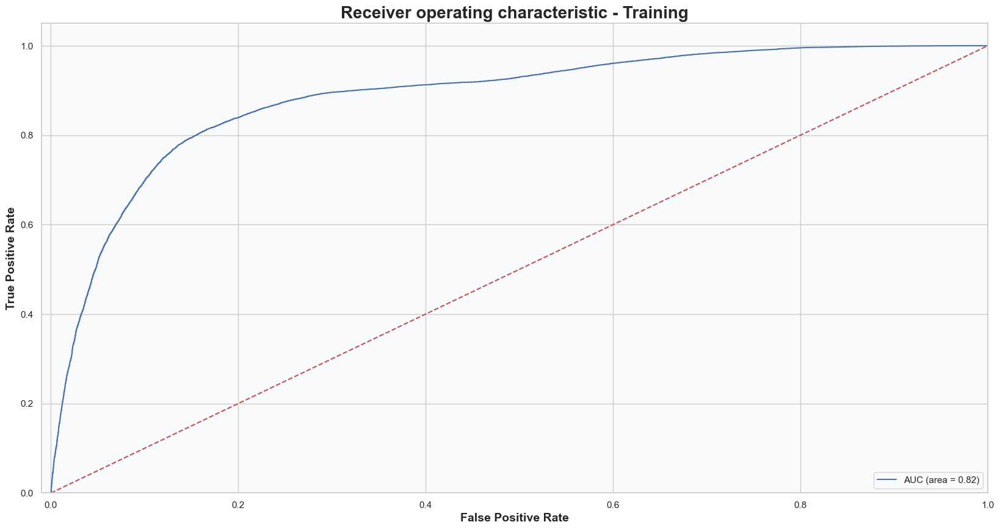

In [244]:
logit_roc_auc = roc_auc_score(y_train, y_pred_lr_train)
fpr, tpr, thresholds = roc_curve(y_train, lr.predict_proba(X_train)[:, 1])

plt.figure(figsize=(20, 10))

plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')

plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])

plt.xlabel('False Positive Rate', fontsize=14, fontweight='bold')
plt.ylabel('True Positive Rate', fontsize=14, fontweight='bold')
plt.title('Receiver operating characteristic - Training', fontsize=20, fontweight='bold')
plt.legend(loc="lower right")
# plt.savefig('Log_ROC')
plt.show()


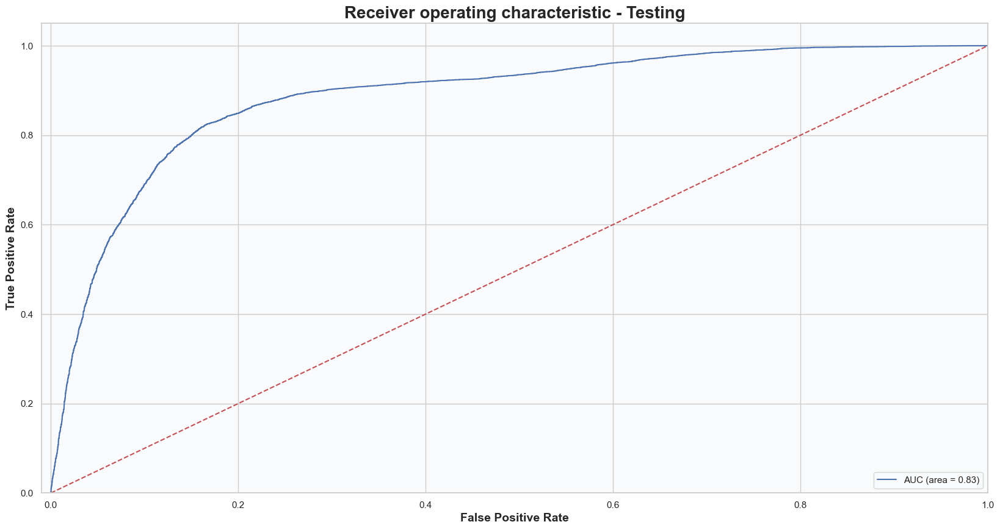

In [245]:
logit_roc_auc = roc_auc_score(y_test, y_pred_lr_test)
fpr, tpr, thresholds = roc_curve(y_test, lr.predict_proba(X_test)[:, 1])

plt.figure(figsize=(20, 10))

plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')

plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])

plt.xlabel('False Positive Rate', fontsize=14, fontweight='bold')
plt.ylabel('True Positive Rate', fontsize=14, fontweight='bold')
plt.title('Receiver operating characteristic - Testing', fontsize=20, fontweight='bold')
plt.legend(loc="lower right")
# plt.savefig('Log_ROC')
plt.show()


#### SVM (Support Vector Machine)

See the end of the file

#### KNN (K Nearest Neighbors)

In [246]:
# KNN - K Nearest Neighbors.
knn_model = KNeighborsClassifier()
knn_model.fit(X_train, y_train)


KNeighborsClassifier()

In [247]:
# Number of features that the estimator expects for subsequent calls to predict or transform.
knn_model.n_features_in_


22

In [248]:
knn_model.metric

'minkowski'

In [249]:
knn_model.n_samples_fit_


54805

In [250]:
knn_model.weights


'uniform'

In [251]:
# Training Set Estimation 
y_pred_knn_train = knn_model.predict(X_train) 
y_pred_knn_train


array([0, 0, 0, ..., 0, 1, 1])

In [252]:
# Training Probabilities 
y_pred_knn_train_Proba = knn_model.predict_proba(X_train) 
y_pred_knn_train_Proba


array([[1., 0.],
       [1., 0.],
       [1., 0.],
       ...,
       [1., 0.],
       [0., 1.],
       [0., 1.]])

In [253]:
# Training Classification Report 
print("================== KNN Training Classification Report ==================\n") 
print(classification_report(y_train, y_pred_knn_train))


================== KNN Training Classification Report ==================



              precision    recall  f1-score   support

           0       0.99      0.87      0.93     27329
           1       0.88      0.99      0.94     27476

    accuracy                           0.93     54805
   macro avg       0.94      0.93      0.93     54805
weighted avg       0.94      0.93      0.93     54805



In [254]:
# Make predictions on the training set 
y_train_preds = knn_model.predict_proba(X_train)[:, 1] 

# Evaluate the model 
print('=' * 47) 
print('======== KNN Training Classification Report ========') 
print('=' * 47) 

thresh = 0.5 

knn_train_auc, knn_train_accuracy, knn_train_recall, knn_train_precision, knn_train_specificity, knn_train_f1, knn_train_log_loss = print_report(y_train, y_pred_knn_train, thresh)


======== KNN Training Classification Report ========
AUC: 0.932
Accuracy: 0.932
Recall: 0.995
Precision: 0.884
Specificity: 0.868
Popularity: 0.501
F1: 0.936
Log Loss: 2.462
--------------------
---------- Confusion Matrix ----------

+----------------+---------+
| Metric         |   Value |
+================+=========+
| True Negative  |   23726 |
+----------------+---------+
| False Positive |    3603 |
+----------------+---------+
| False Negative |     141 |
+----------------+---------+
| True Positive  |   27335 |
+----------------+---------+
 


In [255]:
# Testing Set Estimation 
y_pred_knn_test = knn_model.predict(X_test) 
y_pred_knn_test

array([1, 1, 1, ..., 0, 1, 0])

In [256]:
# Testing Probabilities 
y_pred_knn_test_Proba = knn_model.predict_proba(X_test) 
y_pred_knn_test_Proba


array([[0. , 1. ],
       [0. , 1. ],
       [0. , 1. ],
       ...,
       [0.8, 0.2],
       [0.2, 0.8],
       [1. , 0. ]])

In [257]:
# Training Classification Report 
print("================== KNN Testing Classification Report ==================\n") 
print(classification_report(y_test, y_pred_knn_test))


================== KNN Testing Classification Report ==================

              precision    recall  f1-score   support

           0       0.99      0.84      0.91      9208
           1       0.86      0.99      0.92      9061

    accuracy                           0.91     18269
   macro avg       0.92      0.92      0.91     18269
weighted avg       0.92      0.91      0.91     18269



In [258]:
# Make predictions on the training set 
y_test_preds = lr.predict_proba(X_test)[:, 1] 

# Evaluate the model 
print('=' * 47) 
print('======== KNN Testing Classification Report ========') 
print('=' * 47) 

thresh = 0.5 

knn_test_auc, knn_test_accuracy, knn_test_recall, knn_test_precision, knn_test_specificity, knn_test_f1, knn_test_log_loss = print_report(y_test, y_pred_knn_test, thresh)


======== KNN Testing Classification Report ========
AUC: 0.915
Accuracy: 0.915
Recall: 0.989
Precision: 0.860
Specificity: 0.842
Popularity: 0.496
F1: 0.920
Log Loss: 3.080
--------------------
---------- Confusion Matrix ----------

+----------------+---------+
| Metric         |   Value |
+================+=========+
| True Negative  |    7750 |
+----------------+---------+
| False Positive |    1458 |
+----------------+---------+
| False Negative |     103 |
+----------------+---------+
| True Positive  |    8958 |
+----------------+---------+
 


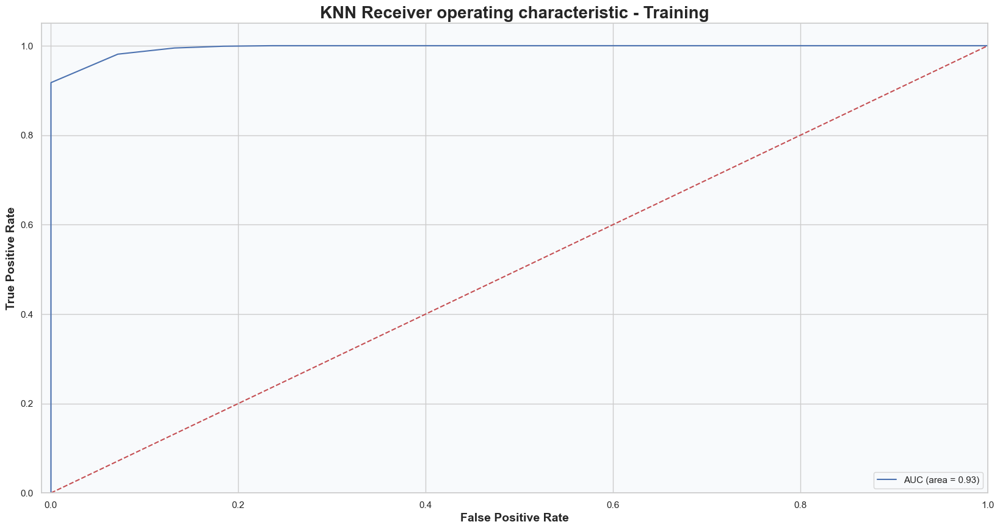

In [259]:
# ROC curve - Training
knn_roc_auc = roc_auc_score(y_train, y_pred_knn_train)
fpr, tpr, thresholds = roc_curve(y_train, knn_model.predict_proba(X_train)[:, 1])

plt.figure(figsize=(20, 10))

plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % knn_roc_auc)
plt.plot([0, 1], [0, 1],'r--')

plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])

plt.xlabel('False Positive Rate', fontsize=14, fontweight='bold')
plt.ylabel('True Positive Rate', fontsize=14, fontweight='bold')
plt.title('KNN Receiver operating characteristic - Training', fontsize=20, fontweight='bold')
plt.legend(loc="lower right")
# plt.savefig('Log_ROC')
plt.show()


In [260]:
# ROC curve - Training
knn_roc_auc = roc_auc_score(y_train, knn_model.predict_proba(X_train)[:, 1])
fpr, tpr, thresholds = roc_curve(y_train, knn_model.predict_proba(X_train)[:, 1])

# Create Plotly figure
fig = go.Figure()

# Add ROC curve trace
fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name='AUC (area = %0.2f)' % knn_roc_auc))

# Add reference line
fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', line=dict(dash='dash'), name='Random'))

# Set layout
fig.update_layout(
    title='KNN Receiver Operating Characteristic - Training',
    xaxis=dict(title='False Positive Rate', titlefont=dict(size=14, color='black', family='Arial, sans-serif')),
    yaxis=dict(title='True Positive Rate', titlefont=dict(size=14, color='black', family='Arial, sans-serif')),
    showlegend=True,
    legend=dict(x=1, y=1, traceorder='normal', font=dict(size=12, family='Arial, sans-serif')),
)

# Show the plot
fig.show()


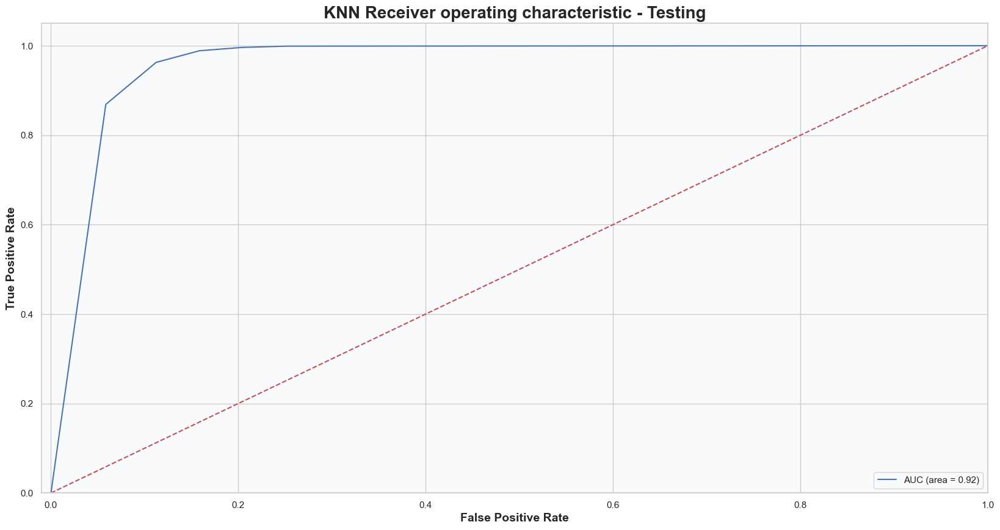

In [261]:
# ROC curve Testing
knn_roc_auc = roc_auc_score(y_test, y_pred_knn_test)
fpr, tpr, thresholds = roc_curve(y_test, knn_model.predict_proba(X_test)[:, 1])

plt.figure(figsize=(20, 10))

plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % knn_roc_auc)
plt.plot([0, 1], [0, 1],'r--')

plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])

plt.xlabel('False Positive Rate', fontsize=14, fontweight='bold')
plt.ylabel('True Positive Rate', fontsize=14, fontweight='bold')
plt.title('KNN Receiver operating characteristic - Testing', fontsize=20, fontweight='bold')
plt.legend(loc="lower right")
# plt.savefig('Log_ROC')
plt.show()


In [262]:
# ROC curve - Testing [Using Plotly]
knn_roc_auc = roc_auc_score(y_test, y_pred_knn_test)
fpr, tpr, thresholds = roc_curve(y_test, knn_model.predict_proba(X_test)[:, 1])

# Create Plotly figure
fig = go.Figure()

# Add ROC curve trace
fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name='AUC (area = %0.2f)' % knn_roc_auc))

# Add reference line
fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', line=dict(dash='dash'), name='Random'))

# Set layout
fig.update_layout(
    title='KNN Receiver Operating Characteristic - Testing',
    xaxis=dict(title='False Positive Rate', titlefont=dict(size=14, color='black', family='Arial, sans-serif')),
    yaxis=dict(title='True Positive Rate', titlefont=dict(size=14, color='black', family='Arial, sans-serif')),
    showlegend=True,
    legend=dict(x=1, y=1, traceorder='normal', font=dict(size=12, family='Arial, sans-serif')),
)

# Show the plot
fig.show()


In [263]:
# (KNN Model Tuning) -- Grid Search Cross Validation
knn_model_params = {
    "n_neighbors": np.arange(1,50)
    }

knn_model_params

{'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
        35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49])}

In [264]:
# KNN model
knn_model_cv = KNeighborsClassifier()


In [265]:
knn_model_cvgs = GridSearchCV(knn_model_cv, knn_model_params,
                         cv = 10,
                         n_jobs = -1,
                         verbose = 2).fit(X_train, y_train)


Fitting 10 folds for each of 49 candidates, totalling 490 fits


[CV] END ......................................n_neighbors=1; total time=   5.8s
[CV] END ......................................n_neighbors=1; total time=   5.9s
[CV] END ......................................n_neighbors=1; total time=   5.9s
[CV] END ......................................n_neighbors=1; total time=   6.0s
[CV] END ......................................n_neighbors=1; total time=   6.2s
[CV] END ......................................n_neighbors=1; total time=   6.2s
[CV] END ......................................n_neighbors=1; total time=   6.1s
[CV] END ......................................n_neighbors=1; total time=   6.0s
[CV] END ......................................n_neighbors=1; total time=   6.2s
[CV] END ......................................n_neighbors=1; total time=   6.4s
[CV] END ......................................n_neighbors=2; total time=   6.5s
[CV] END ......................................n_neighbors=2; total time=   6.6s
[CV] END ...................

In [266]:
knn_model_cvgs.best_params_


{'n_neighbors': 2}

In [267]:
knn_model_cvgs.best_score_


0.9364473289945225

In [268]:
# Model with CV
knn_model_tuned_cvgs =KNeighborsClassifier(n_neighbors = 2).fit(X_train, y_train)


In [269]:
# Training Set Estimation With CV
y_pred_knn_cv_train = knn_model_tuned_cvgs.predict(X_train) 
y_pred_knn_cv_train


array([0, 0, 0, ..., 0, 1, 1])

In [270]:
# Training Probabilities With CV
y_pred_knn_cv_train_Proba = knn_model_tuned_cvgs.predict_proba(X_train) 
y_pred_knn_cv_train_Proba


array([[1., 0.],
       [1., 0.],
       [1., 0.],
       ...,
       [1., 0.],
       [0., 1.],
       [0., 1.]])

In [271]:
# Training Classification Report 
print("================== KNN with CV Training Classification Report ==================\n") 
print(classification_report(y_train, y_pred_knn_cv_train))


================== KNN with CV Training Classification Report ==================

              precision    recall  f1-score   support

           0       0.99      1.00      1.00     27329
           1       1.00      0.99      1.00     27476

    accuracy                           1.00     54805
   macro avg       1.00      1.00      1.00     54805
weighted avg       1.00      1.00      1.00     54805



In [272]:
# Make predictions on the training set with CV
y_pred_knn_cv_train = knn_model_tuned_cvgs.predict_proba(X_train)[:, 1] 

# Evaluate the model 
print('=' * 47) 
print('======== KNN with CV Training Classification Report ========') 
print('=' * 47) 

thresh = 0.5 

knn_CV_train_auc, knn_CV_train_accuracy, knn_CV_train_recall, knn_CV_train_precision, knn_CV_train_specificity, knn_CV_train_f1, knn_CV_train_log_loss = print_report(y_train, y_pred_knn_cv_train, thresh)


======== KNN with CV Training Classification Report ========
AUC: 1.000
Accuracy: 0.996
Recall: 0.992
Precision: 1.000
Specificity: 0.885
Popularity: 0.501
F1: 0.996
Log Loss: 0.042
--------------------
---------- Confusion Matrix ----------

+----------------+---------+
| Metric         |   Value |
+================+=========+
| True Negative  |   27329 |
+----------------+---------+
| False Positive |       0 |
+----------------+---------+
| False Negative |     221 |
+----------------+---------+
| True Positive  |   27255 |
+----------------+---------+
 


In [273]:
# Testing Set Estimation 
y_pred_knn_cv_test = knn_model_tuned_cvgs.predict(X_test) 
y_pred_knn_test


array([1, 1, 1, ..., 0, 1, 0])

In [274]:
# Testing Probabilities With CV 
y_pred_knn_cv_test_Proba = knn_model_tuned_cvgs.predict_proba(X_test) 
y_pred_knn_cv_test_Proba


array([[0., 1.],
       [0., 1.],
       [0., 1.],
       ...,
       [1., 0.],
       [0., 1.],
       [1., 0.]])

In [275]:
# Testing Classification Report 
print("================== KNN with CV Testing Classification Report ==================\n") 
print(classification_report(y_test, y_pred_knn_cv_test))


================== KNN with CV Testing Classification Report ==================

              precision    recall  f1-score   support

           0       0.97      0.91      0.94      9208
           1       0.91      0.97      0.94      9061

    accuracy                           0.94     18269
   macro avg       0.94      0.94      0.94     18269
weighted avg       0.94      0.94      0.94     18269



In [276]:
# Make predictions on the testing set with CV
y_pred_knn_cv_test = knn_model_tuned_cvgs.predict_proba(X_test)[:, 1] 

# Evaluate the model 
print('=' * 47) 
print('======== KNN with CV Testing Classification Report ========') 
print('=' * 47) 

thresh = 0.5 

knn_CV_test_auc, knn_CV_test_accuracy, knn_CV_test_recall, knn_CV_test_precision, knn_CV_test_specificity, knn_CV_test_f1, knn_CV_test_log_loss = print_report(y_test, y_pred_knn_cv_test, thresh)


======== KNN with CV Testing Classification Report ========
AUC: 0.951
Accuracy: 0.941
Recall: 0.975
Precision: 0.912
Specificity: 0.836
Popularity: 0.496
F1: 0.943
Log Loss: 1.759
--------------------
---------- Confusion Matrix ----------

+----------------+---------+
| Metric         |   Value |
+================+=========+
| True Negative  |    8360 |
+----------------+---------+
| False Positive |     848 |
+----------------+---------+
| False Negative |     229 |
+----------------+---------+
| True Positive  |    8832 |
+----------------+---------+
 


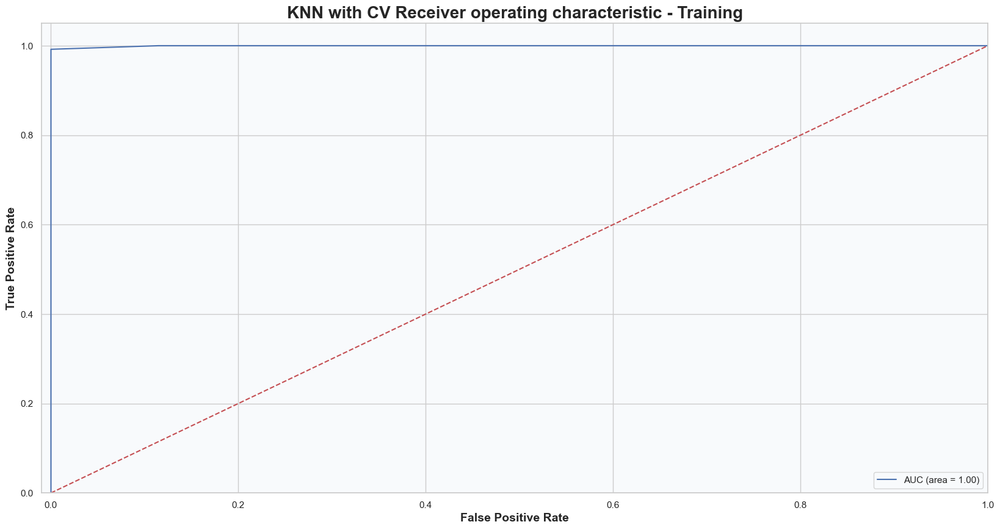

In [277]:
# ROC curve - Training with CV
knn_roc_auc = roc_auc_score(y_train, y_pred_knn_cv_train) 
fpr, tpr, thresholds = roc_curve(y_train, knn_model_tuned_cvgs.predict_proba(X_train)[:, 1]) 

plt.figure(figsize=(20, 10)) 

plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % knn_roc_auc) 
plt.plot([0, 1], [0, 1],'r--') 
plt.xlim([-0.01, 1.0]) 
plt.ylim([0.0, 1.05]) 
plt.xlabel('False Positive Rate', fontsize=14, fontweight='bold') 
plt.ylabel('True Positive Rate', fontsize=14, fontweight='bold') 
plt.title('KNN with CV Receiver operating characteristic - Training', fontsize=20, fontweight='bold') 
plt.legend(loc="lower right") 

plt.show()


In [278]:
# ROC curve - Training with CV (Using Plotly)
knn_roc_auc = roc_auc_score(y_train, y_pred_knn_cv_train) 
fpr, tpr, thresholds = roc_curve(y_train, knn_model_tuned_cvgs.predict_proba(X_train)[:, 1]) 

# Create Plotly figure 
fig = go.Figure() 

# Add ROC curve trace 
fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name='AUC (area = %0.2f)' % knn_roc_auc)) 

# Add reference line 
fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', line=dict(dash='dash'), name='Random')) 

# Set layout 
fig.update_layout( title='KNN Receiver Operating Characteristic - Training', xaxis=dict(title='False Positive Rate', titlefont=dict(size=14, 
                    color='black', family='Arial, sans-serif')), yaxis=dict(title='True Positive Rate', titlefont=dict(size=14, color='black', 
                    family='Arial, sans-serif')), showlegend=True, legend=dict(x=1, y=1, traceorder='normal', 
                    font=dict(size=12, family='Arial, sans-serif')), ) 

# Show the plot 
fig.show()


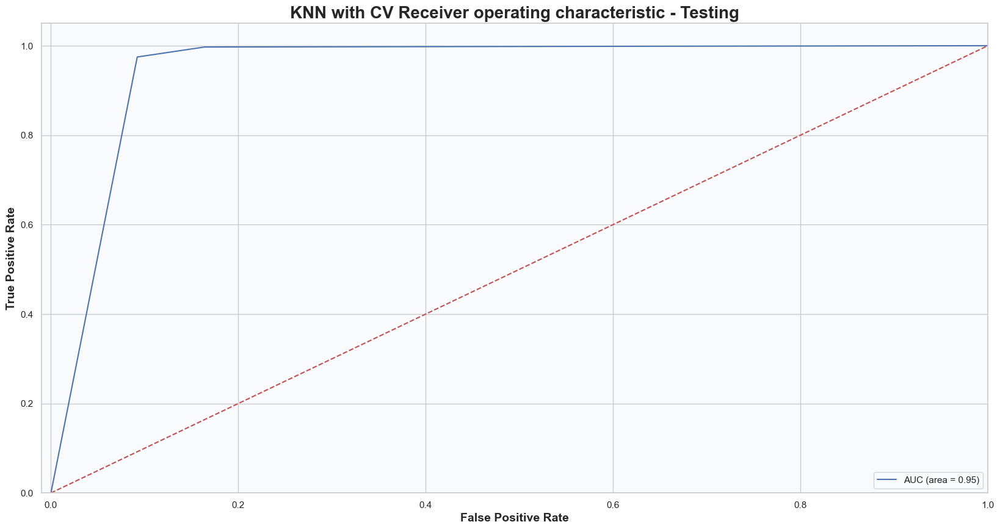

In [279]:
# ROC curve - Testing with CV
knn_roc_auc_cv_testing = roc_auc_score(y_test, y_pred_knn_cv_test) 
fpr, tpr, thresholds = roc_curve(y_test, knn_model_tuned_cvgs.predict_proba(X_test)[:, 1]) 

plt.figure(figsize=(20, 10)) 

plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % knn_roc_auc_cv_testing) 
plt.plot([0, 1], [0, 1],'r--') 
plt.xlim([-0.01, 1.0]) 
plt.ylim([0.0, 1.05]) 
plt.xlabel('False Positive Rate', fontsize=14, fontweight='bold') 
plt.ylabel('True Positive Rate', fontsize=14, fontweight='bold') 
plt.title('KNN with CV Receiver operating characteristic - Testing', fontsize=20, fontweight='bold') 
plt.legend(loc="lower right") 

plt.show()


In [280]:
# ROC curve - Testing with CV (Using Plotly) 
knn_roc_auc_cv_testing = roc_auc_score(y_test, y_pred_knn_cv_test) 
fpr, tpr, thresholds = roc_curve(y_test, knn_model_tuned_cvgs.predict_proba(X_test)[:, 1]) 

# Create Plotly figure 
fig = go.Figure() 

# Add ROC curve trace 
fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name='AUC (area = %0.2f)' % knn_roc_auc_cv_testing)) 

# Add reference line 
fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', line=dict(dash='dash'), name='Random')) 

# Set layout 
fig.update_layout( title='KNN Receiver Operating Characteristic - Training', xaxis=dict(title='False Positive Rate', titlefont=dict(size=14, 
                    color='black', family='Arial, sans-serif')), yaxis=dict(title='True Positive Rate', titlefont=dict(size=14, color='black', 
                    family='Arial, sans-serif')), showlegend=True, legend=dict(x=1, y=1, traceorder='normal', 
                    font=dict(size=12, family='Arial, sans-serif')), ) 

# Show the plot 
fig.show()


#### Decision Tree

In [281]:
# Decision tree
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)


DecisionTreeClassifier(random_state=42)

In [282]:
dt_model.random_state


42

In [283]:
dt_model.min_samples_leaf


1

In [284]:
dt_model.min_samples_split

2

In [285]:
dt_model.max_features_


22

In [286]:
dt_model.n_features_in_


22

In [287]:
dt_model.feature_names_in_


array(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact_type', 'month', 'day_of_week', 'last_contact_duration',
       'campaign', 'passed_days', 'previous', 'previous_outcome',
       'employment_variation_rate', 'consumer_price_index',
       'consumer_confidence_index', 'euribor3m', 'number_of_employees',
       'age_band', 'new_passed_days'], dtype=object)

In [288]:
dt_model.feature_importances_


array([0.03155895, 0.02079356, 0.01081209, 0.01988187, 0.00912278,
       0.00999272, 0.00613176, 0.02123141, 0.01082028, 0.01810712,
       0.42822905, 0.01888479, 0.0082991 , 0.00681671, 0.00536766,
       0.00293767, 0.04238657, 0.09372655, 0.06032933, 0.15816751,
       0.01476121, 0.00164132])

In [289]:
# Training Set Estimation 
y_pred_dt_train = dt_model.predict(X_train) 
y_pred_dt_train


array([0, 0, 0, ..., 0, 1, 1])

In [290]:
# Training Probabilities 
y_pred_dt_train_Proba = dt_model.predict_proba(X_train) 
y_pred_dt_train_Proba


array([[1., 0.],
       [1., 0.],
       [1., 0.],
       ...,
       [1., 0.],
       [0., 1.],
       [0., 1.]])

In [291]:
# Training Classification Report 
print("================== DT Training Classification Report ==================\n") 
print(classification_report(y_train, y_pred_dt_train))


================== DT Training Classification Report ==================

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     27329
           1       1.00      1.00      1.00     27476

    accuracy                           1.00     54805
   macro avg       1.00      1.00      1.00     54805
weighted avg       1.00      1.00      1.00     54805



In [292]:
# Make predictions on the training set 
y_train_preds = dt_model.predict_proba(X_train)[:, 1] 

# Evaluate the model 
print('=' * 47) 
print('======== DT Training Classification Report ========') 
print('=' * 47) 

thresh = 0.5 

dt_train_auc, dt_train_accuracy, dt_train_recall, dt_train_precision, dt_train_specificity, dt_train_f1, dt_train_log_loss = print_report(y_train, y_pred_dt_train, thresh)


======== DT Training Classification Report ========
AUC: 1.000
Accuracy: 1.000
Recall: 1.000
Precision: 1.000
Specificity: 1.000
Popularity: 0.501
F1: 1.000
Log Loss: 0.001
--------------------
---------- Confusion Matrix ----------

+----------------+---------+
| Metric         |   Value |
+================+=========+
| True Negative  |   27329 |
+----------------+---------+
| False Positive |       0 |
+----------------+---------+
| False Negative |       2 |
+----------------+---------+
| True Positive  |   27474 |
+----------------+---------+
 


In [293]:
# Testing Set Estimation 
y_pred_dt_test = dt_model.predict(X_test) 
y_pred_dt_test


array([1, 1, 1, ..., 0, 1, 0])

In [294]:
# Testing Probabilities 
y_pred_dt_test_Proba = dt_model.predict_proba(X_test) 
y_pred_dt_test_Proba


array([[0., 1.],
       [0., 1.],
       [0., 1.],
       ...,
       [1., 0.],
       [0., 1.],
       [1., 0.]])

In [295]:
# Testing Classification Report 
print("================== DT Testing Classification Report ==================\n") 
print(classification_report(y_test, y_pred_dt_test))


================== DT Testing Classification Report ==================

              precision    recall  f1-score   support

           0       0.93      0.92      0.92      9208
           1       0.92      0.93      0.92      9061

    accuracy                           0.92     18269
   macro avg       0.92      0.92      0.92     18269
weighted avg       0.92      0.92      0.92     18269



In [296]:
# Testing Classification Report 
# Make predictions on the training set 
y_train_preds = dt_model.predict_proba(X_test)[:, 1] 

# Evaluate the model 
print('=' * 47) 
print('======== DT Testing Classification Report ========') 
print('=' * 47) 

thresh = 0.5 

dt_test_auc, dt_test_accuracy, dt_test_recall, dt_test_precision, dt_test_specificity, dt_test_f1, dt_test_log_loss = print_report(y_test, y_pred_dt_test, thresh)


======== DT Testing Classification Report ========
AUC: 0.924
Accuracy: 0.924
Recall: 0.930
Precision: 0.917
Specificity: 0.918
Popularity: 0.496
F1: 0.924
Log Loss: 2.750
--------------------
---------- Confusion Matrix ----------

+----------------+---------+
| Metric         |   Value |
+================+=========+
| True Negative  |    8450 |
+----------------+---------+
| False Positive |     758 |
+----------------+---------+
| False Negative |     636 |
+----------------+---------+
| True Positive  |    8425 |
+----------------+---------+
 


In [297]:
confusion_matrix(y_test, y_pred_dt_test)


array([[8450,  758],
       [ 636, 8425]])

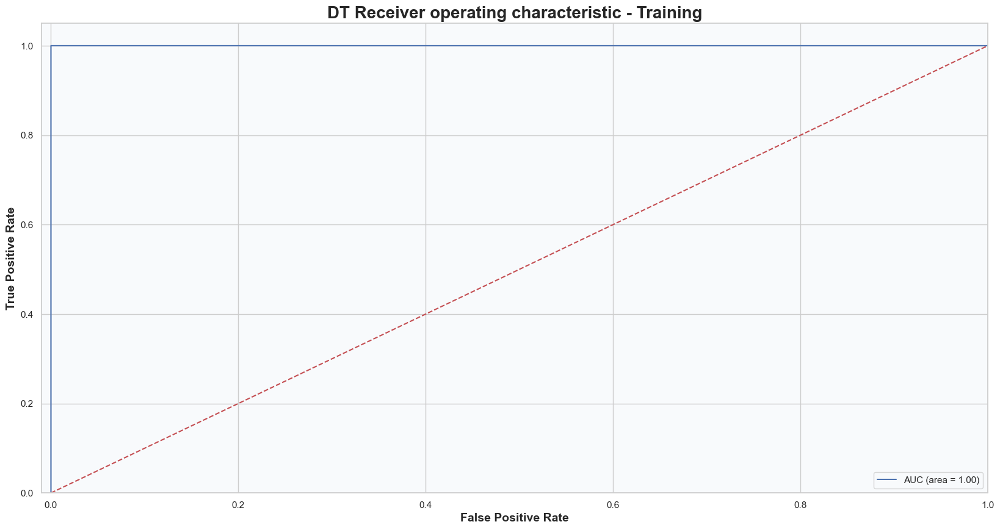

In [298]:
# ROC curve - Training
dt_roc_auc = roc_auc_score(y_train, y_pred_dt_train)
fpr, tpr, thresholds = roc_curve(y_train, dt_model.predict_proba(X_train)[:, 1])

plt.figure(figsize=(20, 10))

plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % dt_roc_auc)
plt.plot([0, 1], [0, 1],'r--')

plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])

plt.xlabel('False Positive Rate', fontsize=14, fontweight='bold')
plt.ylabel('True Positive Rate', fontsize=14, fontweight='bold')
plt.title('DT Receiver operating characteristic - Training', fontsize=20, fontweight='bold')
plt.legend(loc="lower right")

plt.show()


In [299]:
# ROC curve - Training (Using Plotly)
dt_roc_auc = roc_auc_score(y_train, y_pred_dt_train)
fpr, tpr, thresholds = roc_curve(y_train, dt_model.predict_proba(X_train)[:, 1])

# Create Plotly figure
fig = go.Figure()

# Add ROC curve trace
fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name='AUC (area = %0.2f)' % dt_roc_auc))

# Add reference line
fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', line=dict(dash='dash'), name='Random'))

# Set layout
fig.update_layout(
    title='DT Receiver Operating Characteristic - Training',
    xaxis=dict(title='False Positive Rate', titlefont=dict(size=14, color='black', family='Arial, sans-serif')),
    yaxis=dict(title='True Positive Rate', titlefont=dict(size=14, color='black', family='Arial, sans-serif')),
    showlegend=True,
    legend=dict(x=1, y=1, traceorder='normal', font=dict(size=12, family='Arial, sans-serif')),
)

# Show the plot
fig.show()


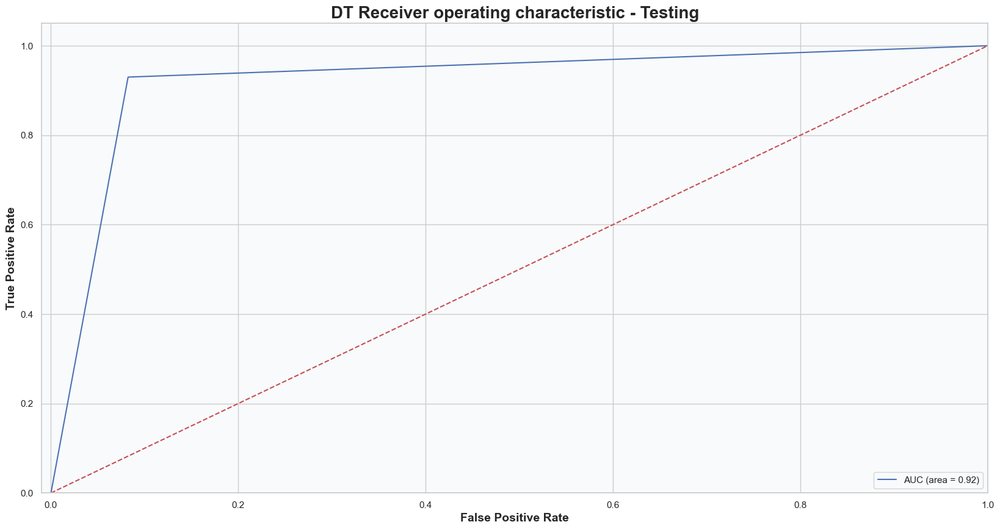

In [300]:
# ROC curve Testing
dt_roc_auc = roc_auc_score(y_test, y_pred_dt_test)
fpr, tpr, thresholds = roc_curve(y_test, dt_model.predict_proba(X_test)[:, 1])

plt.figure(figsize=(20, 10))

plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % dt_roc_auc)
plt.plot([0, 1], [0, 1],'r--')

plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])

plt.xlabel('False Positive Rate', fontsize=14, fontweight='bold')
plt.ylabel('True Positive Rate', fontsize=14, fontweight='bold')
plt.title('DT Receiver operating characteristic - Testing', fontsize=20, fontweight='bold')
plt.legend(loc="lower right")

plt.show()


In [301]:
# ROC curve - Testing [Using Plotly]
dt_roc_auc = roc_auc_score(y_test, y_pred_dt_test)
fpr, tpr, thresholds = roc_curve(y_test, dt_model.predict_proba(X_test)[:, 1])

# Create Plotly figure
fig = go.Figure()

# Add ROC curve trace
fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name='AUC (area = %0.2f)' % dt_roc_auc))

# Add reference line
fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', line=dict(dash='dash'), name='Random'))

# Set layout
fig.update_layout(
    title='DT Receiver Operating Characteristic - Testing',
    xaxis=dict(title='False Positive Rate', titlefont=dict(size=14, color='black', family='Arial, sans-serif')),
    yaxis=dict(title='True Positive Rate', titlefont=dict(size=14, color='black', family='Arial, sans-serif')),
    showlegend=True,
    legend=dict(x=1, y=1, traceorder='normal', font=dict(size=12, family='Arial, sans-serif')),
)

# Show the plot
fig.show()


In [302]:
# (DT Model Tuning) -- Grid Search Cross Validation
dt_model_params = {
    "max_depth": [1,3,5,8,10],
    "min_samples_split": [2,3,5,10,20,50]
}

dt_model_params

{'max_depth': [1, 3, 5, 8, 10], 'min_samples_split': [2, 3, 5, 10, 20, 50]}

In [303]:
dt_model_cv = DecisionTreeClassifier(random_state = 42)


In [304]:
dt_model_cvgs = GridSearchCV(dt_model_cv, dt_model_params,
                         cv = 10,
                         n_jobs = -1,
                         verbose = 2).fit(X_train, y_train)


Fitting 10 folds for each of 30 candidates, totalling 300 fits
[CV] END ...................max_depth=1, min_samples_split=2; total time=   0.3s
[CV] END ...................max_depth=1, min_samples_split=2; total time=   0.3s
[CV] END ...................max_depth=1, min_samples_split=2; total time=   0.2s
[CV] END ...................max_depth=1, min_samples_split=2; total time=   0.3s
[CV] END ...................max_depth=1, min_samples_split=2; total time=   0.2s
[CV] END ...................max_depth=1, min_samples_split=2; total time=   0.3s
[CV] END ...................max_depth=1, min_samples_split=2; total time=   0.3s
[CV] END ...................max_depth=1, min_samples_split=2; total time=   0.3s
[CV] END ...................max_depth=1, min_samples_split=2; total time=   0.2s


[CV] END ...................max_depth=1, min_samples_split=2; total time=   0.2s
[CV] END ...................max_depth=1, min_samples_split=3; total time=   0.3s
[CV] END ...................max_depth=1, min_samples_split=3; total time=   0.2s
[CV] END ...................max_depth=1, min_samples_split=3; total time=   0.2s
[CV] END ...................max_depth=1, min_samples_split=3; total time=   0.2s
[CV] END ...................max_depth=1, min_samples_split=3; total time=   0.2s
[CV] END ...................max_depth=1, min_samples_split=3; total time=   0.1s
[CV] END ...................max_depth=1, min_samples_split=3; total time=   0.1s
[CV] END ...................max_depth=1, min_samples_split=3; total time=   0.1s
[CV] END ...................max_depth=1, min_samples_split=3; total time=   0.1s
[CV] END ...................max_depth=1, min_samples_split=3; total time=   0.1s
[CV] END ...................max_depth=1, min_samples_split=5; total time=   0.1s
[CV] END ...................

In [305]:
dt_model_cvgs.best_params_


{'max_depth': 10, 'min_samples_split': 2}

In [306]:
dt_model_cvgs.best_score_


0.91137656695925

In [307]:
# DT Model with CV
dt_model_tuned_cvgs =DecisionTreeClassifier(random_state = 42,
                                               max_depth = 10,
                                               min_samples_split = 2 ).fit(X_train, y_train)


In [308]:
# Training Set Estimation With CV
y_pred_dt_cv_train = dt_model_tuned_cvgs.predict(X_train) 
y_pred_dt_cv_train


array([0, 0, 0, ..., 0, 1, 1])

In [309]:
# Training Probabilities With CV
y_pred_dt_cv_train_Proba = dt_model_tuned_cvgs.predict_proba(X_train) 
y_pred_dt_cv_train_Proba


array([[1.        , 0.        ],
       [0.99455311, 0.00544689],
       [1.        , 0.        ],
       ...,
       [0.91085506, 0.08914494],
       [0.        , 1.        ],
       [0.22273782, 0.77726218]])

In [310]:
# Training Classification Report with CV
print("================== DT with CV Training Classification Report ==================\n") 
print(classification_report(y_train, y_pred_dt_cv_train))


================== DT with CV Training Classification Report ==================

              precision    recall  f1-score   support

           0       0.95      0.90      0.93     27329
           1       0.91      0.96      0.93     27476

    accuracy                           0.93     54805
   macro avg       0.93      0.93      0.93     54805
weighted avg       0.93      0.93      0.93     54805



In [311]:
# Make predictions on the training set with CV
y_pred_dt_cv_train = dt_model_tuned_cvgs.predict_proba(X_train)[:, 1] 

# Evaluate the model 
print('=' * 47) 
print('======== DT with CV Training Classification Report ========') 
print('=' * 47) 

thresh = 0.5 

dt_CV_train_auc, dt_CV_train_accuracy, dt_CV_train_recall, dt_CV_train_precision, dt_CV_train_specificity, dt_CV_train_f1, dt_CV_train_log_loss = print_report(y_train, y_pred_dt_cv_train, thresh)


======== DT with CV Training Classification Report ========
AUC: 0.976
Accuracy: 0.929
Recall: 0.956
Precision: 0.907
Specificity: 0.901
Popularity: 0.501
F1: 0.931
Log Loss: 0.184
--------------------
---------- Confusion Matrix ----------

+----------------+---------+
| Metric         |   Value |
+================+=========+
| True Negative  |   24647 |
+----------------+---------+
| False Positive |    2682 |
+----------------+---------+
| False Negative |    1221 |
+----------------+---------+
| True Positive  |   26255 |
+----------------+---------+
 


In [312]:
# Testing Set Estimation 
y_pred_dt_cv_test = dt_model_tuned_cvgs.predict(X_test) 
y_pred_dt_cv_test


array([1, 1, 1, ..., 0, 0, 0])

In [313]:
# Testing Probabilities With CV 
y_pred_dt_cv_test_Proba = dt_model_tuned_cvgs.predict_proba(X_test) 
y_pred_dt_cv_test_Proba


array([[0.0027248 , 0.9972752 ],
       [0.02312925, 0.97687075],
       [0.0027248 , 0.9972752 ],
       ...,
       [0.91085506, 0.08914494],
       [0.91085506, 0.08914494],
       [0.91085506, 0.08914494]])

In [314]:
# DT Testing Classification Report 
print("================== DT with CV Testing Classification Report ==================\n") 
print(classification_report(y_test, y_pred_dt_cv_test))


================== DT with CV Testing Classification Report ==================

              precision    recall  f1-score   support

           0       0.94      0.89      0.91      9208
           1       0.89      0.94      0.92      9061

    accuracy                           0.91     18269
   macro avg       0.91      0.91      0.91     18269
weighted avg       0.92      0.91      0.91     18269



In [315]:
# DT Testing Classification Report 
# Make predictions on the testing set with CV
y_pred_dt_cv_test = dt_model_tuned_cvgs.predict_proba(X_test)[:, 1] 

# Evaluate the model 
print('=' * 47) 
print('======== DT with CV Testing Classification Report ========') 
print('=' * 47) 

thresh = 0.5 

dt_CV_test_auc, dt_CV_test_accuracy, dt_CV_test_recall, dt_CV_test_precision, dt_CV_test_specificity, dt_CV_test_f1, dt_CV_test_log_loss = print_report(y_test, y_pred_dt_cv_test, thresh)


======== DT with CV Testing Classification Report ========
AUC: 0.958
Accuracy: 0.914
Recall: 0.941
Precision: 0.892
Specificity: 0.887
Popularity: 0.496
F1: 0.916
Log Loss: 0.446
--------------------
---------- Confusion Matrix ----------

+----------------+---------+
| Metric         |   Value |
+================+=========+
| True Negative  |    8174 |
+----------------+---------+
| False Positive |    1034 |
+----------------+---------+
| False Negative |     539 |
+----------------+---------+
| True Positive  |    8522 |
+----------------+---------+
 


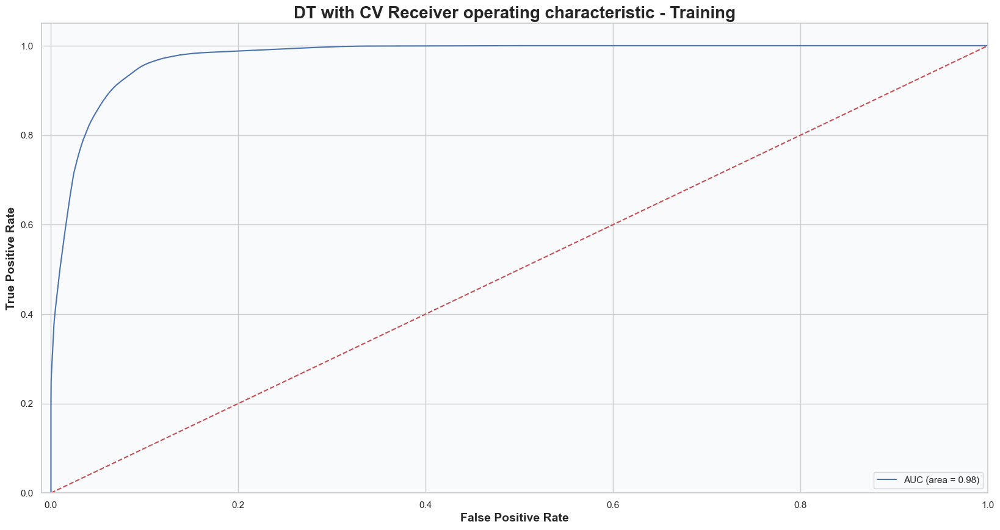

In [316]:
# ROC curve - Training with CV
dt_roc_auc = roc_auc_score(y_train, y_pred_dt_cv_train) 
fpr, tpr, thresholds = roc_curve(y_train, dt_model_tuned_cvgs.predict_proba(X_train)[:, 1]) 

plt.figure(figsize=(20, 10)) 

plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % dt_roc_auc) 
plt.plot([0, 1], [0, 1],'r--') 
plt.xlim([-0.01, 1.0]) 
plt.ylim([0.0, 1.05]) 
plt.xlabel('False Positive Rate', fontsize=14, fontweight='bold') 
plt.ylabel('True Positive Rate', fontsize=14, fontweight='bold') 
plt.title('DT with CV Receiver operating characteristic - Training', fontsize=20, fontweight='bold') 
plt.legend(loc="lower right") 

plt.show()


In [317]:
# ROC curve - Training with CV (Using Plotly)
dt_roc_auc = roc_auc_score(y_train, y_pred_dt_cv_train) 
fpr, tpr, thresholds = roc_curve(y_train, dt_model_tuned_cvgs.predict_proba(X_train)[:, 1]) 

# Create Plotly figure 
fig = go.Figure() 

# Add ROC curve trace 
fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name='AUC (area = %0.2f)' % dt_roc_auc)) 

# Add reference line 
fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', line=dict(dash='dash'), name='Random')) 

# Set layout 
fig.update_layout( title='DT Receiver Operating Characteristic - Training', xaxis=dict(title='False Positive Rate', titlefont=dict(size=14, 
                    color='black', family='Arial, sans-serif')), yaxis=dict(title='True Positive Rate', titlefont=dict(size=14, color='black', 
                    family='Arial, sans-serif')), showlegend=True, legend=dict(x=1, y=1, traceorder='normal', 
                    font=dict(size=12, family='Arial, sans-serif')), ) 

# Show the plot 
fig.show()


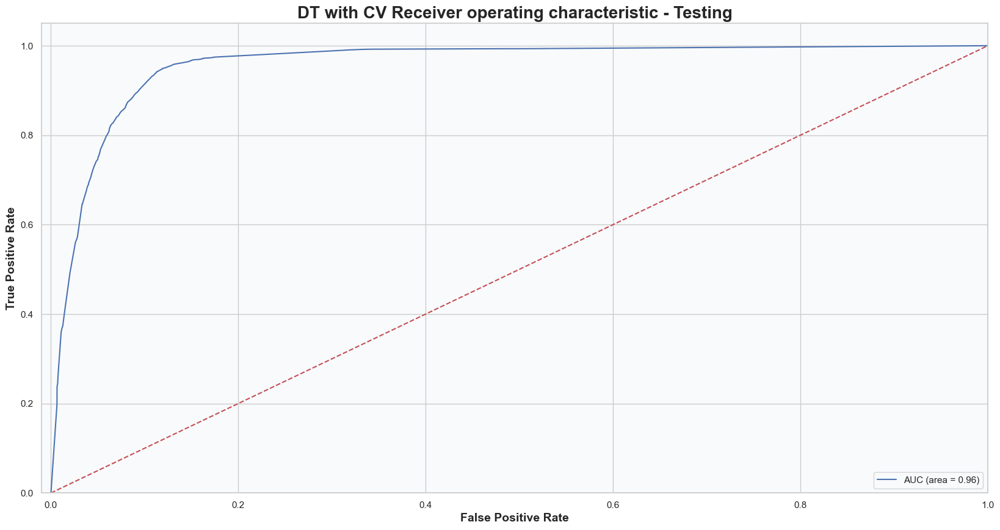

In [318]:
# ROC curve - Testing with CV
dt_roc_auc_cv_testing = roc_auc_score(y_test, y_pred_dt_cv_test) 
fpr, tpr, thresholds = roc_curve(y_test, dt_model_tuned_cvgs.predict_proba(X_test)[:, 1]) 

plt.figure(figsize=(20, 10)) 

plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % dt_roc_auc_cv_testing) 
plt.plot([0, 1], [0, 1],'r--') 
plt.xlim([-0.01, 1.0]) 
plt.ylim([0.0, 1.05]) 
plt.xlabel('False Positive Rate', fontsize=14, fontweight='bold') 
plt.ylabel('True Positive Rate', fontsize=14, fontweight='bold') 
plt.title('DT with CV Receiver operating characteristic - Testing', fontsize=20, fontweight='bold') 
plt.legend(loc="lower right") 

plt.show()


In [319]:
# ROC curve - Testing with CV (Using Plotly)
dt_roc_auc_cv_testing = roc_auc_score(y_test, y_pred_dt_cv_test) 
fpr, tpr, thresholds = roc_curve(y_test, dt_model_tuned_cvgs.predict_proba(X_test)[:, 1]) 

# Create Plotly figure 
fig = go.Figure() 

# Add ROC curve trace 
fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name='AUC (area = %0.2f)' % dt_roc_auc_cv_testing)) 

# Add reference line 
fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', line=dict(dash='dash'), name='Random')) 

# Set layout 
fig.update_layout( title='DT Receiver Operating Characteristic - Testing', xaxis=dict(title='False Positive Rate', titlefont=dict(size=14, 
                    color='black', family='Arial, sans-serif')), yaxis=dict(title='True Positive Rate', titlefont=dict(size=14, color='black', 
                    family='Arial, sans-serif')), showlegend=True, legend=dict(x=1, y=1, traceorder='normal', 
                    font=dict(size=12, family='Arial, sans-serif')), ) 

# Show the plot 
fig.show()


#### Random Forest.

In [320]:
# Random forest
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

In [321]:
rf_model.random_state

42

In [322]:
rf_model.min_samples_leaf


1

In [323]:
rf_model.min_samples_split


2

In [324]:
rf_model.n_features_in_


22

In [325]:
rf_model.feature_names_in_


array(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact_type', 'month', 'day_of_week', 'last_contact_duration',
       'campaign', 'passed_days', 'previous', 'previous_outcome',
       'employment_variation_rate', 'consumer_price_index',
       'consumer_confidence_index', 'euribor3m', 'number_of_employees',
       'age_band', 'new_passed_days'], dtype=object)

In [326]:
rf_model.feature_importances_


array([0.03905766, 0.02775187, 0.0186281 , 0.02554804, 0.02727217,
       0.02881735, 0.01860655, 0.03901664, 0.02507778, 0.02654438,
       0.31253962, 0.02145221, 0.0131237 , 0.01096135, 0.00935841,
       0.04273339, 0.04606401, 0.05160296, 0.11653067, 0.07912552,
       0.01800552, 0.0021821 ])

In [327]:
# Training Set Estimation 
y_pred_rf_train = rf_model.predict(X_train) 
y_pred_rf_train


array([0, 0, 0, ..., 0, 1, 1])

In [328]:
# Training Probabilities 
y_pred_rf_train_Proba = rf_model.predict_proba(X_train) 
y_pred_rf_train_Proba


array([[1.  , 0.  ],
       [1.  , 0.  ],
       [1.  , 0.  ],
       ...,
       [0.88, 0.12],
       [0.01, 0.99],
       [0.  , 1.  ]])

In [329]:
# Training Classification Report 
print("================== RF Training Classification Report ==================\n") 
print(classification_report(y_train, y_pred_rf_train))


================== RF Training Classification Report ==================

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     27329
           1       1.00      1.00      1.00     27476

    accuracy                           1.00     54805
   macro avg       1.00      1.00      1.00     54805
weighted avg       1.00      1.00      1.00     54805



In [330]:
# Make predictions on the training set 
y_train_preds = rf_model.predict_proba(X_train)[:, 1] 

# Evaluate the model 
print('=' * 47) 
print('======== RF Training Classification Report ========') 
print('=' * 47) 

thresh = 0.5 

rf_train_auc, rf_train_accuracy, rf_train_recall, rf_train_precision, rf_train_specificity, rf_train_f1, rf_train_log_loss = print_report(y_train, y_train_preds, thresh)


======== RF Training Classification Report ========
AUC: 1.000
Accuracy: 1.000
Recall: 1.000
Precision: 1.000
Specificity: 1.000
Popularity: 0.501
F1: 1.000
Log Loss: 0.038
--------------------
---------- Confusion Matrix ----------

+----------------+---------+
| Metric         |   Value |
+================+=========+
| True Negative  |   27329 |
+----------------+---------+
| False Positive |       0 |
+----------------+---------+
| False Negative |       2 |
+----------------+---------+
| True Positive  |   27474 |
+----------------+---------+
 


In [331]:
# Testing Set Estimation 
y_pred_rf_test = rf_model.predict(X_test) 
y_pred_rf_test


array([1, 1, 1, ..., 0, 1, 0])

In [332]:
# Testing Probabilities 
y_pred_rf_test_Proba = rf_model.predict_proba(X_test) 
y_pred_rf_test_Proba


array([[0.  , 1.  ],
       [0.  , 1.  ],
       [0.  , 1.  ],
       ...,
       [0.79, 0.21],
       [0.25, 0.75],
       [0.98, 0.02]])

In [333]:
# Testing Classification Report 
print("================== RF Testing Classification Report ==================\n") 
print(classification_report(y_test, y_pred_rf_test))


================== RF Testing Classification Report ==================

              precision    recall  f1-score   support

           0       0.96      0.94      0.95      9208
           1       0.94      0.96      0.95      9061

    accuracy                           0.95     18269
   macro avg       0.95      0.95      0.95     18269
weighted avg       0.95      0.95      0.95     18269



In [334]:
# Testing Classification Report 
# Make predictions on the training set 
y_test_preds = rf_model.predict_proba(X_test)[:, 1] 

# Evaluate the model 
print('=' * 47) 
print('======== RF Testing Classification Report ========') 
print('=' * 47) 

thresh = 0.5 

rf_test_auc, rf_test_accuracy, rf_test_recall, rf_test_precision, rf_test_specificity, rf_test_f1, rf_test_log_loss = print_report(y_test, y_test_preds, thresh)


======== RF Testing Classification Report ========
AUC: 0.991
Accuracy: 0.951
Recall: 0.962
Precision: 0.941
Specificity: 0.937
Popularity: 0.496
F1: 0.951
Log Loss: 0.136
--------------------
---------- Confusion Matrix ----------

+----------------+---------+
| Metric         |   Value |
+================+=========+
| True Negative  |    8661 |
+----------------+---------+
| False Positive |     547 |
+----------------+---------+
| False Negative |     348 |
+----------------+---------+
| True Positive  |    8713 |
+----------------+---------+
 


In [335]:
confusion_matrix(y_test, y_pred_rf_test)


array([[8661,  547],
       [ 348, 8713]])

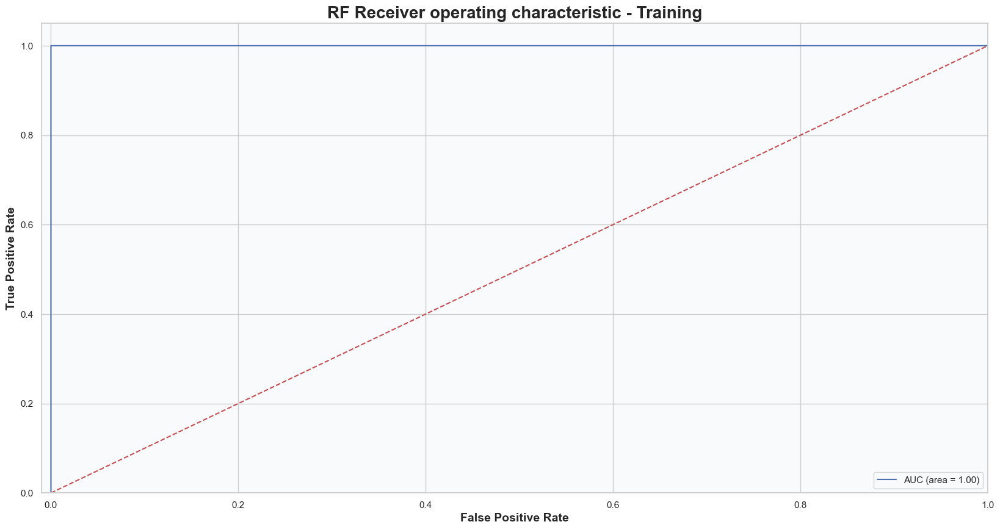

In [336]:
# ROC curve - Training
rf_roc_auc = roc_auc_score(y_train, y_pred_rf_train)
fpr, tpr, thresholds = roc_curve(y_train, rf_model.predict_proba(X_train)[:, 1])

plt.figure(figsize=(20, 10))

plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % rf_roc_auc)
plt.plot([0, 1], [0, 1],'r--')

plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])

plt.xlabel('False Positive Rate', fontsize=14, fontweight='bold')
plt.ylabel('True Positive Rate', fontsize=14, fontweight='bold')
plt.title('RF Receiver operating characteristic - Training', fontsize=20, fontweight='bold')
plt.legend(loc="lower right")

plt.show()


In [337]:
# ROC curve - Training (Using Plotly)
rf_roc_auc = roc_auc_score(y_train, y_pred_rf_train)
fpr, tpr, thresholds = roc_curve(y_train, rf_model.predict_proba(X_train)[:, 1])

# Create Plotly figure
fig = go.Figure()

# Add ROC curve trace
fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name='AUC (area = %0.2f)' % rf_roc_auc))

# Add reference line
fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', line=dict(dash='dash'), name='Random'))

# Set layout
fig.update_layout(
    title='RF Receiver Operating Characteristic - Training',
    xaxis=dict(title='False Positive Rate', titlefont=dict(size=14, color='black', family='Arial, sans-serif')),
    yaxis=dict(title='True Positive Rate', titlefont=dict(size=14, color='black', family='Arial, sans-serif')),
    showlegend=True,
    legend=dict(x=1, y=1, traceorder='normal', font=dict(size=12, family='Arial, sans-serif')),
)

# Show the plot
fig.show()


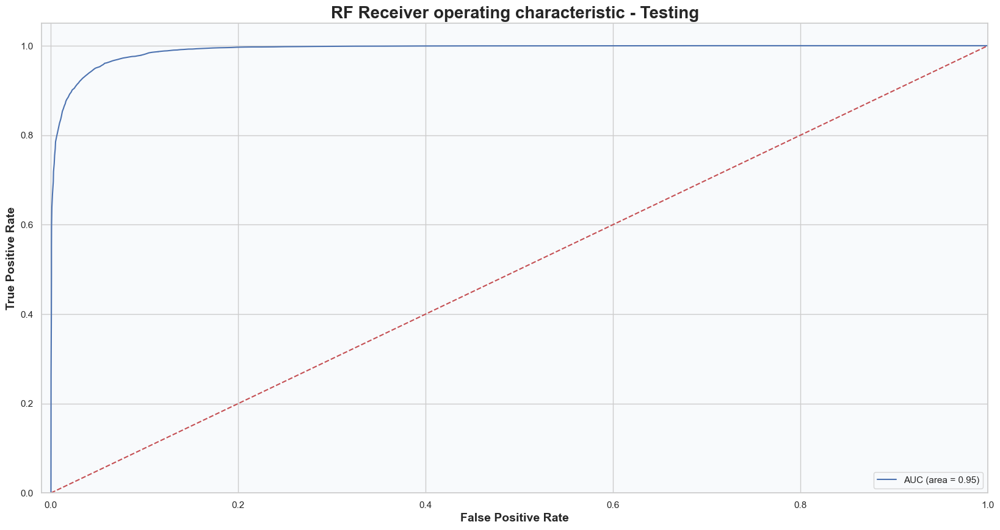

In [338]:
# ROC curve Testing
rf_roc_auc = roc_auc_score(y_test, y_pred_rf_test)
fpr, tpr, thresholds = roc_curve(y_test, rf_model.predict_proba(X_test)[:, 1])

plt.figure(figsize=(20, 10))

plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % rf_roc_auc)
plt.plot([0, 1], [0, 1],'r--')

plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])

plt.xlabel('False Positive Rate', fontsize=14, fontweight='bold')
plt.ylabel('True Positive Rate', fontsize=14, fontweight='bold')
plt.title('RF Receiver operating characteristic - Testing', fontsize=20, fontweight='bold')
plt.legend(loc="lower right")

plt.show()


In [339]:
# ROC curve - Testing [Using Plotly]
rf_roc_auc = roc_auc_score(y_test, y_pred_rf_test)
fpr, tpr, thresholds = roc_curve(y_test, rf_model.predict_proba(X_test)[:, 1])

# Create Plotly figure
fig = go.Figure()

# Add ROC curve trace
fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name='AUC (area = %0.2f)' % rf_roc_auc))

# Add reference line
fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', line=dict(dash='dash'), name='Random'))

# Set layout
fig.update_layout(
    title='RF Receiver Operating Characteristic - Testing',
    xaxis=dict(title='False Positive Rate', titlefont=dict(size=14, color='black', family='Arial, sans-serif')),
    yaxis=dict(title='True Positive Rate', titlefont=dict(size=14, color='black', family='Arial, sans-serif')),
    showlegend=True,
    legend=dict(x=1, y=1, traceorder='normal', font=dict(size=12, family='Arial, sans-serif')),
)

# Show the plot
fig.show()


In [340]:
# (RF Model Tuning) -- Grid Search Cross Validation
rf_model_params = {
    "n_estimators": [100,200,500,1000],
    "max_features": [3,5,7,8],
    "min_samples_split": [2,5,10,20]
}

rf_model_params


{'n_estimators': [100, 200, 500, 1000],
 'max_features': [3, 5, 7, 8],
 'min_samples_split': [2, 5, 10, 20]}

In [341]:
rf_model_cv = RandomForestClassifier(random_state = 42)


In [342]:
rf_model_cvgs = GridSearchCV(rf_model_cv, rf_model_params,
                         cv = 5,
                         n_jobs = -1,
                         verbose = 2).fit(X_train, y_train)


Fitting 5 folds for each of 64 candidates, totalling 320 fits


[CV] END max_features=3, min_samples_split=2, n_estimators=100; total time=  12.9s
[CV] END max_features=3, min_samples_split=2, n_estimators=100; total time=  12.9s
[CV] END max_features=3, min_samples_split=2, n_estimators=100; total time=  13.0s
[CV] END max_features=3, min_samples_split=2, n_estimators=100; total time=  13.0s
[CV] END max_features=3, min_samples_split=2, n_estimators=100; total time=  11.8s
[CV] END max_features=3, min_samples_split=2, n_estimators=200; total time=  26.2s
[CV] END max_features=3, min_samples_split=2, n_estimators=200; total time=  26.3s
[CV] END max_features=3, min_samples_split=2, n_estimators=200; total time=  26.9s
[CV] END max_features=3, min_samples_split=2, n_estimators=200; total time=  29.6s
[CV] END max_features=3, min_samples_split=2, n_estimators=200; total time=  25.6s
[CV] END max_features=3, min_samples_split=2, n_estimators=500; total time= 1.0min
[CV] END max_features=3, min_samples_split=2, n_estimators=500; total time= 1.0min
[CV]

In [343]:
rf_model_cvgs.best_params_


{'max_features': 7, 'min_samples_split': 2, 'n_estimators': 1000}

In [344]:
rf_model_cvgs.best_score_


0.9497126174619103

In [345]:
# RF Model with CV
rf_model_tuned_cvgs =RandomForestClassifier(random_state = 42,
                                            max_features = 7,
                                            min_samples_split = 2,
                                            n_estimators = 1000).fit(X_train, y_train)


In [346]:
# Training Set Estimation With CV
y_pred_rf_cv_train = rf_model_tuned_cvgs.predict(X_train) 
y_pred_rf_cv_train


array([0, 0, 0, ..., 0, 1, 1])

In [347]:
# Training Probabilities With CV
y_pred_rf_cv_train_Proba = rf_model_tuned_cvgs.predict_proba(X_train) 
y_pred_rf_cv_train_Proba


array([[1.   , 0.   ],
       [0.998, 0.002],
       [1.   , 0.   ],
       ...,
       [0.982, 0.018],
       [0.001, 0.999],
       [0.009, 0.991]])

In [348]:
# Training Classification Report with CV
print("================== RF with CV Training Classification Report ==================\n") 
print(classification_report(y_train, y_pred_rf_cv_train))

================== RF with CV Training Classification Report ==================

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     27329
           1       1.00      1.00      1.00     27476

    accuracy                           1.00     54805
   macro avg       1.00      1.00      1.00     54805
weighted avg       1.00      1.00      1.00     54805



In [349]:
# Make predictions on the training set with CV
y_pred_rf_cv_train = rf_model_tuned_cvgs.predict_proba(X_train)[:, 1] 

# Evaluate the model 
print('=' * 47) 
print('======== RF with CV Training Classification Report ========') 
print('=' * 47) 

thresh = 0.5 

rf_CV_train_auc, rf_CV_train_accuracy, rf_CV_train_recall, rf_CV_train_precision, rf_CV_train_specificity, rf_CV_train_f1, rf_CV_train_log_loss = print_report(y_train, y_pred_rf_cv_train, thresh)


======== RF with CV Training Classification Report ========
AUC: 1.000
Accuracy: 1.000
Recall: 1.000
Precision: 1.000
Specificity: 1.000
Popularity: 0.501
F1: 1.000
Log Loss: 0.035
--------------------
---------- Confusion Matrix ----------

+----------------+---------+
| Metric         |   Value |
+================+=========+
| True Negative  |   27327 |
+----------------+---------+
| False Positive |       2 |
+----------------+---------+
| False Negative |       0 |
+----------------+---------+
| True Positive  |   27476 |
+----------------+---------+
 


In [350]:
# Testing Set Estimation 
y_pred_rf_cv_test = rf_model_tuned_cvgs.predict(X_test) 
y_pred_rf_cv_test


array([1, 1, 1, ..., 0, 1, 0])

In [351]:
# Testing Probabilities With CV 
y_pred_rf_cv_test_Proba = rf_model_tuned_cvgs.predict_proba(X_test) 
y_pred_rf_cv_test_Proba


array([[0.001, 0.999],
       [0.001, 0.999],
       [0.001, 0.999],
       ...,
       [0.936, 0.064],
       [0.237, 0.763],
       [0.951, 0.049]])

In [352]:
# RF Testing Classification Report 
print("================== RF with CV Testing Classification Report ==================\n") 
print(classification_report(y_test, y_pred_rf_cv_test))


================== RF with CV Testing Classification Report ==================

              precision    recall  f1-score   support

           0       0.97      0.93      0.95      9208
           1       0.93      0.97      0.95      9061

    accuracy                           0.95     18269
   macro avg       0.95      0.95      0.95     18269
weighted avg       0.95      0.95      0.95     18269



In [353]:
# RF Testing Classification Report 
# Make predictions on the testing set with CV
y_pred_rf_cv_test = rf_model_tuned_cvgs.predict_proba(X_test)[:, 1] 

# Evaluate the model 
print('=' * 47) 
print('======== RF with CV Testing Classification Report ========') 
print('=' * 47) 

thresh = 0.5 

rf_CV_test_auc, rf_CV_test_accuracy, rf_CV_test_recall, rf_CV_test_precision, rf_CV_test_specificity, rf_CV_test_f1, rf_CV_test_log_loss = print_report(y_test, y_pred_rf_cv_test, thresh)


======== RF with CV Testing Classification Report ========
AUC: 0.991
Accuracy: 0.951
Recall: 0.968
Precision: 0.935
Specificity: 0.933
Popularity: 0.496
F1: 0.951
Log Loss: 0.129
--------------------
---------- Confusion Matrix ----------

+----------------+---------+
| Metric         |   Value |
+================+=========+
| True Negative  |    8598 |
+----------------+---------+
| False Positive |     610 |
+----------------+---------+
| False Negative |     289 |
+----------------+---------+
| True Positive  |    8772 |
+----------------+---------+
 


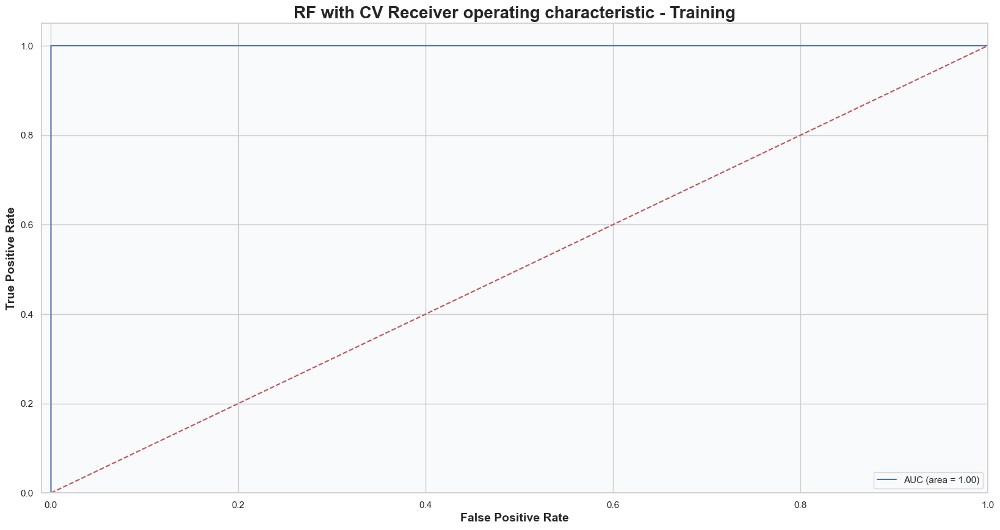

In [354]:
# ROC curve - Training with CV
rf_roc_auc = roc_auc_score(y_train, y_pred_rf_cv_train) 
fpr, tpr, thresholds = roc_curve(y_train, rf_model_tuned_cvgs.predict_proba(X_train)[:, 1]) 

plt.figure(figsize=(20, 10)) 

plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % rf_roc_auc) 
plt.plot([0, 1], [0, 1],'r--') 
plt.xlim([-0.01, 1.0]) 
plt.ylim([0.0, 1.05]) 
plt.xlabel('False Positive Rate', fontsize=14, fontweight='bold') 
plt.ylabel('True Positive Rate', fontsize=14, fontweight='bold') 
plt.title('RF with CV Receiver operating characteristic - Training', fontsize=20, fontweight='bold') 
plt.legend(loc="lower right") 

plt.show()


In [355]:
# ROC curve - Training with CV (Using Plotly)
rf_roc_auc = roc_auc_score(y_train, y_pred_rf_cv_train) 
fpr, tpr, thresholds = roc_curve(y_train, rf_model_tuned_cvgs.predict_proba(X_train)[:, 1])  

# Create Plotly figure 
fig = go.Figure() 

# Add ROC curve trace 
fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name='AUC (area = %0.2f)' % rf_roc_auc)) 

# Add reference line 
fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', line=dict(dash='dash'), name='Random')) 

# Set layout 
fig.update_layout( title='RF Receiver Operating Characteristic - Training', xaxis=dict(title='False Positive Rate', titlefont=dict(size=14, 
                    color='black', family='Arial, sans-serif')), yaxis=dict(title='True Positive Rate', titlefont=dict(size=14, color='black', 
                    family='Arial, sans-serif')), showlegend=True, legend=dict(x=1, y=1, traceorder='normal', 
                    font=dict(size=12, family='Arial, sans-serif')), ) 

# Show the plot 
fig.show()


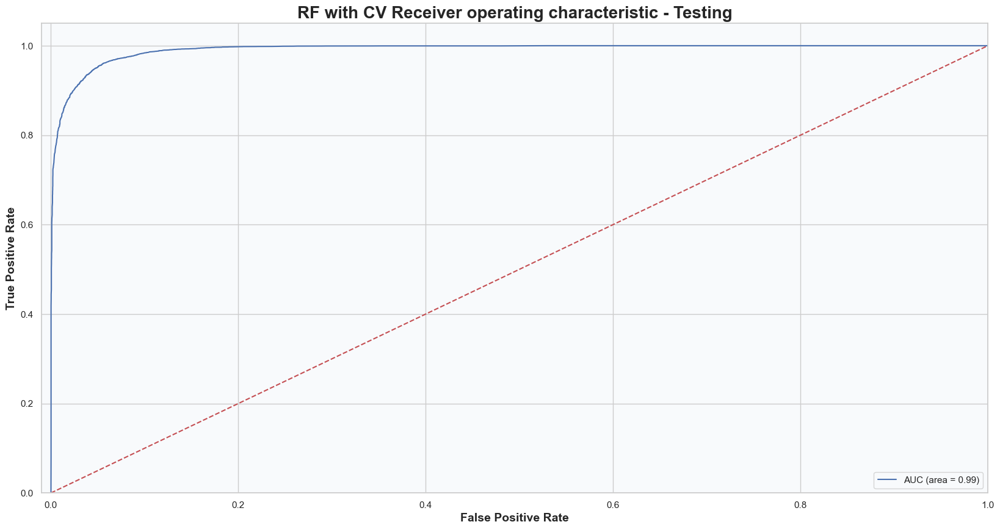

In [356]:
# ROC curve - Testing with CV
rf_roc_auc_cv_testing = roc_auc_score(y_test, y_pred_rf_cv_test) 
fpr, tpr, thresholds = roc_curve(y_test, rf_model_tuned_cvgs.predict_proba(X_test)[:, 1]) 

plt.figure(figsize=(20, 10)) 

plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % rf_roc_auc_cv_testing) 
plt.plot([0, 1], [0, 1],'r--') 
plt.xlim([-0.01, 1.0]) 
plt.ylim([0.0, 1.05]) 
plt.xlabel('False Positive Rate', fontsize=14, fontweight='bold') 
plt.ylabel('True Positive Rate', fontsize=14, fontweight='bold') 
plt.title('RF with CV Receiver operating characteristic - Testing', fontsize=20, fontweight='bold') 
plt.legend(loc="lower right") 

plt.show()


In [357]:
# ROC curve - Testing with CV (Using Plotly)
rf_roc_auc_cv_testing = roc_auc_score(y_test, y_pred_rf_cv_test) 
fpr, tpr, thresholds = roc_curve(y_test, rf_model_tuned_cvgs.predict_proba(X_test)[:, 1])  

# Create Plotly figure 
fig = go.Figure() 

# Add ROC curve trace 
fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name='AUC (area = %0.2f)' % dt_roc_auc_cv_testing)) 

# Add reference line 
fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', line=dict(dash='dash'), name='Random')) 

# Set layout 
fig.update_layout( title='RF Receiver Operating Characteristic - Testing', xaxis=dict(title='False Positive Rate', titlefont=dict(size=14, 
                    color='black', family='Arial, sans-serif')), yaxis=dict(title='True Positive Rate', titlefont=dict(size=14, color='black', 
                    family='Arial, sans-serif')), showlegend=True, legend=dict(x=1, y=1, traceorder='normal', 
                    font=dict(size=12, family='Arial, sans-serif')), ) 

# Show the plot 
fig.show()


#### SVM - Support Vector Machine

In [358]:
# Support Vector Machine
svm_model = SVC(kernel = "linear", probability=True, random_state = 42)
svm_model.fit(X_train, y_train)


SVC(kernel='linear', probability=True, random_state=42)

In [359]:
svm_model.intercept_

array([-6428.13772198])

In [360]:
svm_model.coef_

array([[   1.44372009,   -9.03317751,  -98.83319721,   -8.39268149,
        -461.37502907,  -96.04820156, -145.86157442, -687.76989908,
         -52.84433438,  -87.71639493,    2.82640081,  -78.14057711,
         193.        , -366.69086223,  -29.30168501, -572.00203742,
         389.26381771,   22.7799879 ,  239.32316374,   -5.86810943,
         -88.37694575,   89.30913777]])

In [361]:
svm_model.class_weight_


array([1., 1.])

In [362]:
svm_model.feature_names_in_


array(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact_type', 'month', 'day_of_week', 'last_contact_duration',
       'campaign', 'passed_days', 'previous', 'previous_outcome',
       'employment_variation_rate', 'consumer_price_index',
       'consumer_confidence_index', 'euribor3m', 'number_of_employees',
       'age_band', 'new_passed_days'], dtype=object)

In [363]:
svm_model.n_features_in_

22

In [364]:
# Training Set Estimation 
y_pred_svm_train = svm_model.predict(X_train)
y_pred_svm_train


array([0, 0, 0, ..., 0, 1, 1])

In [365]:
# Training Probabilities 
y_pred_svm_train_Proba = svm_model.predict_proba(X_train) 
y_pred_svm_train_Proba


array([[0.99497446, 0.00502554],
       [0.95580427, 0.04419573],
       [0.98019249, 0.01980751],
       ...,
       [0.78218813, 0.21781187],
       [0.07611467, 0.92388533],
       [0.5       , 0.5       ]])

In [366]:
# Training Classification Report 
print("================== SVM Training Classification Report ==================\n") 
print(classification_report(y_train, y_pred_svm_train))


================== SVM Training Classification Report ==================

              precision    recall  f1-score   support

           0       0.73      0.93      0.82     27329
           1       0.90      0.66      0.76     27476

    accuracy                           0.79     54805
   macro avg       0.82      0.79      0.79     54805
weighted avg       0.82      0.79      0.79     54805



In [367]:
# Make predictions on the training set 
y_train_svm_preds = svm_model.predict_proba(X_train)[:, 1] 

# Evaluate the model 
print('=' * 47) 
print('======== SVM Training Classification Report ========') 
print('=' * 47) 

thresh = 0.5 

svm_train_auc, svm_train_accuracy, svm_train_recall, svm_train_precision, svm_train_specificity, svm_train_f1, svm_train_log_loss = print_report(y_train, y_pred_svm_train, thresh)

======== SVM Training Classification Report ========
AUC: 0.793
Accuracy: 0.793
Recall: 0.656
Precision: 0.904
Specificity: 0.930
Popularity: 0.501
F1: 0.760
Log Loss: 7.477
--------------------
---------- Confusion Matrix ----------

+----------------+---------+
| Metric         |   Value |
+================+=========+
| True Negative  |   25421 |
+----------------+---------+
| False Positive |    1908 |
+----------------+---------+
| False Negative |    9461 |
+----------------+---------+
| True Positive  |   18015 |
+----------------+---------+
 


In [368]:
confusion_matrix(y_train, y_pred_svm_train)


array([[25421,  1908],
       [ 9461, 18015]])

In [369]:
# Testing Set Estimation 
y_pred_svm_test = svm_model.predict(X_test) 
y_pred_svm_test


array([1, 1, 1, ..., 0, 0, 0])

In [370]:
# Testing Probabilities 
y_pred_svm_test_Proba = svm_model.predict_proba(X_test) 
y_pred_svm_test_Proba


array([[0.4685517 , 0.5314483 ],
       [0.04723136, 0.95276864],
       [0.04898325, 0.95101675],
       ...,
       [0.88632667, 0.11367333],
       [0.77707246, 0.22292754],
       [0.87123751, 0.12876249]])

In [371]:
# Testing Classification Report 
print("================== SVM Testing Classification Report ==================\n") 
print(classification_report(y_test, y_pred_svm_test))


================== SVM Testing Classification Report ==================

              precision    recall  f1-score   support

           0       0.73      0.93      0.82      9208
           1       0.90      0.66      0.76      9061

    accuracy                           0.79     18269
   macro avg       0.81      0.79      0.79     18269
weighted avg       0.81      0.79      0.79     18269



In [372]:
# Testing Classification Report 
# Make predictions on the training set 
y_test_preds = svm_model.predict_proba(X_test)[:, 1] 

# Evaluate the model 
print('=' * 47) 
print('======== SVM Testing Classification Report ========') 
print('=' * 47) 

thresh = 0.5 

svm_test_auc, svm_test_accuracy, svm_test_recall, svm_test_precision, svm_test_specificity, svm_test_f1, svm_test_log_loss = print_report(y_test, y_pred_svm_test, thresh)


======== SVM Testing Classification Report ========
AUC: 0.791
Accuracy: 0.792
Recall: 0.657
Precision: 0.897
Specificity: 0.925
Popularity: 0.496
F1: 0.758
Log Loss: 7.487
--------------------
---------- Confusion Matrix ----------

+----------------+---------+
| Metric         |   Value |
+================+=========+
| True Negative  |    8521 |
+----------------+---------+
| False Positive |     687 |
+----------------+---------+
| False Negative |    3108 |
+----------------+---------+
| True Positive  |    5953 |
+----------------+---------+
 


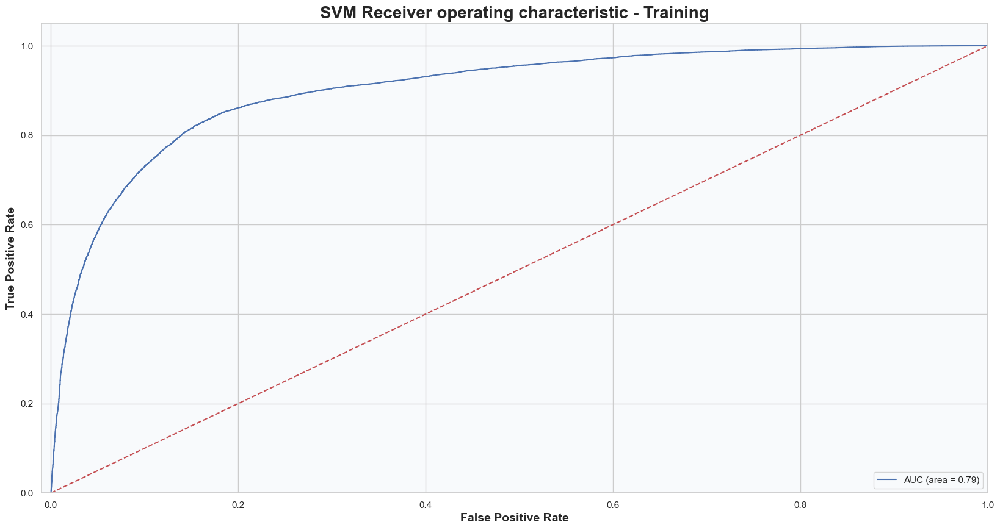

In [373]:
# ROC curve - Training
svm_roc_auc = roc_auc_score(y_train, y_pred_svm_train) 
fpr, tpr, thresholds = roc_curve(y_train, svm_model.predict_proba(X_train)[:, 1]) 

plt.figure(figsize=(20, 10)) 

plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % svm_roc_auc) 

plt.plot([0, 1], [0, 1],'r--') 
plt.xlim([-0.01, 1.0]) 
plt.ylim([0.0, 1.05]) 

plt.xlabel('False Positive Rate', fontsize=14, fontweight='bold') 
plt.ylabel('True Positive Rate', fontsize=14, fontweight='bold') 
plt.title('SVM Receiver operating characteristic - Training', fontsize=20, fontweight='bold') 
plt.legend(loc="lower right") 

plt.show()


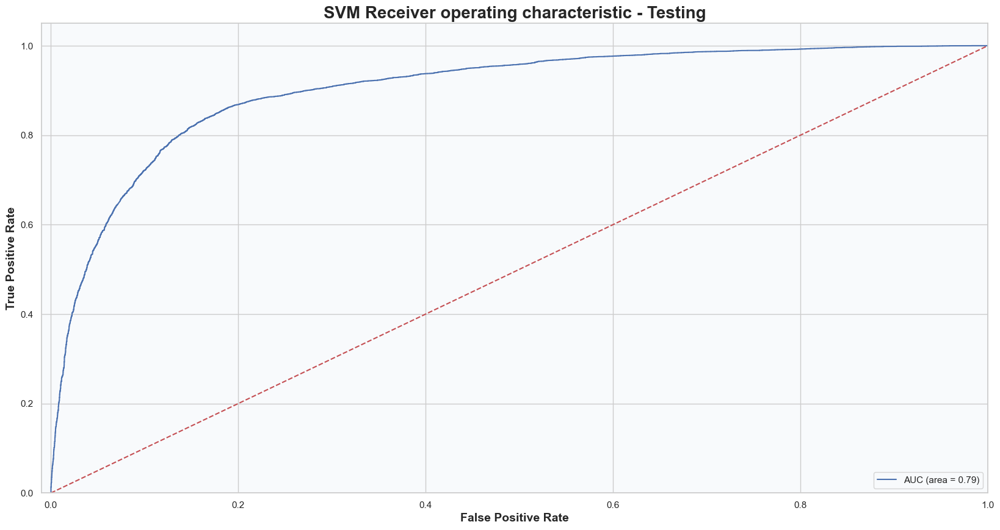

In [374]:
# ROC curve Testing 
svm_roc_auc = roc_auc_score(y_test, y_pred_svm_test) 
fpr, tpr, thresholds = roc_curve(y_test, svm_model.predict_proba(X_test)[:, 1]) 

plt.figure(figsize=(20, 10)) 

plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % svm_roc_auc) 

plt.plot([0, 1], [0, 1],'r--') 
plt.xlim([-0.01, 1.0]) 
plt.ylim([0.0, 1.05]) 
plt.xlabel('False Positive Rate', fontsize=14, fontweight='bold') 
plt.ylabel('True Positive Rate', fontsize=14, fontweight='bold') 
plt.title('SVM Receiver operating characteristic - Testing', fontsize=20, fontweight='bold') 
plt.legend(loc="lower right") 

plt.show()


In [375]:
# (SVM Model Tuning) -- Grid Search Cross Validation 
svm_model_params = {
    "C": np.arange(1,10), 
    "kernel": ["linear","rbf"]
}

svm_model_params


{'C': array([1, 2, 3, 4, 5, 6, 7, 8, 9]), 'kernel': ['linear', 'rbf']}

In [376]:
svm_model_cv = SVC(probability=True, random_state = 42)


In [377]:
# svm_model_cvgs = GridSearchCV(svm_model_cv, svm_model_params, cv = 5, n_jobs = -1, verbose = 2).fit(X_train, y_train)
# Need more time

### Analyze results before Cross Validation

In [379]:
# Analyze testing results
# Create a DataFrame to store the results
test_results_df = pd.DataFrame({
    'Algorithm': ['Logistic Regression', 'Support Vector Machine', 'K Nearest Neighbors', 'Decision Tree', 'Random Forest'],
    'AUC': [lr_test_auc, svm_test_auc, knn_test_auc, dt_test_auc, rf_test_auc],
    'Accuracy': [lr_test_accuracy, svm_test_accuracy, knn_test_accuracy, dt_test_accuracy, rf_test_accuracy],
    'Recall': [lr_test_recall, svm_test_recall, knn_test_recall, dt_test_recall, rf_test_recall],
    'Precision': [lr_test_precision, svm_test_precision, knn_test_precision, dt_test_precision, rf_test_precision],
    'Specificity': [lr_test_specificity, svm_test_specificity, knn_test_specificity, dt_test_specificity, rf_test_specificity],
    'F1 Score': [lr_test_f1, svm_test_f1, knn_test_f1, dt_test_f1, rf_test_f1], 
    'Log Loss': [lr_test_log_loss, svm_test_log_loss, knn_test_log_loss, dt_test_log_loss, rf_test_log_loss]
})


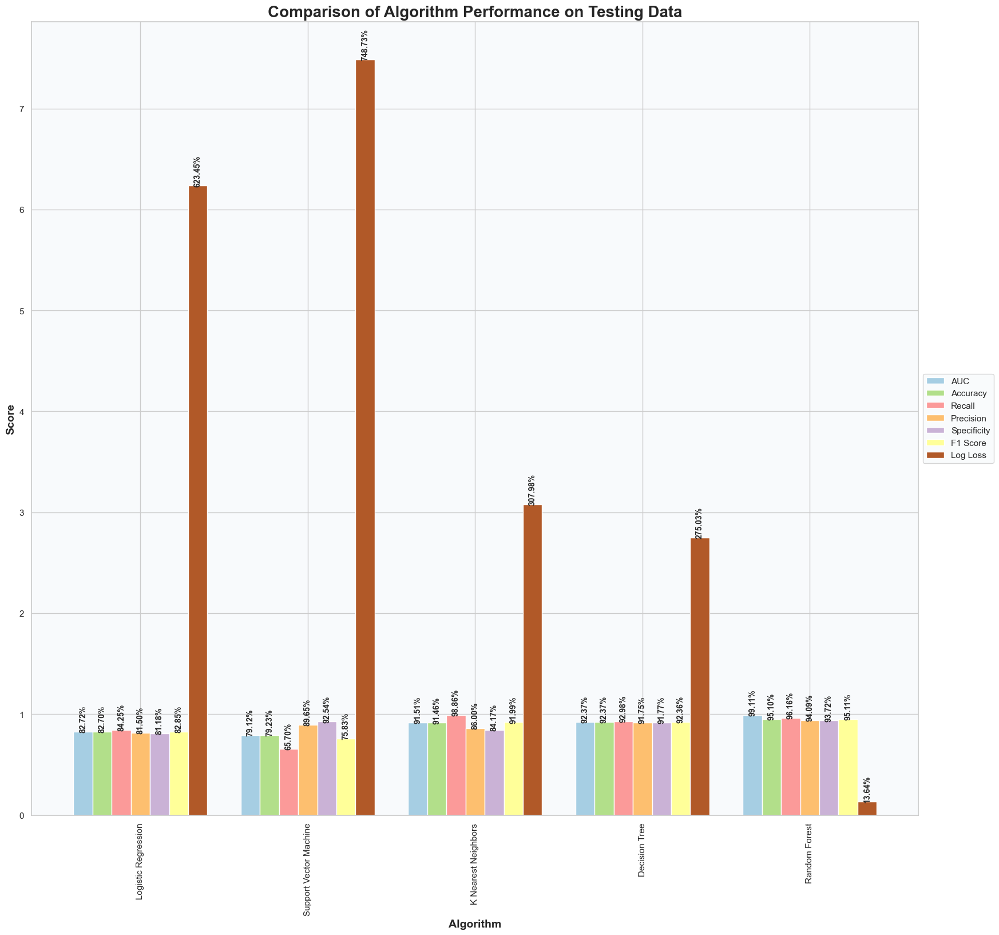

In [381]:
# Set the Algorithm column as the index for better plotting
ax = test_results_df.plot(kind='bar', colormap='Paired', width=0.8, figsize=(20, 18))

# Add borders to the plot
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)

# Display percentage values on top of each bar
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    offset = 0.01
    ax.annotate(f'{height:.2%}', (x + width/2, y + height + offset), ha='center', fontsize=10, fontweight='bold', rotation=90)

plt.title('Comparison of Algorithm Performance on Testing Data', fontsize=20, fontweight='bold')
plt.xlabel('Algorithm', fontsize=14, fontweight='bold')
plt.ylabel('Score', fontsize=14, fontweight='bold')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


In [384]:
# Using Plotly
# Normalize the results_df to percentages
results_df_percentage = test_results_df.div(test_results_df.sum(axis=1), axis=0) * 100

# Create a bar plot using Plotly
fig = px.bar(results_df_percentage.reset_index(), 
             x='Algorithm', 
             y=['AUC', 'Accuracy', 'Recall', 'Precision', 'Specificity', 'F1 Score', 'Log Loss'],
             title='Comparison of Algorithm Performance on Testing Data',
             labels={'value': 'Percentage', 'variable': 'Metric'},
             barmode='group')

# Show the plot
fig.show()


### Analyze results after Cross Validation

In [385]:
# Analyze testing results
# Create a DataFrame to store the results
cv_test_results_df = pd.DataFrame({
    'Algorithm': ['K Nearest Neighbors', 'Decision Tree', 'Random Forest'],
    'AUC': [knn_CV_test_auc, dt_CV_test_auc, rf_CV_test_auc],
    'Accuracy': [knn_CV_test_accuracy, dt_CV_test_accuracy, rf_CV_test_accuracy],
    'Recall': [knn_CV_test_recall, dt_CV_test_recall, rf_CV_test_recall],
    'Precision': [knn_CV_test_precision, dt_CV_test_precision, rf_CV_test_precision],
    'Specificity': [knn_CV_test_specificity, dt_CV_test_specificity, rf_CV_test_specificity],
    'F1 Score': [knn_CV_test_f1, dt_CV_test_f1, rf_CV_test_f1], 
    'Log Loss': [knn_CV_test_log_loss, dt_CV_test_log_loss, rf_CV_test_log_loss]
})

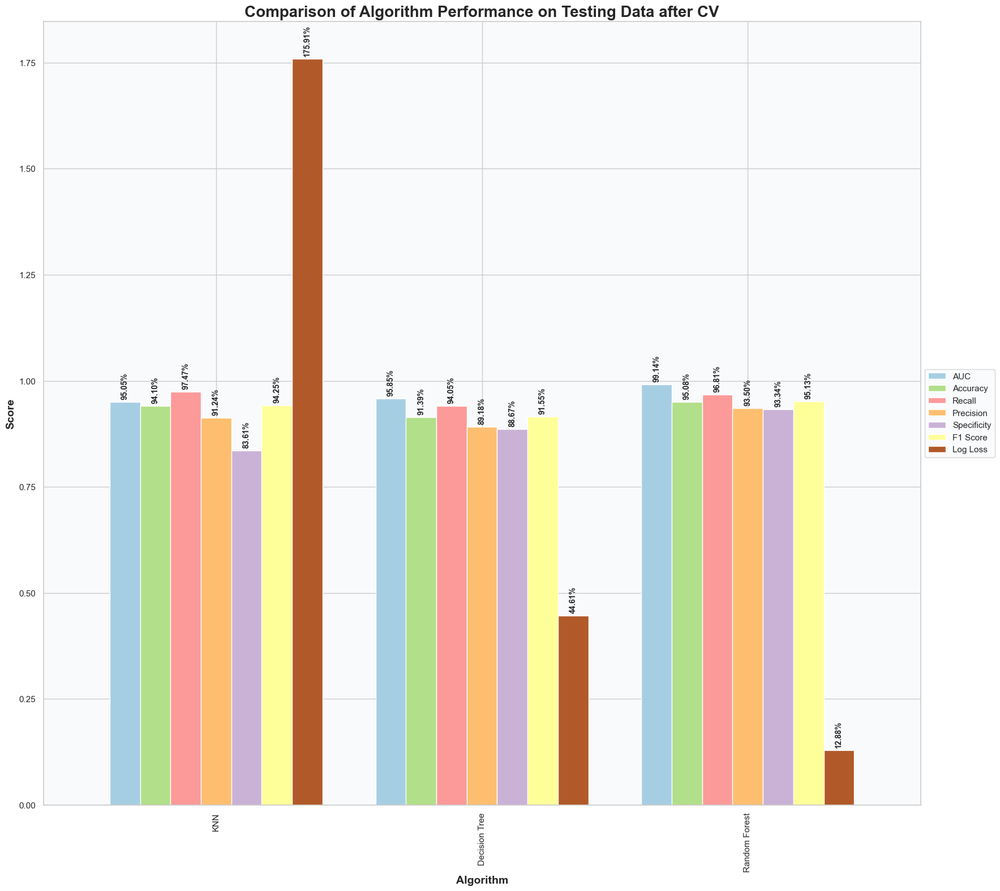

In [390]:
# Set the Algorithm column as the index for better plotting
ax = cv_test_results_df.plot(kind='bar', colormap='Paired', width=0.8, figsize=(20, 18), x='Algorithm')

# Add borders to the plot
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)

# Display percentage values on top of each bar
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    offset = 0.01
    ax.annotate(f'{height:.2%}', (x + width/2, y + height + offset), ha='center', fontsize=10, fontweight='bold', rotation=90)

plt.title('Comparison of Algorithm Performance on Testing Data after CV', fontsize=20, fontweight='bold')
plt.xlabel('Algorithm', fontsize=14, fontweight='bold')
plt.ylabel('Score', fontsize=14, fontweight='bold')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


In [399]:
# Using Plotly
# Normalize the results_df to percentages
results_df_percentage = cv_test_results_df.set_index('Algorithm').div(cv_test_results_df.set_index('Algorithm').sum(axis=1), axis=0) * 100

# Create a bar plot using Plotly
fig = px.bar(results_df_percentage, 
             title='Comparison of Algorithm Performance on Testing Data after CV',
             labels={'value': 'Percentage', 'variable': 'Metric'},
             barmode='group')

# Add borders to the bars
fig.update_traces(marker_line_color='black', marker_line_width=1)

# Show the plot
fig.show()



#### Feature Importance

In [429]:
# Feature importance for Logistic regression, Support Vector Machine and KNN
def plot_feature_importance_lr_svm(model, feature_names, algorithm_name, palette, edgecolor):
    if hasattr(model, 'coef_'):
        # For Logistic Regression
        importances = model.coef_[0]
    elif hasattr(model, 'coef'):
        # For Linear SVM
        importances = model.coef_[0]
    else:
        raise ValueError("The specified model does not support feature importances.")

    # Create a DataFrame to store feature names and importances
    feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

    # Sort the DataFrame by importance in descending order
    feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

    # Plot the feature importances
    plt.figure(figsize=(20, 10))
    sns.barplot(x='Feature', y='Importance', data=feature_importance_df, palette=palette, edgecolor=edgecolor)

    # Add percentage labels above each bar
    for i, val in enumerate(feature_importance_df['Importance']):
        plt.text(i, val + 0.005, f'{val*100:.2f}%', ha='center', fontsize=10, fontweight='bold', rotation='vertical')

    plt.title(f'Feature Importance for {algorithm_name}', fontsize=20, fontweight='bold')
    plt.xlabel('Feature', fontsize=12, fontweight='bold')
    plt.ylabel('Importance', fontsize=12, fontweight='bold')
    plt.xticks(rotation=90, ha='right')
    plt.tight_layout()
    plt.show()


In [435]:
def plot_feature_importance_dt_rf(model, feature_names, algorithm_name, palette, edgecolor):
    if not hasattr(model, 'feature_importances_'):
        raise ValueError("The specified model does not support feature importances.")

    # Get feature importances from the model
    importances = model.feature_importances_

    # Create a DataFrame to store feature names and importances
    feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

    # Sort the DataFrame by importance in descending order
    feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

    # Plot the feature importances
    plt.figure(figsize=(20, 10))
    sns.barplot(x='Feature', y='Importance', data=feature_importance_df, palette=palette, edgecolor=edgecolor)

    # Add percentage labels above each bar
    for i, val in enumerate(feature_importance_df['Importance']):
        plt.text(i, val + 0.005, f'{val*100:.2f}%', ha='center', fontsize=10, fontweight='bold', rotation='vertical')

    plt.title(f'Feature Importance for {algorithm_name}', fontsize=20, fontweight='bold')
    plt.xlabel('Feature', fontsize=12, fontweight='bold')
    plt.ylabel('Importance', fontsize=12, fontweight='bold')
    plt.xticks(rotation=90, ha='right')
    plt.tight_layout()
    plt.show()
    

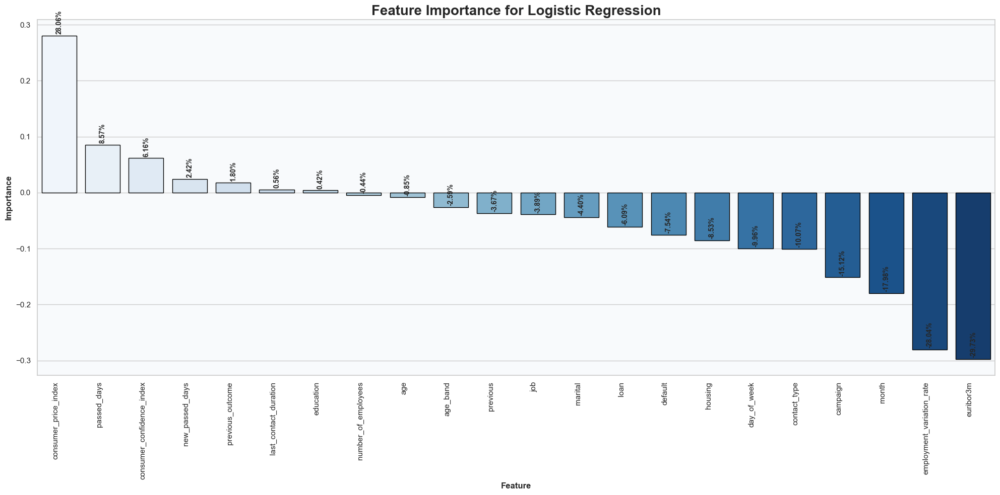

In [431]:
# Logistic Regression
plot_feature_importance_lr_svm(lr, feature_names, 'Logistic Regression', palette='Blues', edgecolor='black')


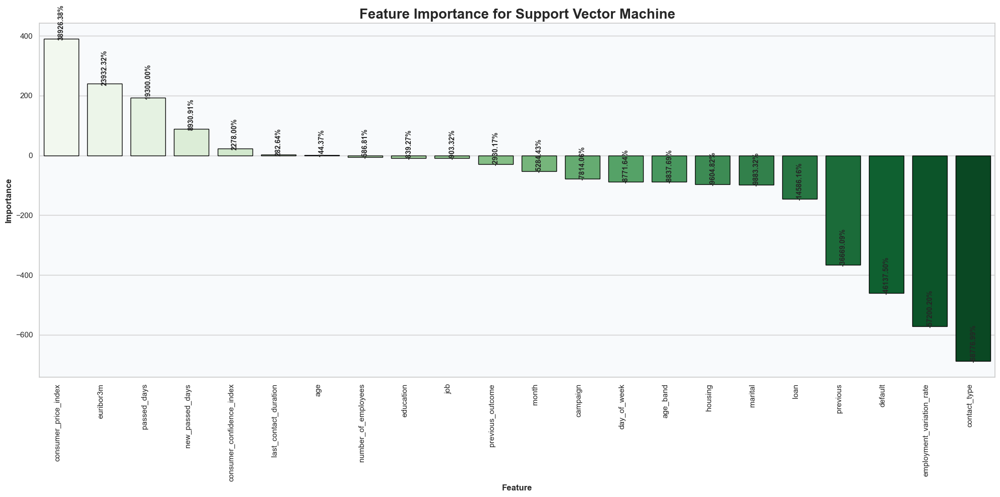

In [432]:
# Support Vector Machine
plot_feature_importance_lr_svm(svm_model, feature_names, 'Support Vector Machine', palette='Greens', edgecolor='black')


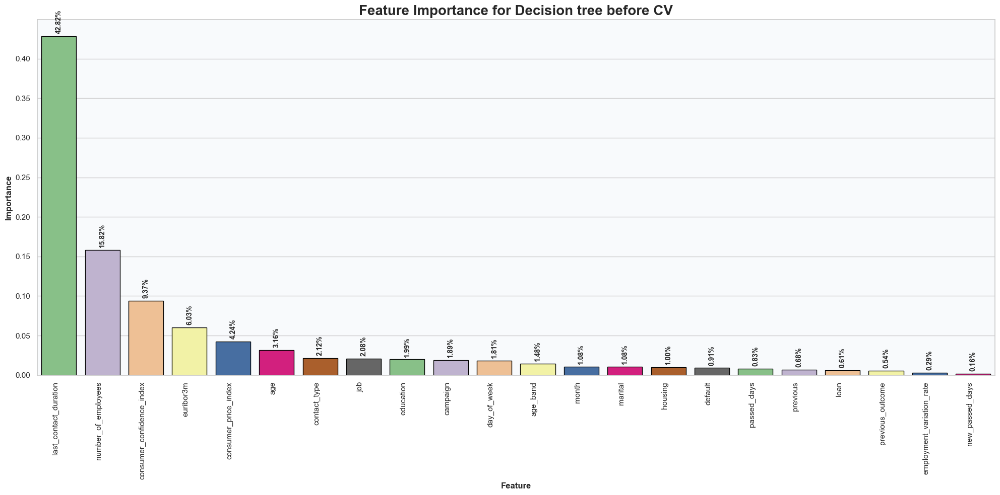

In [436]:
# Decision tree before CV
feature_names = X_train.columns
plot_feature_importance_dt_rf(dt_model, feature_names, 'Decision tree before CV', palette='Accent', edgecolor='black')


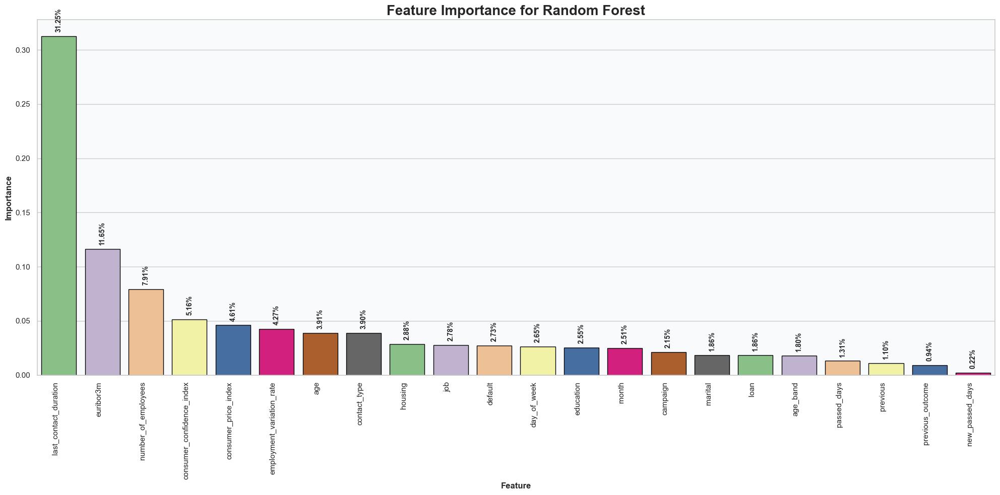

In [437]:
# Random Forest before CV
feature_names = X_train.columns
plot_feature_importance_dt_rf(rf_model, feature_names, 'Random Forest', palette='Accent', edgecolor='black')


#### Feature Importance after Cross Validation

In [409]:
# Feature importance after CV
def plot_feature_importance_after_cv(model, feature_names, algorithm_name, palette, edgecolor):
    if not hasattr(model, 'best_estimator_') or not hasattr(model.best_estimator_, 'feature_importances_'):
        raise ValueError("The specified model does not support feature importances.")

    # Get feature importances from the best_estimator_ attribute of the grid search CV
    importances = model.best_estimator_.feature_importances_

    # Create a DataFrame to store feature names and importances
    feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

    # Sort the DataFrame by importance in descending order
    feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

    # Plot the feature importances
    plt.figure(figsize=(20, 10))
    sns.barplot(x='Feature', y='Importance', data=feature_importance_df, palette=palette, edgecolor=edgecolor)

    # Add percentage labels above each bar
    for i, val in enumerate(feature_importance_df['Importance']):
        plt.text(i, val + 0.005, f'{val*100:.2f}%', ha='center', fontsize=10, fontweight='bold', rotation='vertical')

    plt.title(f'Feature Importance for {algorithm_name}', fontsize=20, fontweight='bold')
    plt.xlabel('Feature', fontsize=12, fontweight='bold')
    plt.ylabel('Importance', fontsize=12, fontweight='bold')
    plt.xticks(rotation=90, ha='right')
    plt.tight_layout()
    plt.show()


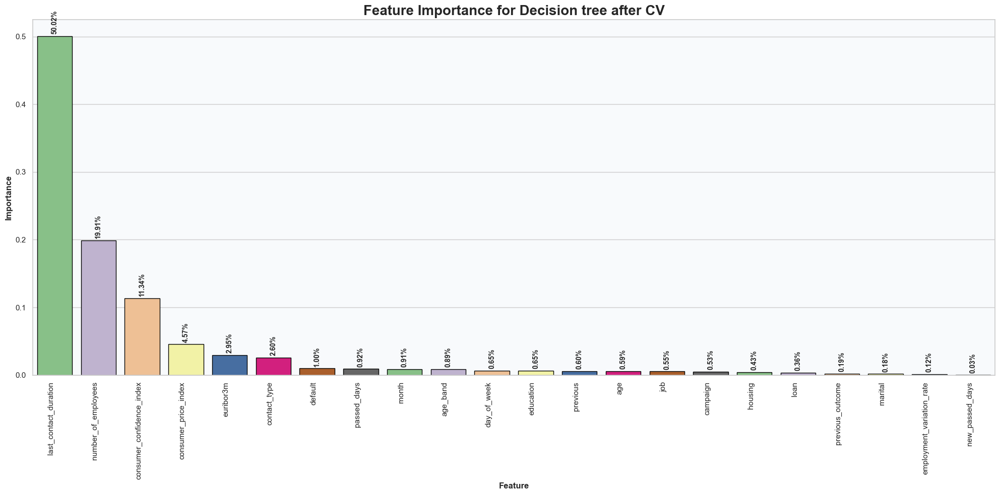

In [410]:
# Decision tree after CV
plot_feature_importance_after_cv(dt_model_cvgs, feature_names, 'Decision tree after CV', palette='Accent', edgecolor='black')


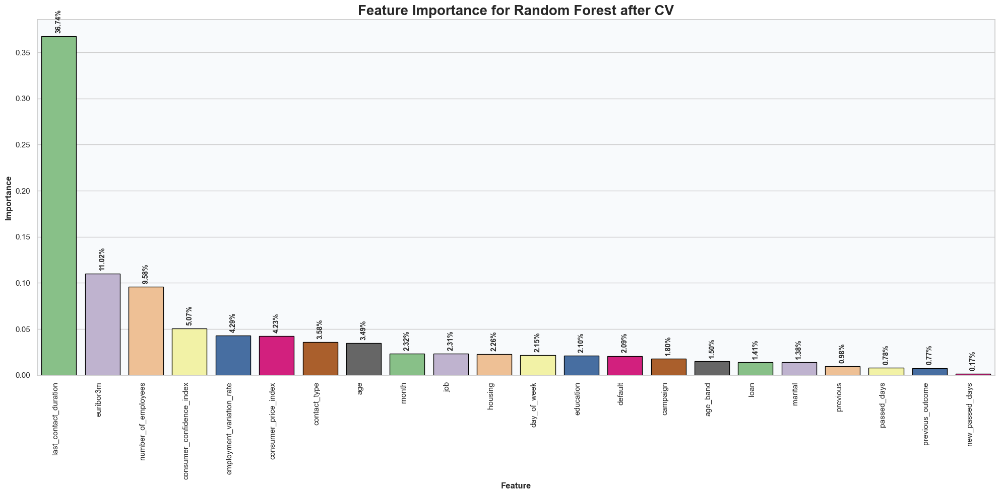

In [411]:
# Random Forest after CV
plot_feature_importance_after_cv(rf_model_cvgs, feature_names, 'Random Forest after CV', palette='Accent', edgecolor='black')
